In [1]:
# Import all the necessary modules
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as mtick
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas_datareader as pdr
import math
import datetime
import itertools
import yfinance as yf
import seaborn as sn
from IPython.display import display, HTML
from trend_following_signal import (apply_jupyter_fullscreen_css, load_financial_data, get_returns_volatility, calculate_slope, trend_signal, slope_signal, 
                             create_trend_strategy, get_close_prices, calculate_donchian_channels)
from strategy_performance import (calculate_sharpe_ratio, calculate_calmar_ratio, calculate_CAGR, calculate_risk_and_performance_metrics,
                                          calculate_compounded_cumulative_returns, estimate_fee_per_trade, rolling_sharpe_ratio)
import coinbase_utils as cn
import strategy_performance as perf
import position_sizing as size
import trend_following_signal as tf
%matplotlib inline

In [2]:
import importlib
importlib.reload(cn)
importlib.reload(perf)
importlib.reload(tf)
importlib.reload(size)

<module 'position_sizing' from '/Users/adheerchauhan/Documents/git/trend_following/position_sizing.py'>

In [3]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns',None)
apply_jupyter_fullscreen_css()

In [4]:
# Target Volatility Position Sizing Strategy for a Trend Following Signal
def apply_target_volatility_position_sizing_strategy(start_date, end_date, ticker_list, fast_mavg, slow_mavg,
                                                     mavg_stepsize, rolling_donchian_window, long_only=False,
                                                     initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                     transaction_cost_est=0.001, passive_trade_rate=0.05,
                                                     use_coinbase_data=True, rolling_sharpe_window=50,
                                                     cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                     annual_trading_days=365, use_specific_start_date=False,
                                                     signal_start_date=None):
    ## Generate Trend Signal for all tickers
    df_trend = tf.get_trend_donchian_signal_for_portfolio(start_date=start_date, end_date=end_date,
                                                          ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                          slow_mavg=slow_mavg,
                                                          mavg_stepsize=mavg_stepsize,
                                                          rolling_donchian_window=rolling_donchian_window,
                                                          long_only=long_only, use_coinbase_data=use_coinbase_data)

    ## Get Volatility Adjusted Trend Signal
    df_signal = get_volatility_adjusted_trend_signal(df_trend, ticker_list, volatility_window, fast_mavg, mavg_stepsize,
                                                     slow_mavg, rolling_donchian_window, annual_trading_days)

    ## Get Daily Positions
    df = get_target_volatility_daily_portfolio_positions(df_signal, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                                         rolling_donchian_window, initial_capital, rolling_cov_window,
                                                         cash_buffer_percentage, annualized_target_volatility,
                                                         transaction_cost_est, passive_trade_rate, annual_trading_days,
                                                         use_specific_start_date, signal_start_date)

    ## Calculate Portfolio Performance
    df = calculate_portfolio_returns(df, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                     rolling_sharpe_window)

    return df

In [5]:
# Get Volatility Adjusted Trend Signal for Target Volatility Strategy
def get_volatility_adjusted_trend_signal(df, ticker_list, volatility_window, fast_mavg, mavg_stepsize, slow_mavg,
                                         rolling_donchian_window, annual_trading_days=365):
    ticker_signal_dict = {}
    final_cols = []
    for ticker in ticker_list:
        trend_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        # trend_returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
        # trend_trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'
        annualized_volatility_col = f'{ticker}_annualized_volatility_{volatility_window}'
        vol_adj_trend_signal_col = f'{ticker}_vol_adjusted_trend_signal'
        lower_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price_t_2'
        upper_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price_t_2'

        ## Calculate Position Volatility Adjusted Trend Signal
        df[f'{ticker}_t_1_close'] = df[f'{ticker}_close'].shift(1)
        df = tf.get_returns_volatility(df, vol_range_list=[volatility_window], close_px_col=f'{ticker}_t_1_close')
        df[annualized_volatility_col] = (df[f'{ticker}_t_1_close_volatility_{volatility_window}'] *
                                         np.sqrt(annual_trading_days))
        df[vol_adj_trend_signal_col] = (df[trend_signal_col] / df[annualized_volatility_col])
        df[vol_adj_trend_signal_col] = df[vol_adj_trend_signal_col].fillna(0)
        trend_cols = [f'{ticker}_close', f'{ticker}_open', f'{ticker}_t_1_close', f'{ticker}_t_1_close_pct_returns',
                      trend_signal_col, lower_donchian_col, upper_donchian_col, annualized_volatility_col,
                      vol_adj_trend_signal_col]
        final_cols.append(trend_cols)
        ticker_signal_dict[ticker] = df[trend_cols]
    df_signal = pd.concat(ticker_signal_dict, axis=1)

    ## Assign new column names to the dataframe
    df_signal.columns = df_signal.columns.to_flat_index()
    final_cols = [item for sublist in final_cols for item in sublist]
    df_signal.columns = final_cols

    ## Normalize the weights of each position by the total weight of the portfolio
    vol_normalized_signal_cols = [f'{ticker}_vol_adjusted_trend_signal' for ticker in ticker_list]
    df_signal[vol_normalized_signal_cols] = df_signal[vol_normalized_signal_cols].fillna(0)
    for ticker in ticker_list:
        df_signal[f'{ticker}_position_volatility_adjusted_weight'] = (df_signal[f'{ticker}_vol_adjusted_trend_signal'] /
                                                                      df_signal[vol_normalized_signal_cols].abs()
                                                                      .sum(axis=1))
        df_signal[f'{ticker}_position_volatility_adjusted_weight'] = df_signal[
            f'{ticker}_position_volatility_adjusted_weight'].fillna(0)

    return df_signal

In [6]:
def get_trend_donchian_signal_for_portfolio(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                            rolling_donchian_window, long_only=False, price_or_returns_calc='price',
                                            use_coinbase_data=True):

    ## Generate trend signal for all tickers
    trend_list = []
    date_list = cn.coinbase_start_date_by_ticker_dict
    for ticker in ticker_list:
        close_price_col = f'{ticker}_close'
        open_price_col = f'{ticker}_open'
        signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        # returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
        # trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'
        lower_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}_t_2'
        upper_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}_t_2'
        if pd.to_datetime(date_list[ticker]).date() > start_date:
            df_trend = generate_trend_signal_with_donchian_channel(
                start_date=pd.to_datetime(date_list[ticker]).date(), end_date=end_date, ticker=ticker,
                fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize,
                rolling_donchian_window=rolling_donchian_window, price_or_returns_calc=price_or_returns_calc,
                long_only=long_only, use_coinbase_data=use_coinbase_data)
        else:
            df_trend = generate_trend_signal_with_donchian_channel(
                start_date=start_date, end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                price_or_returns_calc=price_or_returns_calc, long_only=long_only, use_coinbase_data=use_coinbase_data)
        trend_cols = [close_price_col, open_price_col, signal_col, lower_donchian_col, upper_donchian_col]#returns_col, trades_col]
        df_trend = df_trend[trend_cols]
        trend_list.append(df_trend)

    df_trend = pd.concat(trend_list, axis=1)

    return df_trend

In [13]:
def generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize,
                                                moving_avg_type='exponential', price_or_returns_calc='price',
                                                rolling_donchian_window=20, long_only=False, use_coinbase_data=True):
    # Create Column Names
    donchian_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_signal'
    trend_signal_col = f'{ticker}_trend_signal'
    trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
    strategy_returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
    strategy_trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'

    # Pull Close Prices from Coinbase
    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                        end_date=end_date, save_to_file=False)
    df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
    df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]

    # Generate Trend Signal
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize,
                                      slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={
        f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
        f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))

    # Generate Donchian Channels
    df_donchian = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker,
                                              price_or_returns_calc=price_or_returns_calc,
                                              rolling_donchian_window=rolling_donchian_window,
                                              use_coinbase_data=use_coinbase_data)

    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian[f't_1_close'] = df_donchian[f'close'].shift(1)
    t_1_close_col = f't_1_close'
    donchian_upper_band_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'
    donchian_lower_band_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'
    donchian_middle_band_col = f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'
    df_donchian[f'{donchian_upper_band_col}_t_2'] = df_donchian[donchian_upper_band_col].shift(1)
    df_donchian[f'{donchian_lower_band_col}_t_2'] = df_donchian[donchian_lower_band_col].shift(1)
    df_donchian[f'{donchian_middle_band_col}_t_2'] = df_donchian[donchian_middle_band_col].shift(1)
    df_donchian[donchian_signal_col] = np.where(
        (df_donchian[t_1_close_col] > df_donchian[f'{donchian_upper_band_col}_t_2']), 1,
        np.where((df_donchian[t_1_close_col] < df_donchian[f'{donchian_lower_band_col}_t_2']),
                 -1, 0))

    # Merging the Trend and Donchian Dataframes
    donchian_cols = [f'{donchian_upper_band_col}_t_2', f'{donchian_lower_band_col}_t_2',
                     f'{donchian_middle_band_col}_t_2', donchian_signal_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    # Trend and Donchian Channel Signal
    buy_signal = ((df_trend[donchian_signal_col] == 1) &
                  (df_trend[trend_signal_col] == 1))
    sell_signal = ((df_trend[donchian_signal_col] == -1) &
                   (df_trend[trend_signal_col] == -1))

    # Generate Long Only Signal
    if long_only:
        df_trend[trend_donchian_signal_col] = np.where(buy_signal, 1, 0)
    # Generate Long & Short Signal
    else:
        df_trend[trend_donchian_signal_col] = np.where(buy_signal, 1, np.where(sell_signal, -1, 0))

    df_trend[strategy_returns_col] = df_trend[trend_donchian_signal_col] * df_trend[f'{ticker}_pct_returns']
    df_trend[strategy_trades_col] = df_trend[trend_donchian_signal_col].diff()

    return df_trend

In [15]:
# start_date = pd.to_datetime('2022-01-01').date()
# end_date = pd.to_datetime('2025-03-28').date()
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2021-12-31').date()
ticker_list = ['BTC-USD']
fast_mavg = 50
slow_mavg = 250
mavg_stepsize = 6
rolling_donchian_window = 20
long_only = True
use_coinbase_data = True
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001
passive_trade_rate = 0.05
rolling_sharpe_window = 50

In [28]:
## Generate Trend Signal for all tickers
df_trend = tf.get_trend_donchian_signal_for_portfolio(start_date=start_date, end_date=end_date,
                                                      ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                      slow_mavg=slow_mavg,
                                                      mavg_stepsize=mavg_stepsize,
                                                      rolling_donchian_window=rolling_donchian_window,
                                                      long_only=long_only, use_coinbase_data=use_coinbase_data)

## Get Volatility Adjusted Trend Signal
df_signal = get_volatility_adjusted_trend_signal(df_trend, ticker_list, volatility_window, fast_mavg, mavg_stepsize,
                                                 slow_mavg, rolling_donchian_window, annual_trading_days)

## Get Daily Positions
df = size.get_target_volatility_daily_portfolio_positions(df_signal, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                                     rolling_donchian_window, initial_capital, rolling_cov_window,
                                                     cash_buffer_percentage, annualized_target_volatility,
                                                     transaction_cost_est, passive_trade_rate, annual_trading_days,
                                                     use_specific_start_date, signal_start_date)

## Calculate Portfolio Performance
df = size.calculate_portfolio_returns(df, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                 rolling_sharpe_window)

In [23]:
perf.calculate_risk_and_performance_metrics(df, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions',
                                            include_transaction_costs_and_fees=False, annual_trading_days=365)

{'annualized_return': 0.41878125291384394,
 'annualized_sharpe_ratio': 1.4812871206778893,
 'calmar_ratio': 0.36069842660983703,
 'annualized_std_dev': 0.21870479637077,
 'max_drawdown': -1.1610287764488487,
 'max_drawdown_duration': Timedelta('547 days 00:00:00'),
 'hit_rate': 0.07218880148079593,
 't_statistic': 4.14714904425681,
 'p_value': 3.496594160349296e-05,
 'trade_count': 268.0}

In [19]:
df.tail()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_50_6_250_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-12-27,16439.74,17804.97,0,0.0,0.0,0.0,0.0,0.325700,16698.73,No Event,16916.66,0.0,0.0,0.0,16917.96,0.005285,0.0,0.0,0.0,0.0,0.0,118990.944773,0.0,0.0,0.0,118990.944773,107091.850295,0.0,1.0,0.0,6.93273,0.0,6.93273,8.728128,-1.795399,-0.205703,2022-12-27,80,721 days,False
2022-12-28,16439.74,17804.97,0,0.0,0.0,0.0,0.0,0.324416,16539.66,No Event,16698.31,0.0,0.0,0.0,16698.73,-0.012958,0.0,0.0,0.0,0.0,0.0,118990.944773,0.0,0.0,0.0,118990.944773,107091.850295,0.0,1.0,0.0,6.93273,0.0,6.93273,8.728128,-1.795399,-0.205703,2022-12-28,80,721 days,False
2022-12-29,16439.74,17804.97,0,0.0,0.0,0.0,0.0,0.309080,16627.54,No Event,16539.66,0.0,0.0,0.0,16539.66,-0.009526,0.0,0.0,0.0,0.0,0.0,118990.944773,0.0,0.0,0.0,118990.944773,107091.850295,0.0,1.0,0.0,6.93273,0.0,6.93273,8.728128,-1.795399,-0.205703,2022-12-29,80,721 days,False
2022-12-30,16439.74,17804.97,0,0.0,0.0,0.0,0.0,0.310105,16600.10,No Event,16627.36,0.0,0.0,0.0,16627.54,0.005313,0.0,0.0,0.0,0.0,0.0,118990.944773,0.0,0.0,0.0,118990.944773,107091.850295,0.0,1.0,0.0,6.93273,0.0,6.93273,8.728128,-1.795399,-0.205703,2022-12-30,80,721 days,False
2022-12-31,16439.74,17804.97,0,0.0,0.0,0.0,0.0,0.310058,16530.35,No Event,16599.98,0.0,0.0,0.0,16600.10,-0.001650,0.0,0.0,0.0,0.0,0.0,118990.944773,0.0,0.0,0.0,118990.944773,107091.850295,0.0,1.0,0.0,6.93273,0.0,6.93273,8.728128,-1.795399,-0.205703,2022-12-31,80,721 days,False


In [32]:
df.head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_50_6_250_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-02-01,35066.43,43920.37,0,0.0,0.0,0.0,0.0,0.571326,38716.88,0,38492.53,0.0,0.0,0.0,38491.93,0.015582,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-01,1,505 days,False
2022-02-02,35066.43,43920.37,0,0.0,0.0,0.0,0.0,0.555307,36923.39,No Event,38714.27,0.0,0.0,0.0,38716.88,0.005844,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-02,1,505 days,False
2022-02-03,35066.43,43104.34,0,0.0,0.0,0.0,0.0,0.572651,37329.91,No Event,36923.39,0.0,0.0,0.0,36923.39,-0.046323,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-03,1,505 days,False
2022-02-04,35066.43,43104.34,0,0.0,0.0,0.0,0.0,0.572075,41614.64,No Event,37324.61,0.0,0.0,0.0,37329.91,0.011010,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-04,1,505 days,False
2022-02-05,35066.43,43104.34,0,0.0,0.0,0.0,0.0,0.772829,41404.85,No Event,41613.75,0.0,0.0,0.0,41614.64,0.114780,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2022-02-05,1,505 days,False


In [17]:
from strategy_performance import calculate_risk_and_performance_metrics

import seaborn as sns

def plot_moving_avg_crossover_performance_heatmap(df_performance):
    unique_step_sizes = df_performance['stepsize'].unique()

    # Plotting each heatmap in a loop
    for step in unique_step_sizes:
        subset = df_performance[df_performance['stepsize'] == step]
        pivoted_df_sharpe = subset.pivot(index='slow_mavg', columns='fast_mavg', values='sharpe_ratio')
        pivoted_df_calmar = subset.pivot(index='slow_mavg', columns='fast_mavg', values='calmar_ratio')
        pivoted_df_return = subset.pivot(index='slow_mavg', columns='fast_mavg', values='annualized_return')
        
        fig = plt.figure(figsize=(30,6))
        # plt.style.use('bmh')
        layout = (1,3)
        sharpe_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
        calmar_ax = plt.subplot2grid(layout, (0,1))#, colspan=2)
        return_ax = plt.subplot2grid(layout, (0,2))#, colspan=2)

        sns.heatmap(pivoted_df_sharpe, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=sharpe_ax)
        _ = sharpe_ax.set_title(f'Sharpe Ratio Heatmap\nStep Size: {step}')
        _ = sharpe_ax.set_ylabel('Slow Moving Average (Days)')
        _ = sharpe_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_calmar, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=calmar_ax)
        _ = calmar_ax.set_title(f'Calmar Ratio Heatmap\nStep Size: {step}')
        _ = calmar_ax.set_ylabel('Slow Moving Average (Days)')
        _ = calmar_ax.set_xlabel('Fast Moving Average (Days)')

        sns.heatmap(pivoted_df_return, annot=True, fmt=".2f", cmap='RdYlGn', linewidths=.5, ax=return_ax)
        _ = return_ax.set_title(f'Annualized Return Heatmap\nStep Size: {step}')
        _ = return_ax.set_ylabel('Slow Moving Average (Days)')
        _ = return_ax.set_xlabel('Fast Moving Average (Days)')

        plt.tight_layout()
    
    return

def moving_avg_crossover_strategy_performance(start_date, end_date, ticker_list, fast_mavg_list=np.arange(10, 101, 10), slow_mavg_list=np.arange(50, 501, 50), rolling_donchian_window=20, long_only=True,
                                              initial_capital=15000, rolling_cov_window=20, volatility_window=20, transaction_cost_est=0.001, passive_trade_rate=0.05, use_coinbase_data=True,
                                              rolling_sharpe_window=50, cash_buffer_percentage=0.10, annualized_target_volatility=0.20, annual_trading_days=365, use_specific_start_date=False,
                                              signal_start_date=None):
    
    perf_cols = ['fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
                'hit_rate', 't_statistic', 'p_value', 'trade_count']
    df_performance = pd.DataFrame(columns=perf_cols)
    
    mavg_stepsize_list = [2, 4, 6, 8]
    for slow_mavg in slow_mavg_list:
        for fast_mavg in fast_mavg_list:
            for stepsize in mavg_stepsize_list:
                if fast_mavg < slow_mavg:
                    df = size.apply_target_volatility_position_sizing_strategy(start_date, end_date, ticker_list, fast_mavg, slow_mavg,
                                                                               mavg_stepsize, rolling_donchian_window, long_only, initial_capital,
                                                                               rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                               use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                               annual_trading_days, use_specific_start_date, signal_start_date)
                    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
                    row = {
                        # 'ticker': ticker,
                        'fast_mavg': fast_mavg,
                        'slow_mavg': slow_mavg,
                        'stepsize': stepsize,
                        'annualized_return': performance_metrics['annualized_return'],
                        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                        'calmar_ratio': performance_metrics['calmar_ratio'],
                        'annualized_std_dev': performance_metrics['annualized_std_dev'],
                        'max_drawdown': performance_metrics['max_drawdown'],
                        'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                        'hit_rate': performance_metrics['hit_rate'],
                        't_statistic': performance_metrics['t_statistic'],
                        'p_value': performance_metrics['p_value'],
                        'trade_count': performance_metrics['trade_count']
                    }
                    df_performance = pd.concat([df_performance, pd.DataFrame([row])], ignore_index=True)
    
    return df_performance

In [19]:
def plot_trend_following_performance_time_series(df, df_trend, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window):
    
    start_date = pd.to_datetime(start_date).date().strftime('%Y-%m-%d')
    end_date = pd.to_datetime(end_date).date().strftime('%Y-%m-%d')
    fig = plt.figure(figsize=(22,20))
    layout = (5,2)
    trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
    trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
    trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
    trend_signal_ax2 = trend_signal_ax.twinx()
    trend_rolling_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
    trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
    trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)

    _ = trend_ax.plot(df.index, df[f'{ticker}_t_1_close'], label='Price')
    for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
        _ = trend_ax.plot(df_trend.index, df_trend[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

    _ = trend_ax.set_title(f'{ticker} Moving Average Ribbons - {start_date} - {end_date}')
    _ = trend_ax.set_ylabel('Price')
    _ = trend_ax.set_xlabel('Date')
    _ = trend_ax.legend(loc='upper left')
    _ = trend_ax.grid()

    _ = trend_donchian_ax.plot(df.index, df[f'{ticker}_t_1_close'], label='Price')
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}_t_2'], label='Donchian Upper Band', linestyle='--', linewidth=3)
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}_t_2'], label='Donchian Lower Band', linestyle='--', linewidth=3)

    _ = trend_donchian_ax.set_title(f'{ticker} Donchian Channels')
    _ = trend_donchian_ax.set_ylabel('Price')
    _ = trend_donchian_ax.set_xlabel('Date')
    _ = trend_donchian_ax.legend(loc='upper left')
    _ = trend_donchian_ax.grid()

    _ = trend_signal_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
    _ = trend_signal_ax2.plot(df.index, df[f'{ticker}_t_1_close'], label='Price', alpha=0.8, color='orange', linestyle='--')
    _ = trend_signal_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Signal')
    _ = trend_signal_ax.set_ylabel('Signal')
    _ = trend_signal_ax.set_xlabel('Date')
    _ = trend_signal_ax.legend(loc='upper left')
    _ = trend_signal_ax.grid()

    _ = trend_rolling_sharpe_ax.plot(df.index, df[f'portfolio_rolling_sharpe_50'],
                                     # df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                                     label='Sharpe Ratio', color='orange')
    _ = trend_rolling_sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_xlabel('Date')
    _ = trend_rolling_sharpe_ax.legend(loc='upper left')
    _ = trend_rolling_sharpe_ax.grid()

    _ = trend_return_ax.plot(df.index, df[f'portfolio_daily_pct_returns'],
                             # df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                             label='Return')
    _ = trend_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Return')
    _ = trend_return_ax.set_ylabel('Return')
    _ = trend_return_ax.set_xlabel('Date')
    _ = trend_return_ax.legend(loc='upper left')
    _ = trend_return_ax.grid()

    # _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
    _ = trend_cum_return_ax.plot(df.index, df['strategy_cumulative_return'], label='Cum. Return')
    _ = trend_cum_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Cumulative Return')
    _ = trend_cum_return_ax.set_ylabel('Cum. Return')
    _ = trend_cum_return_ax.set_xlabel('Date')
    _ = trend_cum_return_ax.legend(loc='upper left')
    _ = trend_cum_return_ax.grid()


    plt.tight_layout()
    
    return

In [21]:
def generate_trend_signal_with_donchian_channel_macro(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold,
                                                      final_weighted_multiplicative_signal_threshold,
                                                      donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                      macro_signal_200d_weight, macro_signal_100d_weight,
                                                      moving_avg_type='exponential', price_or_returns_calc='price',
                                                      rolling_donchian_window=20, long_only=False, use_coinbase_data=True):
    # Create Column Names
    donchian_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_signal'
    trend_signal_col = f'{ticker}_trend_signal'
    trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
    strategy_returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
    strategy_trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'

    # Pull Close Prices from Coinbase
    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                        end_date=end_date, save_to_file=False)
    df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
    df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]

    # Generate Trend Signal
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize,
                                      slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={
                    f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                    f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))

    # Calculate Ribbon Slope
    mavg_cols = [f'{ticker}_{int(mavg)}_mavg' for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize)]

    df_trend[f'{ticker}_mavg_ribbon_slope'] = df_trend[mavg_cols].apply(
        calc_ribbon_slope, 
        axis=1, 
        args=(ticker, fast_mavg, slow_mavg, mavg_stepsize)
    )
    df_trend[f'{ticker}_mavg_ribbon_z_score'] = ((df_trend[f'{ticker}_mavg_ribbon_slope'] - df_trend[f'{ticker}_mavg_ribbon_slope'].rolling(window=100).mean())/
                                                 df_trend[f'{ticker}_mavg_ribbon_slope'].rolling(window=100).std())

    # Ribbon Thickness
    # df_trend[f'{ticker}_ribbon_thickness_mod'] = ((df_trend[f'{ticker}_{int(fast_mavg)}_mavg'] - df_trend[f'{ticker}_{int(slow_mavg)}_mavg'])/df_trend[f'{ticker}_close']).shift(1)
    # ma_periods = [int(i) for i in np.linspace(fast_mavg, slow_mavg, mavg_stepsize)]  # Define moving average periods
    # df_trend[f'{ticker}_ribbon_thickness_mod2'] = df_trend[[f'{ticker}_{p}_mavg' for p in ma_periods]].std(axis=1) / df_trend[f'{ticker}_close'].shift(1)
    # ribbon_window = 252  
    # df_trend[f'{ticker}_ribbon_thickness_mod_mean'] = df_trend[f'{ticker}_ribbon_thickness_mod'].rolling(window=ribbon_window).mean()
    # df_trend[f'{ticker}_ribbon_thickness_mod_std'] = df_trend[f'{ticker}_ribbon_thickness_mod'].rolling(window=ribbon_window).std()
    # df_trend[f'{ticker}_ribbon_thickness_mod_zscore'] = (df_trend[f'{ticker}_ribbon_thickness_mod'] - df_trend[f'{ticker}_ribbon_thickness_mod_mean']) / df_trend[f'{ticker}_ribbon_thickness_mod_std']
    
    # df_trend[f'{ticker}_ribbon_thickness_mod2_mean'] = df_trend[f'{ticker}_ribbon_thickness_mod2'].rolling(window=ribbon_window).mean()
    # df_trend[f'{ticker}_ribbon_thickness_mod2_std'] = df_trend[f'{ticker}_ribbon_thickness_mod2'].rolling(window=ribbon_window).std()
    # df_trend[f'{ticker}_ribbon_thickness_mod2_zscore'] = (df_trend[f'{ticker}_ribbon_thickness_mod2'] - df_trend[f'{ticker}_ribbon_thickness_mod2_mean']) / df_trend[f'{ticker}_ribbon_thickness_mod2_std']
    # long_z_score_threshold = 0.5
    # short_z_score_threshold = -0.5
    # long_ribbon_cond = (df_trend[f'{ticker}_ribbon_thickness_mod_zscore'] > long_z_score_threshold)# & (df_trend[f'{ticker}_ribbon_thickness_mod_zscore'].diff() > 0)
    # short_ribbon_cond = (df_trend[f'{ticker}_ribbon_thickness_mod_zscore'] < short_z_score_threshold)# & (df_trend[f'{ticker}_ribbon_thickness_mod_zscore'].diff() < 0)

    # long_ribbon_cond2 = (df_trend[f'{ticker}_ribbon_thickness_mod2_zscore'] > long_z_score_threshold)# & (df_trend[f'{ticker}_ribbon_thickness_mod_zscore'].diff() > 0)
    # short_ribbon_cond2 = (df_trend[f'{ticker}_ribbon_thickness_mod2_zscore'] < short_z_score_threshold)# & (df_trend[f'{ticker}_ribbon_thickness_mod_zscore'].diff() < 0)
    # ribbon_mod_signal_col = f'{ticker}_ribbon_thickness_mod_signal'
    # ribbon_mod2_signal_col = f'{ticker}_ribbon_thickness_mod2_signal'
    # df_trend[ribbon_mod_signal_col] = np.where(long_ribbon_cond, 1,
    #                                            np.where(short_ribbon_cond, -1, 0))
    # df_trend[ribbon_mod2_signal_col] = np.where(long_ribbon_cond2, 1,
    #                                             np.where(short_ribbon_cond2, -1, 0))

    # Generate Donchian Channels
    df_donchian = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker,
                                              price_or_returns_calc=price_or_returns_calc,
                                              rolling_donchian_window=rolling_donchian_window,
                                              use_coinbase_data=use_coinbase_data)

    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian[f't_1_close'] = df_donchian[f'close'].shift(1)
    t_1_close_col = f't_1_close'
    donchian_upper_band_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'
    donchian_lower_band_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'
    donchian_middle_band_col = f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'
    df_donchian[f'{donchian_upper_band_col}_t_2'] = df_donchian[donchian_upper_band_col].shift(1)
    df_donchian[f'{donchian_lower_band_col}_t_2'] = df_donchian[donchian_lower_band_col].shift(1)
    df_donchian[f'{donchian_middle_band_col}_t_2'] = df_donchian[donchian_middle_band_col].shift(1)
    # df_donchian[donchian_signal_col] = np.where(
    #     (df_donchian[t_1_close_col] > df_donchian[f'{donchian_upper_band_col}_t_2']), 1,
    #     np.where((df_donchian[t_1_close_col] < df_donchian[f'{donchian_lower_band_col}_t_2']),
    #              -1, 0))
    df_donchian[donchian_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_middle_band_col}_t_2']) /
                                        (df_donchian[f'{donchian_upper_band_col}_t_2'] - df_donchian[f'{donchian_lower_band_col}_t_2']))

    # Merging the Trend and Donchian Dataframes
    donchian_cols = [f'{donchian_upper_band_col}_t_2', f'{donchian_lower_band_col}_t_2',
                     f'{donchian_middle_band_col}_t_2', donchian_signal_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    # Macro Trend Signal
    t_1_close_col = f'{ticker}_t_1_close'
    df_trend[t_1_close_col] = df_trend[f'{ticker}_close'].shift(1)
    simple_macro_200d_signal_col = f'{ticker}_simple_macro_200d_signal'
    exp_macro_200d_signal_col = f'{ticker}_exp_macro_200d_signal'
    simple_macro_100d_signal_col = f'{ticker}_simple_macro_100d_signal'
    exp_macro_100d_signal_col = f'{ticker}_exp_macro_100d_signal'
    df_trend[f'{ticker}_200d_mavg_macro_simple'] = df_trend[t_1_close_col].rolling(window=200).mean()
    df_trend[f'{ticker}_200d_mavg_macro_exp'] = df_trend[t_1_close_col].ewm(span=200).mean()
    df_trend[f'{ticker}_100d_mavg_macro_simple'] = df_trend[t_1_close_col].rolling(window=100).mean()
    df_trend[f'{ticker}_100d_mavg_macro_exp'] = df_trend[t_1_close_col].ewm(span=100).mean()
    df_trend[simple_macro_200d_signal_col] = np.where(df_trend[t_1_close_col] > df_trend[f'{ticker}_200d_mavg_macro_simple'], 1,
                                                      np.where(df_trend[t_1_close_col] < df_trend[f'{ticker}_200d_mavg_macro_simple'], -1, 0))
    df_trend[exp_macro_200d_signal_col] = np.where(df_trend[t_1_close_col] > df_trend[f'{ticker}_200d_mavg_macro_exp'], 1,
                                                   np.where(df_trend[t_1_close_col] < df_trend[f'{ticker}_200d_mavg_macro_exp'], -1, 0))
    df_trend[simple_macro_100d_signal_col] = np.where(df_trend[t_1_close_col] > df_trend[f'{ticker}_100d_mavg_macro_simple'], 1,
                                                      np.where(df_trend[t_1_close_col] < df_trend[f'{ticker}_100d_mavg_macro_simple'], -1, 0))
    df_trend[exp_macro_100d_signal_col] = np.where(df_trend[t_1_close_col] > df_trend[f'{ticker}_100d_mavg_macro_exp'], 1,
                                                   np.where(df_trend[t_1_close_col] < df_trend[f'{ticker}_100d_mavg_macro_exp'], -1, 0))

    ## Continuous Signals
    buy_signal = ((df_trend[f'{ticker}_mavg_ribbon_z_score'] >= mavg_z_score_threshold)) & (df_trend[trend_signal_col] == 1)
    sell_signal = ((df_trend[f'{ticker}_mavg_ribbon_z_score'] <= -mavg_z_score_threshold)) & (df_trend[trend_signal_col] == -1)
    buy_signal = (df_trend[donchian_signal_col] > donchian_threshold)
    sell_signal = (df_trend[donchian_signal_col] < -donchian_threshold)

    # Trend and Donchian Channel Signal
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_weighted_multiplicative_signal_col = f'{ticker}_final_weighted_multiplicative_signal'
    # df_trend[final_weighted_signal_col] = (ma_crossover_signal_weight * df_trend[trend_signal_col] +
    #                                                donchian_signal_weight * df_trend[donchian_signal_col] +
    #                                                ribbon_width_signal_weight * df_trend[ribbon_mod_signal_col] +
    #                                                macro_signal_200d_weight * df_trend[exp_macro_200d_signal_col] +
    #                                                macro_signal_100d_weight * df_trend[exp_macro_100d_signal_col])
    df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[f'{ticker}_mavg_ribbon_z_score'] +
                                                    donchian_signal_weight * df_trend[donchian_signal_col])
    df_trend[final_weighted_multiplicative_signal_col] = (final_weighted_multiplicative_signal_threshold * df_trend[f'{ticker}_mavg_ribbon_z_score'] *
                                                          df_trend[donchian_signal_col])
    # buy_signal = (df_trend[final_weighted_additive_signal_col] > final_weighted_additive_signal_threshold)
    # sell_signal = (df_trend[final_weighted_additive_signal_col] < final_weighted_additive_signal_threshold)
    # buy_signal = ((df_trend[ribbon_mod_signal_col] == 1))
    # sell_signal = ((df_trend[ribbon_mod_signal_col] == -1))
    
    # Generate Long Only Signal
    if long_only:
        df_trend[trend_donchian_signal_col] = np.where(buy_signal, 1, 0)
                                                       
    # Generate Long & Short Signal
    else:
        df_trend[trend_donchian_signal_col] = np.where(buy_signal, 1, np.where(sell_signal, -1, 0))

    df_trend[strategy_returns_col] = df_trend[trend_donchian_signal_col] * df_trend[f'{ticker}_pct_returns']
    df_trend[strategy_trades_col] = df_trend[trend_donchian_signal_col].diff()

    return df_trend


In [23]:
from scipy.stats import linregress

def calc_ribbon_slope(row, ticker, fast_mavg, slow_mavg, mavg_stepsize):
    x = np.linspace(slow_mavg, fast_mavg, mavg_stepsize)
    y = row.values
    slope, _, _, _, _ = linregress(x, y)
    return slope

In [25]:
## Original Signal
def generate_trend_signal_with_donchian_channel_continuous(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold,
                                                           final_weighted_multiplicative_signal_threshold, donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                           macro_signal_200d_weight, macro_signal_100d_weight, moving_avg_type='exponential', price_or_returns_calc='price',
                                                           rolling_donchian_window=20, long_only=False, use_coinbase_data=True):

    # Pull Close Prices from Coinbase
    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                        end_date=end_date, save_to_file=False)
    df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
    df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    
    # Create Column Names
    donchian_binary_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_binary_signal'
    donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
    donchian_continuous_signal_z_score_col = f'{ticker}_donchian_continuous_signal_z_score'
    trend_binary_signal_col = f'{ticker}_trend_signal'
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_z_score_col = f'{ticker}_mavg_ribbon_z_score'
    # trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
    final_binary_signal_col = f'{ticker}_final_binary_signal'
    final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'#f'{ticker}_final_signal'
    strategy_returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
    strategy_trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'

    # Generate Trend Signal
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize,
                                      slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={
                    f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                    f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))

    # Calculate Ribbon Slope and Z-Score
    mavg_cols = [f'{ticker}_{int(mavg)}_mavg' for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize)]
    df_trend[trend_continuous_signal_col] = df_trend[mavg_cols].apply(
        calc_ribbon_slope, 
        axis=1, 
        args=(ticker, fast_mavg, slow_mavg, mavg_stepsize)
    )
    df_trend[trend_continuous_signal_z_score_col] = ((df_trend[trend_continuous_signal_col] - df_trend[trend_continuous_signal_col].rolling(window=100).mean())/
                                                     df_trend[trend_continuous_signal_col].rolling(window=100).std())

    # Generate Donchian Channels
    df_donchian = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker,
                                              price_or_returns_calc=price_or_returns_calc,
                                              rolling_donchian_window=rolling_donchian_window,
                                              use_coinbase_data=use_coinbase_data)

    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian[f't_1_close'] = df_donchian[f'close'].shift(1)
    t_1_close_col = f't_1_close'
    donchian_upper_band_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'
    donchian_lower_band_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'
    donchian_middle_band_col = f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'
    df_donchian[f'{donchian_upper_band_col}_t_2'] = df_donchian[donchian_upper_band_col].shift(1)
    df_donchian[f'{donchian_lower_band_col}_t_2'] = df_donchian[donchian_lower_band_col].shift(1)
    df_donchian[f'{donchian_middle_band_col}_t_2'] = df_donchian[donchian_middle_band_col].shift(1)
    df_donchian[donchian_binary_signal_col] = np.where(
        (df_donchian[t_1_close_col] > df_donchian[f'{donchian_upper_band_col}_t_2']), 1,
        np.where((df_donchian[t_1_close_col] < df_donchian[f'{donchian_lower_band_col}_t_2']), -1, 0))
    df_donchian[donchian_continuous_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_middle_band_col}_t_2']) /
                                                   (df_donchian[f'{donchian_upper_band_col}_t_2'] - df_donchian[f'{donchian_lower_band_col}_t_2']))
    df_donchian[donchian_continuous_signal_z_score_col] = ((df_donchian[donchian_continuous_signal_col] - df_donchian[donchian_continuous_signal_col].rolling(window=100).mean())/
                                                           df_donchian[donchian_continuous_signal_col].rolling(window=100).std())

    # Merging the Trend and Donchian Dataframes
    donchian_cols = [f'{donchian_upper_band_col}_t_2', f'{donchian_lower_band_col}_t_2', f'{donchian_middle_band_col}_t_2',
                     donchian_binary_signal_col, donchian_continuous_signal_col, donchian_continuous_signal_z_score_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    ## Continuous Signals
    # buy_signal = ((df_trend[f'{ticker}_mavg_ribbon_z_score'] >= mavg_z_score_threshold)) & (df_trend[trend_signal_col] == 1)
    # sell_signal = ((df_trend[f'{ticker}_mavg_ribbon_z_score'] <= -mavg_z_score_threshold)) & (df_trend[trend_signal_col] == -1)
    # buy_signal = (df_trend[donchian_signal_col] > donchian_threshold)
    # sell_signal = (df_trend[donchian_signal_col] < -donchian_threshold)

    ## Binary Signals
    buy_binary_signal = ((df_trend[donchian_binary_signal_col] == 1) &
                         (df_trend[trend_binary_signal_col] == 1))
    sell_binary_signal = ((df_trend[donchian_binary_signal_col] == -1) &
                          (df_trend[trend_binary_signal_col] == -1))
    df_trend[final_binary_signal_col] = np.where(buy_binary_signal, 1, np.where(sell_binary_signal, -1, 0))
    

    # Trend and Donchian Channel Signal
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_weighted_multiplicative_signal_col = f'{ticker}_final_weighted_multiplicative_signal'
    df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_z_score_col] +
                                                    donchian_signal_weight * df_trend[donchian_continuous_signal_z_score_col])
    df_trend[final_weighted_multiplicative_signal_col] = (final_weighted_multiplicative_signal_threshold * df_trend[trend_continuous_signal_z_score_col] *
                                                          df_trend[donchian_continuous_signal_z_score_col])
    # buy_signal = ((df_trend[final_weighted_additive_signal_col] * df_trend[final_binary_signal_col]) > final_weighted_additive_signal_threshold)
    buy_signal = (df_trend[final_binary_signal_col] == 1) & (df_trend[final_weighted_additive_signal_col] > final_weighted_additive_signal_threshold)
    # sell_signal = ((df_trend[final_weighted_additive_signal_col] * df_trend[final_binary_signal_col]) < final_weighted_additive_signal_threshold)
    sell_signal = (df_trend[final_binary_signal_col] == -1) & (df_trend[final_weighted_additive_signal_col] < final_weighted_additive_signal_threshold)
    
    # Generate Long Only Signal
    if long_only:
        df_trend[final_signal_col] = np.where(buy_signal, 1, 0)
                                                       
    # Generate Long & Short Signal
    else:
        df_trend[final_signal_col] = np.where(buy_signal, 1, np.where(sell_signal, -1, 0))

    # df_trend[strategy_returns_col] = df_trend[trend_donchian_signal_col] * df_trend[f'{ticker}_pct_returns']
    # df_trend[strategy_trades_col] = df_trend[trend_donchian_signal_col].diff()

    return df_trend

In [27]:
def pct_rank(x, window=250):
    return x.rank(pct=True)

In [29]:
## Original Signal
def generate_trend_signal_with_donchian_channel_continuous(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold,
                                                           final_weighted_multiplicative_signal_threshold, donchian_signal_weight, ma_crossover_signal_weight,
                                                           moving_avg_type='exponential', price_or_returns_calc='price',
                                                           rolling_donchian_window=20, long_only=False, use_coinbase_data=True):

    # Pull Close Prices from Coinbase
    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                        end_date=end_date, save_to_file=False)
    df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
    df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    
    # Create Column Names
    donchian_binary_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_binary_signal'
    donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
    donchian_continuous_signal_z_score_col = f'{ticker}_donchian_continuous_signal_z_score'
    donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    trend_binary_signal_col = f'{ticker}_trend_signal'
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_z_score_col = f'{ticker}_mavg_ribbon_z_score'
    trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
    # trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
    final_binary_signal_col = f'{ticker}_final_binary_signal'
    final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'#f'{ticker}_final_signal'
    strategy_returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
    strategy_trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'

    # Generate Trend Signal
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize,
                                      slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={
                    f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                    f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))

    # Calculate Ribbon Slope and Z-Score
    mavg_cols = [f'{ticker}_{int(mavg)}_mavg' for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize)]
    df_trend[trend_continuous_signal_col] = df_trend[mavg_cols].apply(
        calc_ribbon_slope, 
        axis=1, 
        args=(ticker, fast_mavg, slow_mavg, mavg_stepsize)
    )
    ## Generate Trend Z-Score using Simple Moving Averages
    # trend_sma_mean = df_trend[trend_continuous_signal_col].rolling(window=100).mean()
    # trend_sma_std = df_trend[trend_continuous_signal_col].rolling(window=100).std()
    # df_trend[trend_continuous_signal_z_score_col] = ((df_trend[trend_continuous_signal_col] - trend_sma_mean) / trend_sma_std)

    ## Generate Trend Z-Score using Exponential Moving Averages
    trend_sma_mean = df_trend[trend_continuous_signal_col].ewm(span=100, adjust=False).mean()
    trend_sma_std = df_trend[trend_continuous_signal_col].ewm(span=100, adjust=False).std()
    df_trend[trend_continuous_signal_z_score_col] = ((df_trend[trend_continuous_signal_col] - trend_sma_mean) / trend_sma_std)

    ## Calculate Trend Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_trend[trend_continuous_signal_rank_col] = pct_rank(df_trend[trend_continuous_signal_col]) - 0.5

    # Generate Donchian Channels
    df_donchian = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker,
                                              price_or_returns_calc=price_or_returns_calc,
                                              rolling_donchian_window=rolling_donchian_window,
                                              use_coinbase_data=use_coinbase_data)

    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian[f't_1_close'] = df_donchian[f'close'].shift(1)
    t_1_close_col = f't_1_close'
    donchian_upper_band_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'
    donchian_lower_band_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'
    donchian_middle_band_col = f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'
    df_donchian[f'{donchian_upper_band_col}_t_2'] = df_donchian[donchian_upper_band_col].shift(1)
    df_donchian[f'{donchian_lower_band_col}_t_2'] = df_donchian[donchian_lower_band_col].shift(1)
    df_donchian[f'{donchian_middle_band_col}_t_2'] = df_donchian[donchian_middle_band_col].shift(1)
    df_donchian[donchian_binary_signal_col] = np.where(
        (df_donchian[t_1_close_col] > df_donchian[f'{donchian_upper_band_col}_t_2']), 1,
        np.where((df_donchian[t_1_close_col] < df_donchian[f'{donchian_lower_band_col}_t_2']), -1, 0))
    df_donchian[donchian_continuous_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_middle_band_col}_t_2']) /
                                                   (df_donchian[f'{donchian_upper_band_col}_t_2'] - df_donchian[f'{donchian_lower_band_col}_t_2']))
    ## Donchian Z-Score using Simple Moving Averages
    # donchian_sma_mean = df_donchian[donchian_continuous_signal_col].rolling(window=100).mean()
    # donchian_sma_std = df_donchian[donchian_continuous_signal_col].rolling(window=100).std()
    # df_donchian[donchian_continuous_signal_z_score_col] = ((df_donchian[donchian_continuous_signal_col] - donchian_sma_mean) / donchian_sma_std)

    ## Donchian Z-Score using Exponential Moving Averages
    donchian_ema_mean = df_donchian[donchian_continuous_signal_col].ewm(span=100, adjust=False).mean()
    donchian_ema_std = df_donchian[donchian_continuous_signal_col].ewm(span=100, adjust=False).std()
    df_donchian[donchian_continuous_signal_z_score_col] = ((df_donchian[donchian_continuous_signal_col] - donchian_ema_mean) / donchian_ema_std)

    ## Calculate Donchian Channel Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_donchian[donchian_continuous_signal_rank_col] = pct_rank(df_donchian[donchian_continuous_signal_col]) - 0.5

    # Merging the Trend and Donchian Dataframes
    donchian_cols = [f'{donchian_upper_band_col}_t_2', f'{donchian_lower_band_col}_t_2', f'{donchian_middle_band_col}_t_2',
                     donchian_binary_signal_col, donchian_continuous_signal_col, donchian_continuous_signal_z_score_col,
                     donchian_continuous_signal_rank_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    ## Continuous Signals
    # buy_signal = ((df_trend[f'{ticker}_mavg_ribbon_z_score'] >= mavg_z_score_threshold)) & (df_trend[trend_signal_col] == 1)
    # sell_signal = ((df_trend[f'{ticker}_mavg_ribbon_z_score'] <= -mavg_z_score_threshold)) & (df_trend[trend_signal_col] == -1)
    # buy_signal = (df_trend[donchian_signal_col] > donchian_threshold)
    # sell_signal = (df_trend[donchian_signal_col] < -donchian_threshold)

    ## Binary Signals
    buy_binary_signal = ((df_trend[donchian_binary_signal_col] == 1) &
                         (df_trend[trend_binary_signal_col] == 1))
    sell_binary_signal = ((df_trend[donchian_binary_signal_col] == -1) &
                          (df_trend[trend_binary_signal_col] == -1))
    df_trend[final_binary_signal_col] = np.where(buy_binary_signal, 1, np.where(sell_binary_signal, -1, 0))
    

    # Trend and Donchian Channel Signal
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_weighted_multiplicative_signal_col = f'{ticker}_final_weighted_multiplicative_signal'

    ## Weighted Sum of Z-Scores
    # df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_z_score_col] +
    #                                                 donchian_signal_weight * df_trend[donchian_continuous_signal_z_score_col])

    ## Weighted Sum of Rank Columns
    ## Calculate the exponential weighted average of the ranked signals to remove short-term flip flops (whiplash)
    df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]] = (
        df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]].ewm(span=3, adjust=False).mean())
    df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_rank_col] +
                                                    donchian_signal_weight * df_trend[donchian_continuous_signal_rank_col])

    ## Multiplicative Form
    df_trend[final_weighted_multiplicative_signal_col] = (final_weighted_multiplicative_signal_threshold * df_trend[trend_continuous_signal_z_score_col] *
                                                          df_trend[donchian_continuous_signal_z_score_col])

    # Activation Signal
    final_signal_unscaled_95th_percentile = np.abs(df_trend[final_weighted_additive_signal_col]).quantile(0.95)
    k = np.arctanh(0.9) / final_signal_unscaled_95th_percentile
    # k = 1
    # Dead Band under abs(0.03)
    # dead_band_cond = (np.abs(df_trend[final_weighted_additive_signal_col]) < 0.03)
    # df_trend.loc[dead_band_cond, final_weighted_additive_signal_col] = 0
    df_trend[f'{ticker}_activation'] = np.tanh(df_trend[final_weighted_additive_signal_col] * k)
    df_trend[final_signal_col] = np.where(long_only, np.maximum(0, df_trend[f'{ticker}_activation']), df_trend[f'{ticker}_activation'])
    
    # # buy_signal = ((df_trend[final_weighted_additive_signal_col] * df_trend[final_binary_signal_col]) > final_weighted_additive_signal_threshold)
    # buy_signal = (df_trend[final_binary_signal_col] == 1) & (df_trend[final_weighted_additive_signal_col] > final_weighted_additive_signal_threshold)
    # # sell_signal = ((df_trend[final_weighted_additive_signal_col] * df_trend[final_binary_signal_col]) < final_weighted_additive_signal_threshold)
    # sell_signal = (df_trend[final_binary_signal_col] == -1) & (df_trend[final_weighted_additive_signal_col] < final_weighted_additive_signal_threshold)
    
    # # Generate Long Only Signal
    # if long_only:
    #     df_trend[final_signal_col] = np.where(buy_signal, 1, 0)
                                                       
    # # Generate Long & Short Signal
    # else:
    #     df_trend[final_signal_col] = np.where(buy_signal, 1, np.where(sell_signal, -1, 0))

    # df_trend[strategy_returns_col] = df_trend[trend_donchian_signal_col] * df_trend[f'{ticker}_pct_returns']
    # df_trend[strategy_trades_col] = df_trend[trend_donchian_signal_col].diff()

    return df_trend


def get_trend_donchian_signal_for_portfolio_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold,
                                                  final_weighted_multiplicative_signal_threshold,
                                                  rolling_donchian_window, donchian_signal_weight, ma_crossover_signal_weight,
                                                  long_only=False, price_or_returns_calc='price', use_coinbase_data=True):

    ## Generate trend signal for all tickers
    trend_list = []
    date_list = cn.coinbase_start_date_by_ticker_dict
    for ticker in ticker_list:

        # Create Column Names
        donchian_binary_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_binary_signal'
        donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
        donchian_continuous_signal_z_score_col = f'{ticker}_donchian_continuous_signal_z_score'
        trend_binary_signal_col = f'{ticker}_trend_signal'
        trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
        trend_continuous_signal_z_score_col = f'{ticker}_mavg_ribbon_z_score'
        # trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        final_binary_signal_col = f'{ticker}_final_binary_signal'
        final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'#f'{ticker}_final_signal'
        close_price_col = f'{ticker}_close'
        open_price_col = f'{ticker}_open'
        # signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
        final_weighted_multiplicative_signal_col = f'{ticker}_final_weighted_multiplicative_signal'
        lower_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}_t_2'
        upper_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}_t_2'
        if pd.to_datetime(date_list[ticker]).date() > start_date:
            df_trend = generate_trend_signal_with_donchian_channel_continuous(
                start_date=pd.to_datetime(date_list[ticker]).date(), end_date=end_date, ticker=ticker,
                fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, 
                donchian_threshold=donchian_threshold, final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold, 
                final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold, rolling_donchian_window=rolling_donchian_window,
                donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight,
                price_or_returns_calc=price_or_returns_calc,
                long_only=long_only, use_coinbase_data=use_coinbase_data)
        else:
            df_trend = generate_trend_signal_with_donchian_channel_continuous(
                start_date=start_date, end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, donchian_threshold=donchian_threshold, 
                final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold,
                final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold,
                rolling_donchian_window=rolling_donchian_window, donchian_signal_weight=donchian_signal_weight,
                ma_crossover_signal_weight=ma_crossover_signal_weight, 
                price_or_returns_calc=price_or_returns_calc, long_only=long_only, use_coinbase_data=use_coinbase_data)
        trend_cols = [close_price_col, open_price_col, lower_donchian_col, upper_donchian_col, donchian_binary_signal_col, donchian_continuous_signal_col,
                      donchian_continuous_signal_z_score_col, trend_binary_signal_col, trend_continuous_signal_col, trend_continuous_signal_z_score_col,
                      final_weighted_additive_signal_col, final_weighted_multiplicative_signal_col, final_binary_signal_col, final_signal_col]
        df_trend = df_trend[trend_cols]
        trend_list.append(df_trend)

    df_trend = pd.concat(trend_list, axis=1)

    return df_trend

In [31]:
def get_average_true_range_portfolio(start_date, end_date, ticker_list, rolling_atr_window=20, price_or_returns_calc='price', use_coinbase_data=True):

    atr_list = []
    for ticker in ticker_list:
        atr_cols = [f'{ticker}_{rolling_atr_window}_avg_true_range_{price_or_returns_calc}']
        df_atr = size.calculate_average_true_range(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                                   rolling_atr_window=rolling_atr_window, use_coinbase_data=use_coinbase_data)
        # df.at[date, atr_col] = df_atr.at[date, atr_col]
        atr_list.append(df_atr[atr_cols])

    df_atr_concat = pd.concat(atr_list, axis=1)

    # df = pd.merge(df, df_atr_concat, left_index=True, right_index=True, how='left')
    
    return df_atr_concat

In [33]:
# Below we calculate the number of risk units deployed per ticker per day
# Get Volatility Adjusted Trend Signal for Target Volatility Strategy
def get_volatility_adjusted_trend_signal_continuous(df, ticker_list, volatility_window, fast_mavg, mavg_stepsize, slow_mavg,
                                         rolling_donchian_window, annual_trading_days=365):
    ticker_signal_dict = {}
    final_cols = []
    for ticker in ticker_list:
        trend_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
        annualized_volatility_col = f'{ticker}_annualized_volatility_{volatility_window}'
        vol_adj_trend_signal_col = f'{ticker}_vol_adjusted_trend_signal'
        lower_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price_t_2'
        upper_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price_t_2'

        ## Calculate Position Volatility Adjusted Trend Signal
        df[f'{ticker}_t_1_close'] = df[f'{ticker}_close'].shift(1) ## IS THIS SHIFT REQUIRED?
        df = tf.get_returns_volatility(df, vol_range_list=[volatility_window], close_px_col=f'{ticker}_t_1_close')
        df[annualized_volatility_col] = (df[f'{ticker}_t_1_close_volatility_{volatility_window}'] *
                                         np.sqrt(annual_trading_days))
        df[vol_adj_trend_signal_col] = (df[trend_signal_col] / df[annualized_volatility_col])
        df[vol_adj_trend_signal_col] = df[vol_adj_trend_signal_col].fillna(0)
        trend_cols = [f'{ticker}_close', f'{ticker}_open', f'{ticker}_t_1_close', f'{ticker}_t_1_close_pct_returns',
                      trend_signal_col, final_weighted_additive_signal_col, lower_donchian_col, upper_donchian_col, annualized_volatility_col,
                      vol_adj_trend_signal_col]
        final_cols.append(trend_cols)
        ticker_signal_dict[ticker] = df[trend_cols]
    df_signal = pd.concat(ticker_signal_dict, axis=1)

    ## Assign new column names to the dataframe
    df_signal.columns = df_signal.columns.to_flat_index()
    final_cols = [item for sublist in final_cols for item in sublist]
    df_signal.columns = final_cols

    return df_signal

In [35]:
def get_target_volatility_position_sizing(df, cov_matrix, date, ticker_list, daily_target_volatility,
                                          total_portfolio_value_upper_limit):
    ## Scale weights of positions to ensure the portfolio is in line with the target volatility
    unscaled_weight_cols = [f'{ticker}_vol_adjusted_trend_signal' for ticker in ticker_list]#[f'{ticker}_position_volatility_adjusted_weight' for ticker in ticker_list]
    scaled_weight_cols = [f'{ticker}_target_vol_normalized_weight' for ticker in ticker_list]
    target_notional_cols = [f'{ticker}_target_notional' for ticker in ticker_list]
    t_1_price_cols = [f'{ticker}_t_1_close' for ticker in ticker_list]

    if date not in df.index or date not in cov_matrix.index:
        raise ValueError(f"Date {date} not found in DataFrame or covariance matrix index.")

    ## Iterate through each day and calculate the covariance matrix, portfolio volatility and scaling factors
    daily_weights = df.loc[date, unscaled_weight_cols].values
    daily_cov_matrix = cov_matrix.loc[date].values
    daily_portfolio_volatility = size.calculate_portfolio_volatility(daily_weights, daily_cov_matrix)
    df.loc[date, 'daily_portfolio_volatility'] = daily_portfolio_volatility
    if daily_portfolio_volatility > 0:
        vol_scaling_factor = daily_target_volatility / daily_portfolio_volatility
    else:
        vol_scaling_factor = 0

    ## Apply Scaling Factor with No Leverage
    gross_weight_sum = np.sum(np.abs(daily_weights))
    cash_scaling_factor = 1.0 / np.maximum(gross_weight_sum, 1e-12)            # ∑ w ≤ 1  (long‑only)
    final_scaling_factor = min(vol_scaling_factor, cash_scaling_factor)

    df.loc[date, 'target_vol_scaling_factor'] = vol_scaling_factor
    df.loc[date, 'cash_scaling_factor'] = cash_scaling_factor
    df.loc[date, 'final_scaling_factor'] = final_scaling_factor

    # Scale the weights to target volatility
    scaled_weights = daily_weights * final_scaling_factor
    df.loc[date, scaled_weight_cols] = scaled_weights

    ## Calculate the target notional and size
    target_notionals = scaled_weights * total_portfolio_value_upper_limit
    df.loc[date, target_notional_cols] = target_notionals
    target_sizes = target_notionals / df.loc[date, t_1_price_cols].values

    for i, ticker in enumerate(ticker_list):
        df.loc[date, f'{ticker}_target_size'] = target_sizes[i]

    total_target_notional = target_notionals.sum()
    df.loc[date, 'total_target_notional'] = total_target_notional

    return df

In [37]:
def get_cash_adjusted_desired_positions(df, date, previous_date, ticker_list, cash_buffer_percentage, transaction_cost_est, passive_trade_rate,
                                       notional_threshold_pct=0.02):
    
    desired_positions = {}
    cash_debit = 0.0     # buys + fees
    cash_credit = 0.0    # sells - fees
    available_cash = df['available_cash'].loc[date] * (1 - cash_buffer_percentage)

    ## Estimated Transaction Costs and Fees
    est_fees = (transaction_cost_est + perf.estimate_fee_per_trade(passive_trade_rate))
    ## TODO: Implement threshold for change in position before a new position is taken
    for ticker in ticker_list:
        ## Calculate the cash need from all new target positions
        target_notional = df[f'{ticker}_target_notional'].loc[date]
        # current_notional = df[f'{ticker}_actual_position_notional'].loc[previous_date] ## This uses the previous days notional
        current_notional = df[f'{ticker}_actual_position_size'].loc[previous_date] * df[f'{ticker}_open'].loc[date] ## This uses the current days notional
        new_trade_notional = target_notional - current_notional
        trade_fees = abs(new_trade_notional) * est_fees

        ## Calculate notional difference to determine if a trade is warranted
        notional_threshold = notional_threshold_pct * abs(target_notional)
        # notional_diff = (abs(new_trade_notional) - abs(current_notional))
        if abs(new_trade_notional) > notional_threshold:
            desired_positions[ticker] = {'new_trade_notional': new_trade_notional,
                                         'trade_fees': trade_fees}
        else:
            desired_positions[ticker] = {'new_trade_notional': 0,
                                         'trade_fees': 0}
        
        if new_trade_notional >= 0:
            ## Buys
            # net_trade_notional = new_trade_notional - trade_fees
            cash_debit = cash_debit + new_trade_notional
        else:                         
            ## Sells
            net_trade_notional = new_trade_notional + trade_fees
            cash_credit = cash_credit + abs(net_trade_notional)
    
    net_cash_need = cash_debit - cash_credit
    if net_cash_need > available_cash + 1e-6:
        cash_shrink_factor = available_cash / net_cash_need      # 0 < shrink < 1
    else:
        cash_shrink_factor = 1.0

    df[f'{ticker}_cash_shrink_factor'] = cash_shrink_factor

    return desired_positions, cash_shrink_factor

In [39]:
def get_daily_positions_and_portfolio_cash(df, date, previous_date, desired_positions, cash_shrink_factor, ticker_list, rolling_donchian_window,
                                           rolling_atr_window, atr_multiplier, transaction_cost_est, passive_trade_rate, cooldown_counter_threshold):

    epsilon = 1e-6    # ignore micro-dust

    ## Define New, Add, Trim, No Change and Exit positions
    for ticker in ticker_list:
        
        ## Define Column Names
        open_position_notional_col = f'{ticker}_open_position_notional'
        open_position_size_col = f'{ticker}_open_position_size'
        actual_position_notional_col = f'{ticker}_actual_position_notional'
        actual_position_size_col = f'{ticker}_actual_position_size'
        short_sale_proceeds_col = f'{ticker}_short_sale_proceeds'
        open_price_col = f'{ticker}_open'
        cooldown_counter_col = f'{ticker}_cooldown_counter'
        stopout_flag_col = f'{ticker}_stopout_flag'
        event_col = f'{ticker}_event'

        ## Roll Positions from Previous Day
        df[open_position_size_col].loc[date] = df[actual_position_size_col].loc[previous_date]
        df[open_position_notional_col].loc[date] = df[open_position_size_col].loc[date] * df[open_price_col].loc[date]
        df[short_sale_proceeds_col].loc[date] = df[short_sale_proceeds_col].loc[previous_date]
        df[cooldown_counter_col].loc[date] = df[cooldown_counter_col].loc[previous_date]
        df[stopout_flag_col].loc[date] = df[stopout_flag_col].loc[previous_date]
        
        ## Define Variables
        new_trade_notional = desired_positions[ticker]['new_trade_notional'] * cash_shrink_factor
        trade_fees = desired_positions[ticker]['trade_fees'] * cash_shrink_factor

        ## Assess New and Open Positions and update Stop Loss, Available Cash and Short Sale Proceeds
        ## TODO: Once a Stop Loss is triggered, figure out re-entry strategy
        df = update_new_and_open_positions(df, ticker, date, new_trade_notional, trade_fees, rolling_donchian_window, rolling_atr_window,
                                           atr_multiplier, transaction_cost_est, passive_trade_rate, cooldown_counter_threshold)

    ## Calculate End of Day Portfolio Positions
    new_trade_notional_cols = [f'{ticker}_new_position_notional' for ticker in ticker_list]
    actual_position_notional_cols = [f'{ticker}_actual_position_notional' for ticker in ticker_list]
    short_sale_proceeds_cols = [f'{ticker}_short_sale_proceeds' for ticker in ticker_list]
    df['count_of_positions'].loc[date] = df[new_trade_notional_cols].loc[date].ne(0).sum()
    df['total_actual_position_notional'].loc[date] = df[actual_position_notional_cols].loc[date].sum()
    df['total_portfolio_value'].loc[date] = (df['available_cash'].loc[date] +
                                             df[short_sale_proceeds_cols].loc[date].sum() +
                                             df['total_actual_position_notional'].loc[date])

    return df

In [41]:
## TODO CHECK THIS FUNCTION
def handle_explicit_position_close(df, ticker, date, open_position_notional, open_price, est_fees):
    
    new_position_notional_col = f'{ticker}_new_position_notional'
    new_position_size_col = f'{ticker}_new_position_size'
    actual_position_notional_col = f'{ticker}_actual_position_notional'
    actual_position_size_col = f'{ticker}_actual_position_size'
    new_position_entry_exit_price_col = f'{ticker}_new_position_entry_exit_price'
    stop_loss_col = f'{ticker}_stop_loss'
    available_cash_col = 'available_cash'
    short_sale_proceeds_col = f'{ticker}_short_sale_proceeds'

    # Close full position
    new_trade_notional = -open_position_notional
    trade_fees = abs(new_trade_notional) * est_fees
    if new_trade_notional > 0:
        net_trade_notional = new_trade_notional - trade_fees
    else:
        net_trade_notional = new_trade_notional + trade_fees

    # Bookkeeping
    df.at[date, new_position_notional_col] = net_trade_notional
    df.at[date, new_position_size_col] = net_trade_notional / open_price
    df.at[date, new_position_entry_exit_price_col] = open_price
    df.at[date, actual_position_notional_col] = 0
    df.at[date, actual_position_size_col] = 0
    df.at[date, stop_loss_col] = 0

    # Cash & proceeds adjustment
    if open_position_notional > 0:
        ## Closing Long Position
        df.at[date, available_cash_col] += abs(net_trade_notional)
    else:
        ## Closing Short Position (Only Mark to Market goes to Available Cash)
        df.at[date, available_cash_col] = df.at[date, available_cash_col] + (df.at[date, short_sale_proceeds_col] - abs(net_trade_notional))
        df.at[date, short_sale_proceeds_col] = 0

    # Register the event
    df = register_daily_event(df, ticker, date, new_trade_notional, open_position_notional)

    return df, True  # True = position was closed, skip rest of logic

In [43]:
def update_new_and_open_positions(df, ticker, date, new_trade_notional, trade_fees, rolling_donchian_window, rolling_atr_window, atr_multiplier,
                                  transaction_cost_est, passive_trade_rate, cooldown_counter_threshold):

    new_position_notional_col = f'{ticker}_new_position_notional'
    new_position_size_col = f'{ticker}_new_position_size'
    open_position_notional_col = f'{ticker}_open_position_notional'
    open_position_size_col = f'{ticker}_open_position_size'
    actual_position_notional_col = f'{ticker}_actual_position_notional'
    actual_position_size_col = f'{ticker}_actual_position_size'
    new_position_entry_exit_price_col = f'{ticker}_new_position_entry_exit_price'
    target_position_notional_col = f'{ticker}_target_notional'
    target_position_size_col = f'{ticker}_target_size'
    stop_loss_col = f'{ticker}_stop_loss'
    cooldown_counter_col = f'{ticker}_cooldown_counter'
    stopout_flag_col = f'{ticker}_stopout_flag'
    available_cash_col = 'available_cash'
    short_sale_proceeds_col = f'{ticker}_short_sale_proceeds'
    open_price_col = f'{ticker}_open'
    t_1_close_price_col = f'{ticker}_t_1_close'
    upper_donchian_channel = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price_t_2'
    lower_donchian_channel = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price_t_2'
    atr_col = f'{ticker}_{rolling_atr_window}_avg_true_range_price'
    event_col = f'{ticker}_event'

    ## Update Daily Positions
    # Open Trade Notional
    open_position_size = df[open_position_size_col].loc[date]
    open_price = df[open_price_col].loc[date]
    open_position_notional = df[open_position_notional_col].loc[date]
    t_1_close_price = df[t_1_close_price_col].loc[date]
    atr_value = df[atr_col].loc[date]
    target_notional = df[target_position_notional_col].loc[date]
    target_size = df[target_position_size_col].loc[date]
    est_fees = (transaction_cost_est + perf.estimate_fee_per_trade(passive_trade_rate))
    cooldown_counter = df[cooldown_counter_col].loc[date]
    stopout_flag = df[stopout_flag_col].loc[date]

    ## Implement a Cooldown Counter for Stop Loss Breaches
    if cooldown_counter > 0:
        # Increment cooldown
        df[cooldown_counter_col].loc[date] = df[cooldown_counter_col].loc[date] + 1
    
        # Cooldown threshold (e.g., 3 bars)
        if df[cooldown_counter_col].loc[date] <= cooldown_counter_threshold:
            # Still cooling down: block re-entry
            df[event_col].loc[date] = 'Stop-Loss Cooldown'
            return df
        else:
            # Cooldown complete: reset
            df[stopout_flag_col].loc[date] = False
            df[cooldown_counter_col].loc[date] = 0

    ## Check for Stop Loss Breach
    if handle_stop_loss_breach(df, ticker, date, est_fees, stop_loss_col, open_price, available_cash_col, short_sale_proceeds_col):
        return df  # Stop loss breach handled, skip remaining logic
        
    ## Handle an Explicit Close Position
    if np.isclose(target_notional, 0.0) and not np.isclose(open_position_notional, 0.0):
        df, closed = handle_explicit_position_close(df, ticker, date, open_position_notional, open_price, est_fees)
        if closed:
            return df
    
    # New Trade Notional
    if new_trade_notional >= 0:
        net_trade_notional = new_trade_notional - trade_fees
    else:
        net_trade_notional = new_trade_notional + trade_fees
    df[new_position_notional_col].loc[date] = net_trade_notional
    df[new_position_size_col].loc[date] = net_trade_notional / open_price
    df[new_position_entry_exit_price_col].loc[date] = open_price
    
    # Actual Positions
    df[actual_position_notional_col].loc[date] = (df[new_position_notional_col].loc[date] +
                                                  df[open_position_notional_col].loc[date])
    df[actual_position_size_col].loc[date] = (df[new_position_size_col].loc[date] + 
                                              df[open_position_size_col].loc[date])
    
    ## Update Trailing Stop Loss
    if df[actual_position_notional_col].loc[date] > 0:
        # df[stop_loss_col].loc[date] = df[upper_donchian_channel].loc[date]
        df[stop_loss_col].loc[date] = open_price - atr_value * atr_multiplier
    elif df[actual_position_notional_col].loc[date] < 0:
        # df[stop_loss_col].loc[date] = df[lower_donchian_channel].loc[date]
        df[stop_loss_col].loc[date] = open_price + atr_value * atr_multiplier
    else:
        df[stop_loss_col].loc[date] = 0

    ## Update Available Cash and Short Sale Proceeds
    if new_trade_notional > 0:
        if open_position_notional < 0:
            if abs(new_trade_notional) <= abs(open_position_notional):
                ## Account for Trim Shorts and Close Shorts
                # df[available_cash_col].loc[date] = df[available_cash_col].loc[date] + (df[short_sale_proceeds_col].loc[date] - abs(net_trade_notional)) ## IS THIS RIGHT?
                df[short_sale_proceeds_col].loc[date] = df[short_sale_proceeds_col].loc[date] - abs(net_trade_notional)
            elif abs(new_trade_notional) > abs(open_position_notional):
                ## Account for Open Shorts to New Long
                ## Cash Need to Close Short Position
                df[available_cash_col].loc[date] = df[available_cash_col].loc[date] + (open_position_notional + df[short_sale_proceeds_col].loc[date])
                df[short_sale_proceeds_col].loc[date] = 0
                ## Cash Need to Open New Position
                df[available_cash_col].loc[date] = df[available_cash_col].loc[date] - (new_trade_notional - abs(open_position_notional))
        else:
            ## Account for New Longs and Add Longs
            df[available_cash_col].loc[date] = df[available_cash_col].loc[date] - abs(new_trade_notional)

    elif new_trade_notional < 0:
        if open_position_notional > 0:
            if abs(new_trade_notional) <= abs(open_position_notional):
                ## Account for Trim Longs and Close Longs
                df[available_cash_col].loc[date] = df[available_cash_col].loc[date] + abs(net_trade_notional)
            elif abs(new_trade_notional) > abs(open_position_notional):
                ## Account for Open Longs to New Shorts
                ## Cash Need to Close Long Position
                df[available_cash_col].loc[date] = df[available_cash_col].loc[date] + open_position_notional * (1 - est_fees)
                ## Cash Need to Open New Short Position
                df[short_sale_proceeds_col].loc[date] = df[short_sale_proceeds_col].loc[date] + (abs(net_trade_notional) - abs(open_position_notional))
        else:
            ## Account for New Shorts and Add Shorts
            df[short_sale_proceeds_col].loc[date] = df[short_sale_proceeds_col].loc[date] + abs(net_trade_notional)

    ## Register Daily Event
    df = register_daily_event(df, ticker, date, new_trade_notional, open_position_notional)
    
    return df

In [45]:
def register_daily_event(df, ticker, date, new_trade_notional, open_position_notional):

    event_col = f'{ticker}_event'
    if new_trade_notional > 0:
        if open_position_notional < 0:
            if np.isclose(open_position_notional, -new_trade_notional):
                df.at[date, event_col] = 'Close Short Position'
            else:
                df.at[date, event_col] = 'Trim Short Position'
        elif np.isclose(open_position_notional, 0.0):
            df.at[date, event_col] = 'New Long Position'
        elif open_position_notional > 0:
            df.at[date, event_col] = 'Add Long Position'
    elif new_trade_notional < 0:
        if open_position_notional > 0:
            if np.isclose(open_position_notional, -new_trade_notional):
                df.at[date, event_col] = 'Close Long Position'
            else:
                df.at[date, event_col] = 'Trim Long Position'
        elif np.isclose(open_position_notional, 0.0):
            df.at[date, event_col] = 'New Short Position'
        elif open_position_notional < 0:
            df.at[date, event_col] = 'Add Short Position'
    elif np.isclose(new_trade_notional, 0.0):
        if open_position_notional > 0:
            df.at[date, event_col] = 'Open Long Position'
        elif open_position_notional < 0:
            df.at[date, event_col] = 'Open Short Position'
        elif np.isclose(open_position_notional, 0.0):
            df.at[date, event_col] = 'No Position'

    return df

In [47]:
def handle_stop_loss_breach(df, ticker, date, est_fees, stop_loss_col, open_price, available_cash_col, short_sale_proceeds_col):
    
    actual_position_notional_col = f'{ticker}_actual_position_notional'
    actual_position_size_col = f'{ticker}_actual_position_size'
    open_position_notional_col = f'{ticker}_open_position_notional'
    open_position_size_col = f'{ticker}_open_position_size'
    new_position_notional_col = f'{ticker}_new_position_notional'
    new_position_size_col = f'{ticker}_new_position_size'
    new_position_entry_exit_price_col = f'{ticker}_new_position_entry_exit_price'
    event_col = f'{ticker}_event'

    if date == df.index[0]:
        return False  # no previous date to compare

    previous_date = df.index[df.index.get_loc(date) - 1]
    prev_stop_loss = df.at[previous_date, stop_loss_col]
    open_position_notional = df.at[previous_date, actual_position_notional_col]
    open_position_size = df.at[previous_date, actual_position_size_col]

    if open_position_notional > 0 and open_price < prev_stop_loss:
        # Long position breached stop
        new_trade_notional = -(open_position_size * prev_stop_loss)#-open_position_notional
        net_trade_notional = new_trade_notional * (1 - est_fees)
        df.at[date, actual_position_notional_col] = 0
        df.at[date, actual_position_size_col] = 0
        df.at[date, open_position_notional_col] = 0
        df.at[date, open_position_size_col] = 0
        df.at[date, new_position_notional_col] = new_trade_notional
        df.at[date, new_position_size_col] = new_trade_notional / prev_stop_loss
        df.at[date, new_position_entry_exit_price_col] = prev_stop_loss
        df.at[date, stop_loss_col] = 0
        df.at[date, f'{ticker}_stopout_flag'] = True
        df.at[date, f'{ticker}_cooldown_counter'] = 1
        df.at[date, available_cash_col] = df.at[date, available_cash_col] + abs(net_trade_notional)
        df.at[date, event_col] = 'Close Long Position'
        return True

    elif open_position_notional < 0 and open_price > prev_stop_loss:
        # Short position breached stop
        new_trade_notional = -(open_position_size * prev_stop_loss)#-open_position_notional
        net_trade_notional = new_trade_notional * (1 - est_fees)
        df.at[date, actual_position_notional_col] = 0
        df.at[date, actual_position_size_col] = 0
        df.at[date, new_position_notional_col] = new_trade_notional
        df.at[date, new_position_size_col] = new_trade_notional / prev_stop_loss
        df.at[date, new_position_entry_exit_price_col] = prev_stop_loss
        df.at[date, stop_loss_col] = 0
        df.at[date, f'{ticker}_stopout_flag'] = True
        df.at[date, f'{ticker}_cooldown_counter'] = 1
        df.at[date, available_cash_col] = df.at[date, available_cash_col] + (df.at[date, short_sale_proceeds_col] - abs(net_trade_notional))
        df.at[date, short_sale_proceeds_col] = 0
        df.at[date, event_col] = 'Close Short Position'
        return True

    return False  # No breach


In [49]:
def get_target_volatility_daily_portfolio_positions(df, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                                    rolling_donchian_window, initial_capital, rolling_cov_window,
                                                    rolling_atr_window, atr_multiplier, cash_buffer_percentage, annualized_target_volatility,
                                                    transaction_cost_est=0.001, passive_trade_rate=0.05, notional_threshold_pct=0.02,
                                                    cooldown_counter_threshold=3, annual_trading_days=365, use_specific_start_date=False,
                                                    signal_start_date=None):

    ## Calculate the covariance matrix for tickers in the portfolio
    returns_cols = [f'{ticker}_t_1_close_pct_returns' for ticker in ticker_list]
    cov_matrix = df[returns_cols].rolling(rolling_cov_window).cov(pairwise=True).dropna()

    ## Delete rows prior to the first available date of the covariance matrix
    cov_matrix_start_date = cov_matrix.index[0][0]
    df = df[df.index >= cov_matrix_start_date]

    ## Derive the Daily Target Portfolio Volatility
    daily_target_volatility = annualized_target_volatility / np.sqrt(annual_trading_days)

    ## Reorder dataframe columns
    col_list = []
    for ticker in ticker_list:
        df[f'{ticker}_new_position_size'] = 0.0
        df[f'{ticker}_new_position_notional'] = 0.0
        df[f'{ticker}_open_position_size'] = 0.0
        df[f'{ticker}_open_position_notional'] = 0.0
        df[f'{ticker}_actual_position_size'] = 0.0
        df[f'{ticker}_actual_position_notional'] = 0.0
        df[f'{ticker}_short_sale_proceeds'] = 0.0
        df[f'{ticker}_new_position_entry_exit_price'] = 0.0
        # df[f'{ticker}_new_position_exit_price'] = 0.0
        df[f'{ticker}_target_vol_normalized_weight'] = 0.0
        df[f'{ticker}_target_notional'] = 0.0
        df[f'{ticker}_target_size'] = 0.0
        df[f'{ticker}_cash_shrink_factor'] = 0.0
        df[f'{ticker}_stop_loss'] = 0.0
        df[f'{ticker}_stopout_flag'] = False
        df[f'{ticker}_cooldown_counter'] = 0.0
        df[f'{ticker}_event'] = np.nan
    ord_cols = size.reorder_columns_by_ticker(df.columns, ticker_list)
    df = df[ord_cols]

    ## Portfolio Level Cash and Positions are all set to 0
    df['daily_portfolio_volatility'] = 0.0
    df['available_cash'] = 0.0
    df['count_of_positions'] = 0.0
    df['total_actual_position_notional'] = 0.0
    df['total_target_notional'] = 0.0
    df['total_portfolio_value'] = 0.0
    df['total_portfolio_value_upper_limit'] = 0.0
    df['target_vol_scaling_factor'] = 1.0
    df['cash_scaling_factor'] = 1.0
    df['final_scaling_factor'] = 1.0

    ## Cash and the Total Portfolio Value on Day 1 is the initial capital for the strategy
    if use_specific_start_date:
        start_index_position = df.index.get_loc(signal_start_date)
    else:
        start_index_position = 0
    df['available_cash'][start_index_position] = initial_capital
    df['total_portfolio_value'][start_index_position] = initial_capital

    ## Identify Daily Positions starting from day 2
    for date in df.index[start_index_position + 1:]:
        previous_date = df.index[df.index.get_loc(date) - 1]

        ## Start the day with the available cash from yesterday
        df['available_cash'].loc[date] = df['available_cash'].loc[previous_date]

        ## Roll Portfolio Value from the Previous Day
        df['total_portfolio_value'].loc[date] = df['total_portfolio_value'].loc[previous_date]

        ## Update Total Portfolio Value Upper Limit based on the Total Portfolio Value
        total_portfolio_value_upper_limit = (df['total_portfolio_value'].loc[date] *
                                             (1 - cash_buffer_percentage))
        df['total_portfolio_value_upper_limit'].loc[date] = total_portfolio_value_upper_limit

        ## Calculate the target notional by ticker
        df = get_target_volatility_position_sizing(df, cov_matrix, date, ticker_list, daily_target_volatility,
                                                   total_portfolio_value_upper_limit)

        ## Adjust Positions for Cash Available
        desired_positions, cash_shrink_factor = get_cash_adjusted_desired_positions(df, date, previous_date, ticker_list, cash_buffer_percentage,
                                                                                    transaction_cost_est, passive_trade_rate, notional_threshold_pct)

        ## Get the daily positions
        df = get_daily_positions_and_portfolio_cash(df, date, previous_date, desired_positions, cash_shrink_factor, ticker_list, rolling_donchian_window,
                                                   rolling_atr_window, atr_multiplier, transaction_cost_est, passive_trade_rate, cooldown_counter_threshold)

        ## TODO: UPDATE DAILY PORTFOLIO VALUE
        ## Calculate Portfolio Value and Available Cash
        # df = calculate_portfolio_cash_and_market_value_per_day(df, date, ticker_list, transaction_cost_est,
        #                                                        passive_trade_rate)

    return df

In [51]:
def plot_daily_returns_bubble(df, return_col='daily_return'):
    df = df.copy()
    df['color'] = df[return_col].apply(lambda x: 'green' if x >= 0 else 'red')
    df['size'] = df[return_col].abs() * 1000  # scale for visibility

    plt.figure(figsize=(14, 6))
    plt.scatter(df.index, df[return_col], 
                c=df['color'], 
                s=df['size'], 
                alpha=0.6, edgecolors='k')

    plt.title('Daily Returns Bubble Plot')
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.axhline(0, color='black', linestyle='--', linewidth=1)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

In [53]:
def apply_target_volatility_position_sizing_continuous_strategy(start_date, end_date, ticker_list, fast_mavg, slow_mavg,
                                                                mavg_stepsize, ma_crossover_signal_weight, rolling_donchian_window, donchian_signal_weight, long_only=False,
                                                                initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                                rolling_atr_window=20, atr_multiplier=0.5,
                                                                transaction_cost_est=0.001, passive_trade_rate=0.05,
                                                                use_coinbase_data=True, rolling_sharpe_window=50,
                                                                cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                                annual_trading_days=365, use_specific_start_date=False,
                                                                signal_start_date=None):

    ## Generate Trend Signal for all tickers
    df_trend = get_trend_donchian_signal_for_portfolio_macro(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                             slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, donchian_threshold=donchian_threshold, 
                                                             final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold,
                                                             final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold,
                                                             donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, 
                                                             rolling_donchian_window=rolling_donchian_window, long_only=long_only, use_coinbase_data=use_coinbase_data)
    
    ## Get Volatility Adjusted Trend Signal
    df_signal = get_volatility_adjusted_trend_signal_continuous(df_trend, ticker_list, volatility_window, fast_mavg, mavg_stepsize,
                                                                slow_mavg, rolling_donchian_window, annual_trading_days)

    ## Get Average True Range for Stop Loss Calculation
    df_atr = get_average_true_range_portfolio(start_date=start_date, end_date=end_date, ticker_list=ticker_list, rolling_atr_window=rolling_atr_window,
                                              price_or_returns_calc='price', use_coinbase_data=True)
    df_signal = pd.merge(df_signal, df_atr, left_index=True, right_index=True, how='left')

    ## Get Target Volatility Position Sizing and Run Cash Management
    df = get_target_volatility_daily_portfolio_positions(df_signal, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                                          rolling_donchian_window, initial_capital, rolling_cov_window,
                                                          rolling_atr_window, atr_multiplier, cash_buffer_percentage, annualized_target_volatility,
                                                          transaction_cost_est, passive_trade_rate, notional_threshold_pct, cooldown_counter_threshold)

    ## Calculate Portfolio Performance
    df = size.calculate_portfolio_returns(df, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                               rolling_sharpe_window)

    return df

## Testing Different Configurations

In [56]:
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2022-12-31').date()
ticker_list = ['BTC-USD']#,'ETH-USD','SOL-USD']#,'DOGE-USD','LTC-USD','CRO-USD','ADA-USD','AVAX-USD','XRP-USD','AAVE-USD']
fast_mavg = 35
slow_mavg = 60
mavg_stepsize = 6
rolling_donchian_window = 20
long_only = True
use_coinbase_data = True
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 0.5
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

final_weighted_additive_signal_threshold = 0.1
final_weighted_multiplicative_signal_threshold = 0.0
mavg_z_score_threshold = 0.0
donchian_threshold = 0.5
ma_crossover_signal_weight = 0.8
donchian_signal_weight = 0.2
ribbon_width_signal_weight = 0.0

In [ ]:
## Changes to test
## 1) Stretching activation signal so it ranges from 0 to 0.9 (or above) instead of 0 to 0.462
## 2) Does creating a dead zone between 0 and 0.03 help
## 3) Does exponentially smoothing the signal help

In [380]:
## This contains only a percentile rank, weights of 0.8 mavg and 0.2 donchian
df_final_orig = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                            mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, 
                                                                            donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                            initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                            rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                            rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                            annualized_target_volatility=annualized_target_volatility,
                                                                            annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [394]:
## This contains a percentile rank and stretching the signal to 0.9 for the 95th percentile, weights of 0.8 mavg and 0.2 donchian
df_final_after_stretching_act = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                            mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                                            donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                            initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                            rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                            rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                            annualized_target_volatility=annualized_target_volatility,
                                                                                            annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [408]:
## This contains a percentile rank and no stretching the signal but with exponential smoothing (span = 3), weights of 0.8 mavg and 0.2 donchian
df_final_with_smoothing_no_stretching_act = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                                        mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                                                        donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                                        initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                                        rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                                        transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                                        rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                                        annualized_target_volatility=annualized_target_volatility,
                                                                                                        annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [58]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 3), weights of 0.8 mavg and 0.2 donchian
df_final_with_smoothing_and_stretching_act = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                                         mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                                                         donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                                         initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                                         rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                                         transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                                         rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                                         annualized_target_volatility=annualized_target_volatility,
                                                                                                         annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [436]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 4), weights of 0.8 mavg and 0.2 donchian
df_final_with_smoothing_4_and_stretching_act = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                                           mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, 
                                                                                                           donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                                           initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                                           rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                                           transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                                           rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                                           annualized_target_volatility=annualized_target_volatility,
                                                                                                           annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [450]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 5), weights of 0.8 mavg and 0.2 donchian
df_final_with_smoothing_5_and_stretching_act = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                                           mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                                                           donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                                           initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                                           rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                                           transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                                           rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                                           annualized_target_volatility=annualized_target_volatility,
                                                                                                           annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [466]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 3) with a dead zone under 0.03, weights of 0.8 mavg and 0.2 donchian
df_final_with_smoothing_and_stretching_and_dead_zone = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                                                   mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                                                                   donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                                                   initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                                                   rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                                                   transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                                                   rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                                                   annualized_target_volatility=annualized_target_volatility,
                                                                                                                   annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [132]:
df_signal_check = df_final_orig[['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal']].rename(columns={'BTC-USD_35_6_60_mavg_crossover_20_donchian_signal': 'orig_signal'})
df_signal_check = pd.merge(df_signal_check, df_final_with_smoothing_no_stretching_act[['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal']].rename(columns={'BTC-USD_35_6_60_mavg_crossover_20_donchian_signal': 'orig_signal_w_smoothing'}),
                           left_index=True, right_index=True, how='left')
df_signal_check.head()

,orig_signal,orig_signal_w_smoothing
date,,
2016-02-01,0.0,0.0
2016-02-02,0.0,0.0
2016-02-03,0.0,0.0
2016-02-04,0.0,0.0
2016-02-05,0.0,0.0


In [146]:
df_signal_check.reset_index().head()

,date,orig_signal,orig_signal_w_smoothing
0,2016-02-01,0.0,0.0
1,2016-02-02,0.0,0.0
2,2016-02-03,0.0,0.0
3,2016-02-04,0.0,0.0
4,2016-02-05,0.0,0.0


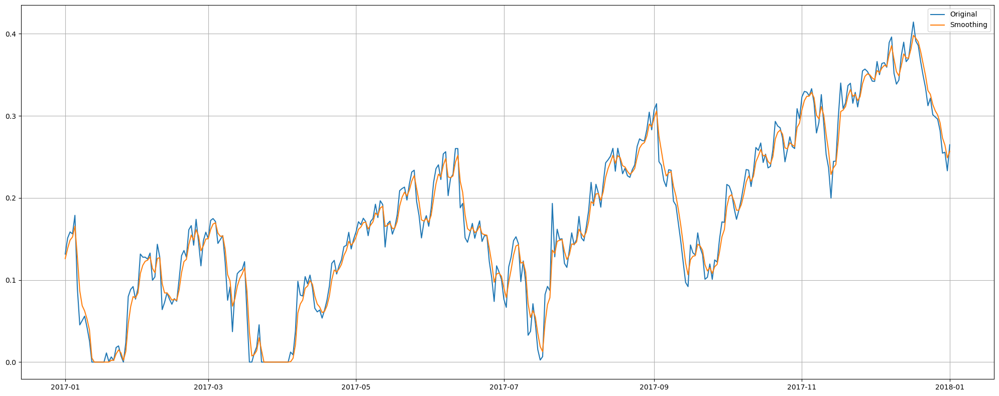

In [164]:
fig = plt.figure(figsize=(20,8))
layout = (1,1)
trend_ax = plt.subplot2grid(layout, (0,0))
df_signal_check = df_signal_check.reset_index()
date_cond = (df_signal_check['date'] >= pd.Timestamp('2017-01-01').date()) & (df_signal_check['date'] <= pd.Timestamp('2018-01-01').date())
x = df_signal_check[date_cond]['date']#.index.values.tolist()
_ = trend_ax.plot(x, df_signal_check[date_cond]['orig_signal'], label='Original')
_ = trend_ax.plot(x, df_signal_check[date_cond]['orig_signal_w_smoothing'], label='Smoothing')

_ = trend_ax.legend()
_ = trend_ax.grid()
plt.tight_layout()

<Axes: xlabel='date'>

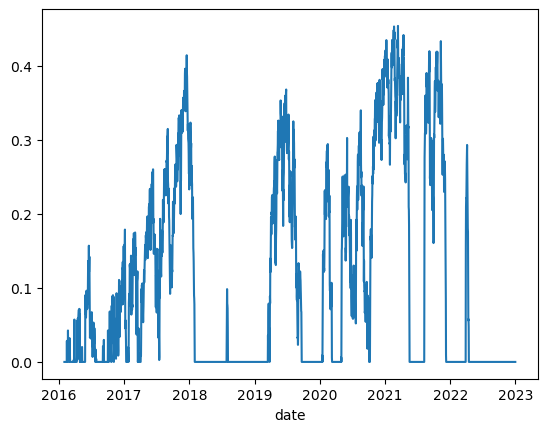

In [381]:
df_final_orig['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

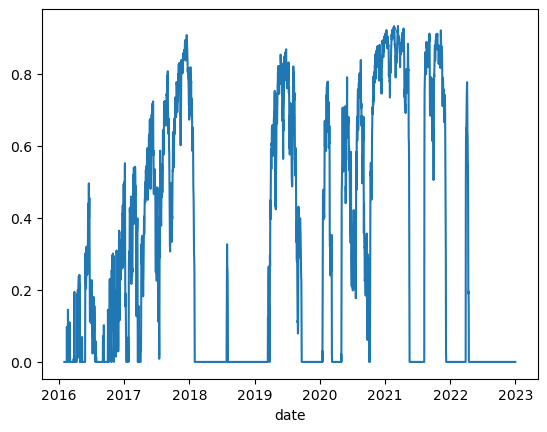

In [395]:
df_final_after_stretching_act['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

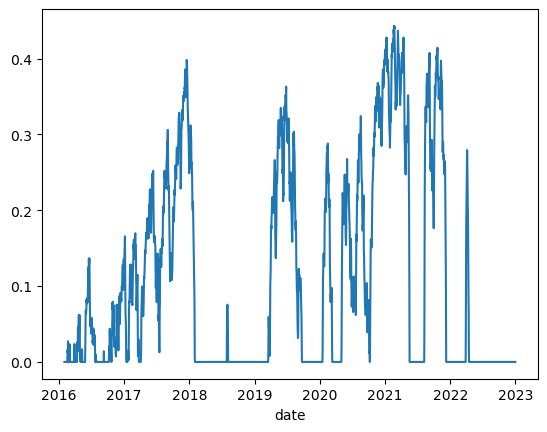

In [409]:
df_final_with_smoothing_no_stretching_act['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

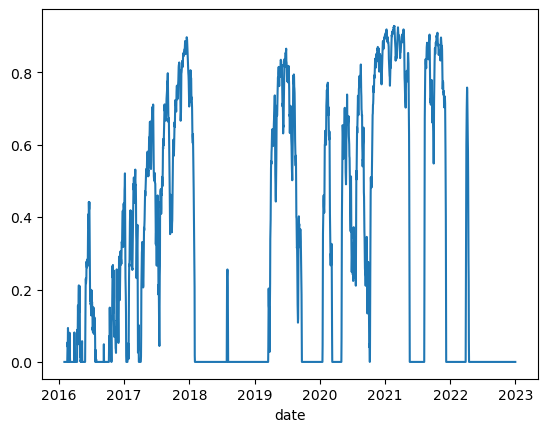

In [554]:
df_final_with_smoothing_and_stretching_act['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

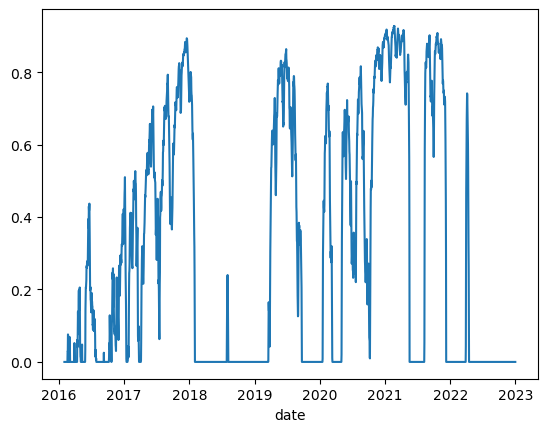

In [437]:
df_final_with_smoothing_4_and_stretching_act['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

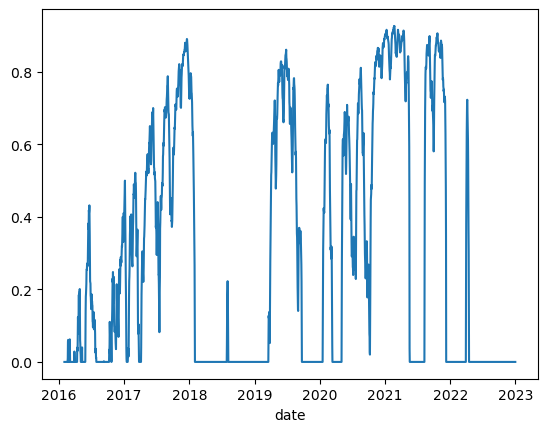

In [451]:
df_final_with_smoothing_5_and_stretching_act['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

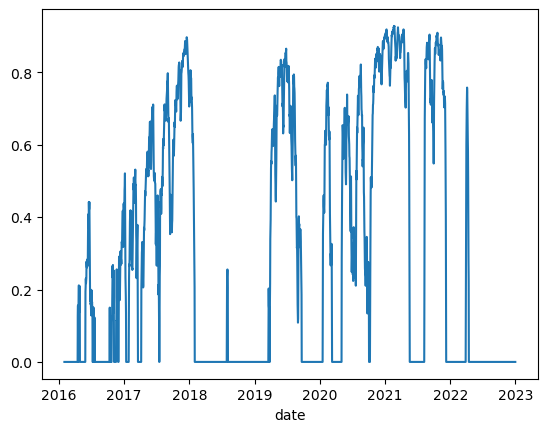

In [468]:
df_final_with_smoothing_and_stretching_and_dead_zone['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

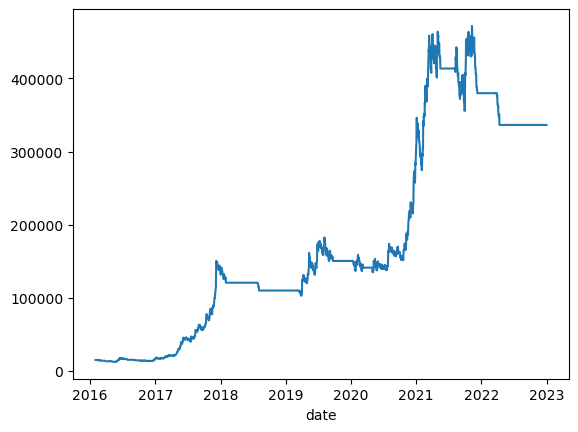

In [382]:
df_final_orig['total_portfolio_value'].plot()

<Axes: xlabel='date'>

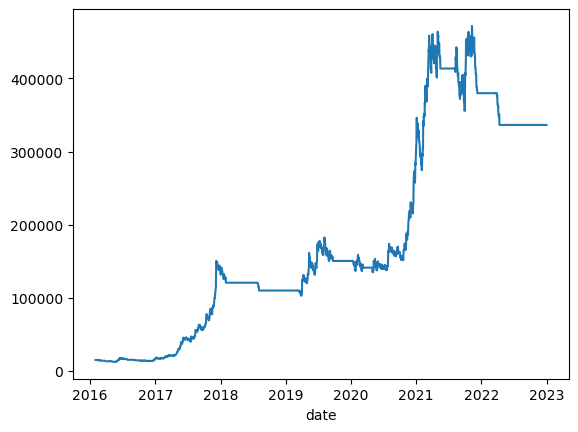

In [396]:
df_final_after_stretching_act['total_portfolio_value'].plot()

<Axes: xlabel='date'>

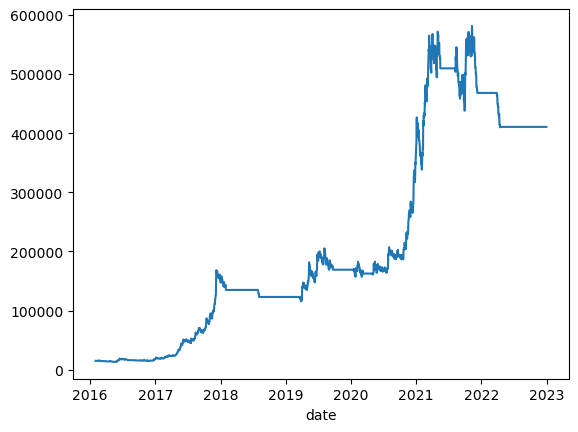

In [410]:
df_final_with_smoothing_no_stretching_act['total_portfolio_value'].plot()

<Axes: xlabel='date'>

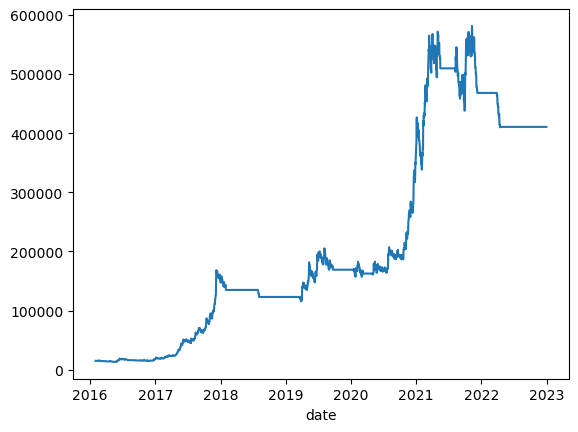

In [424]:
df_final_with_smoothing_and_stretching_act['total_portfolio_value'].plot()

<Axes: xlabel='date'>

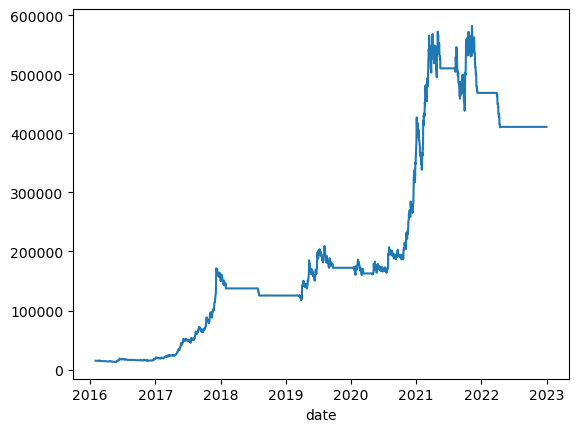

In [438]:
df_final_with_smoothing_4_and_stretching_act['total_portfolio_value'].plot()

<Axes: xlabel='date'>

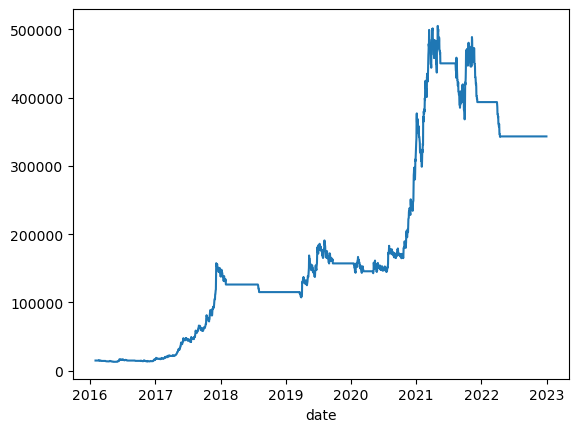

In [452]:
df_final_with_smoothing_5_and_stretching_act['total_portfolio_value'].plot()

<Axes: xlabel='date'>

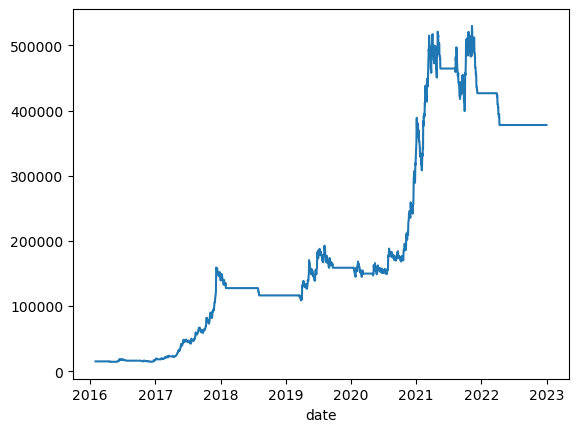

In [470]:
df_final_with_smoothing_and_stretching_and_dead_zone['total_portfolio_value'].plot()

<Axes: xlabel='date'>

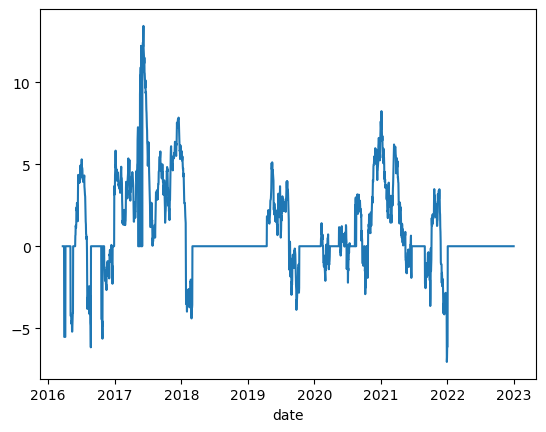

In [383]:
df_final_orig['portfolio_rolling_sharpe_50'].plot()

<Axes: xlabel='date'>

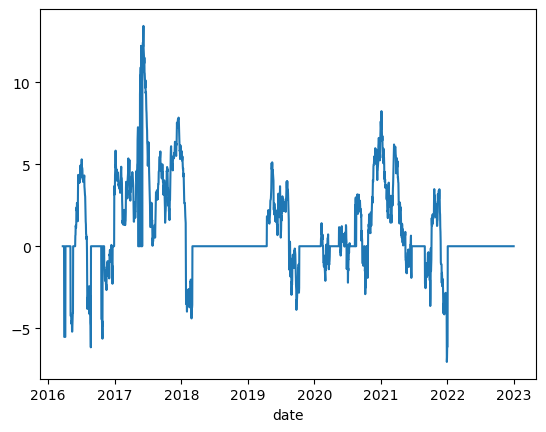

In [397]:
df_final_after_stretching_act['portfolio_rolling_sharpe_50'].plot()

<Axes: xlabel='date'>

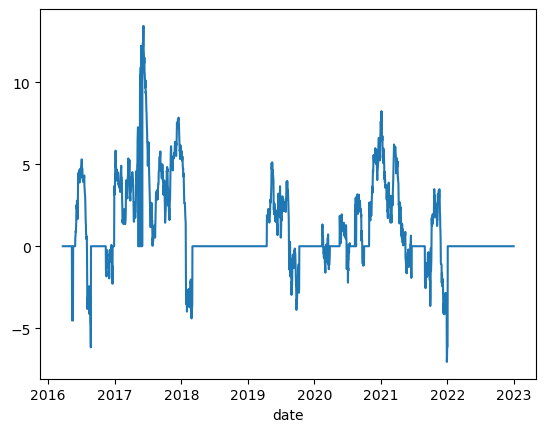

In [411]:
df_final_with_smoothing_no_stretching_act['portfolio_rolling_sharpe_50'].plot()

<Axes: xlabel='date'>

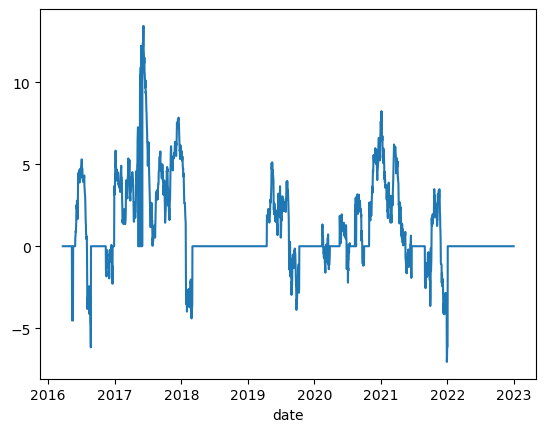

In [425]:
df_final_with_smoothing_and_stretching_act['portfolio_rolling_sharpe_50'].plot()

<Axes: xlabel='date'>

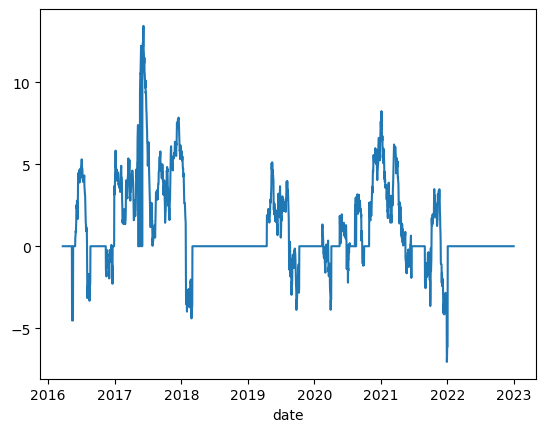

In [439]:
df_final_with_smoothing_4_and_stretching_act['portfolio_rolling_sharpe_50'].plot()

<Axes: xlabel='date'>

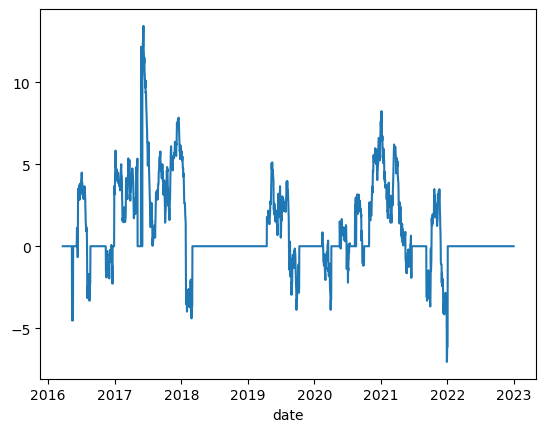

In [453]:
df_final_with_smoothing_5_and_stretching_act['portfolio_rolling_sharpe_50'].plot()

<Axes: xlabel='date'>

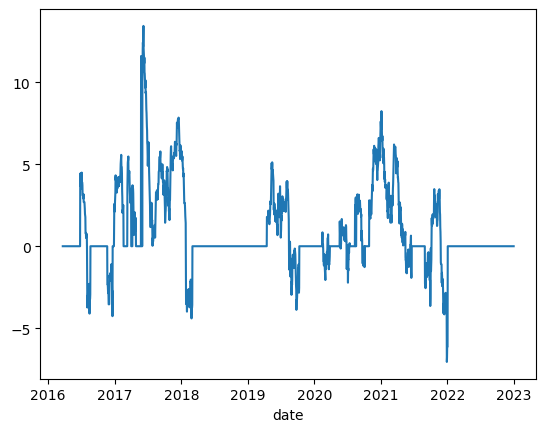

In [472]:
df_final_with_smoothing_and_stretching_and_dead_zone['portfolio_rolling_sharpe_50'].plot()

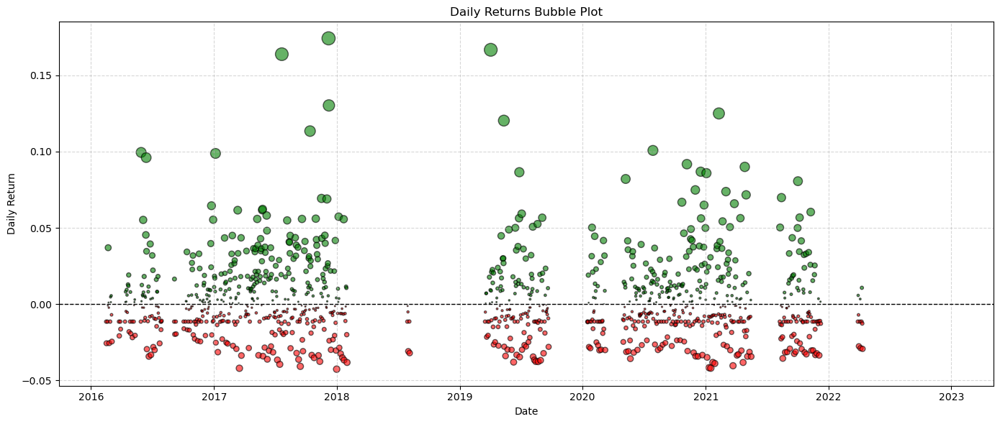

In [388]:
plot_daily_returns_bubble(df_final_orig, return_col='portfolio_daily_pct_returns')

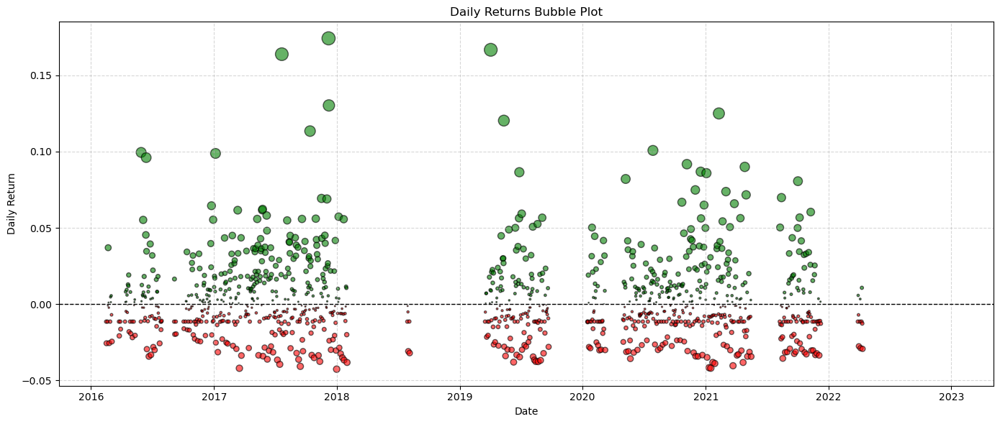

In [398]:
plot_daily_returns_bubble(df_final_after_stretching_act, return_col='portfolio_daily_pct_returns')

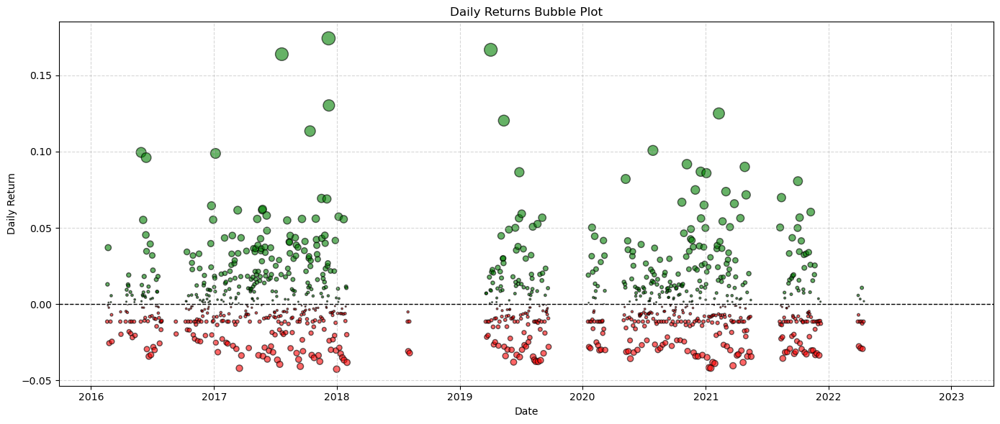

In [412]:
plot_daily_returns_bubble(df_final_with_smoothing_no_stretching_act, return_col='portfolio_daily_pct_returns')

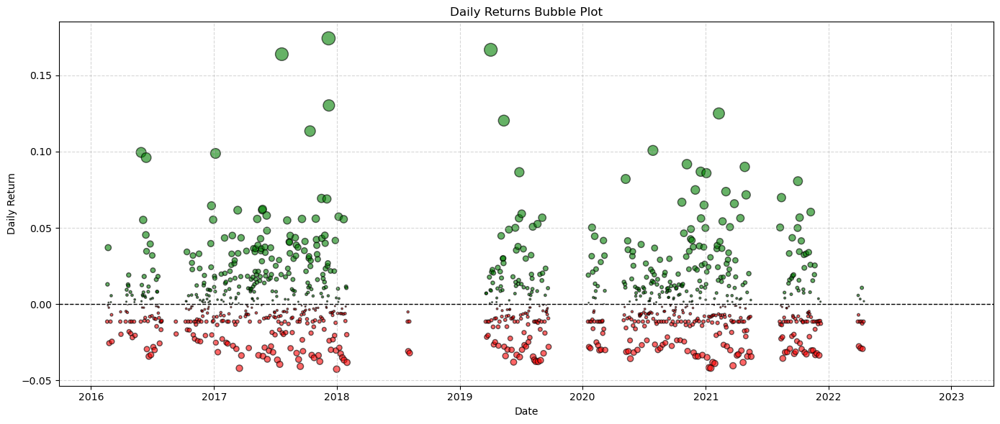

In [430]:
plot_daily_returns_bubble(df_final_with_smoothing_and_stretching_act, return_col='portfolio_daily_pct_returns')

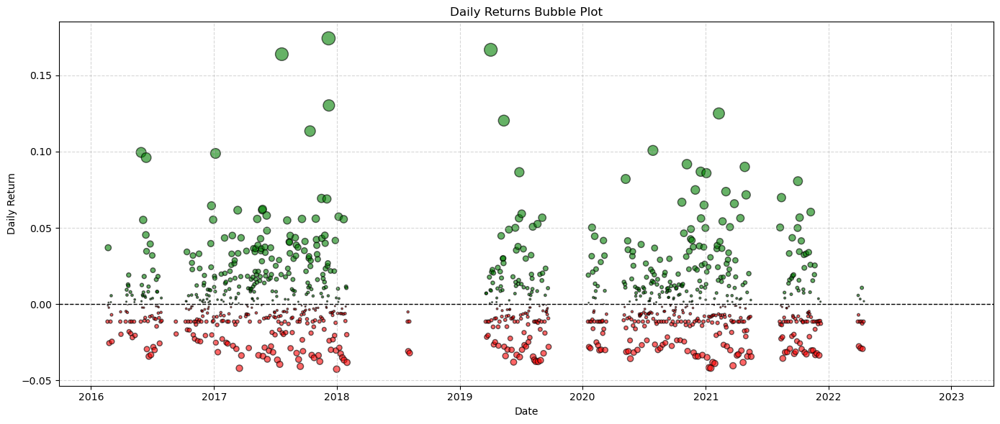

In [444]:
plot_daily_returns_bubble(df_final_with_smoothing_4_and_stretching_act, return_col='portfolio_daily_pct_returns')

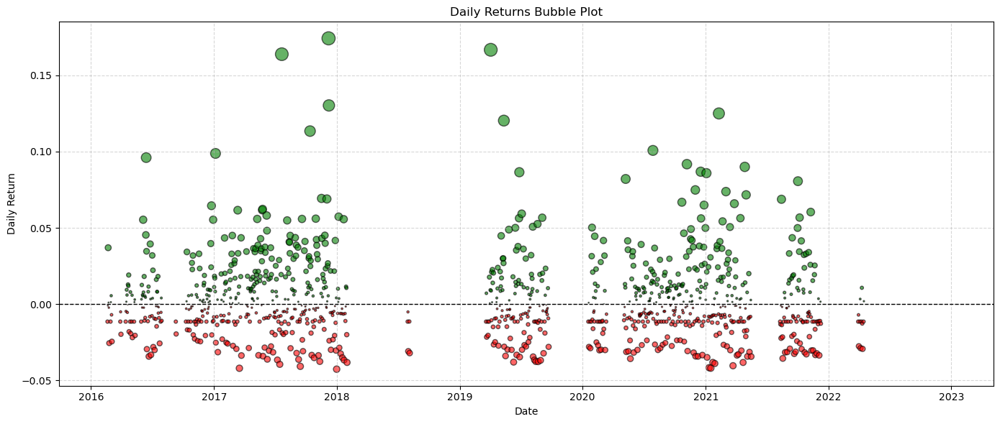

In [454]:
plot_daily_returns_bubble(df_final_with_smoothing_5_and_stretching_act, return_col='portfolio_daily_pct_returns')

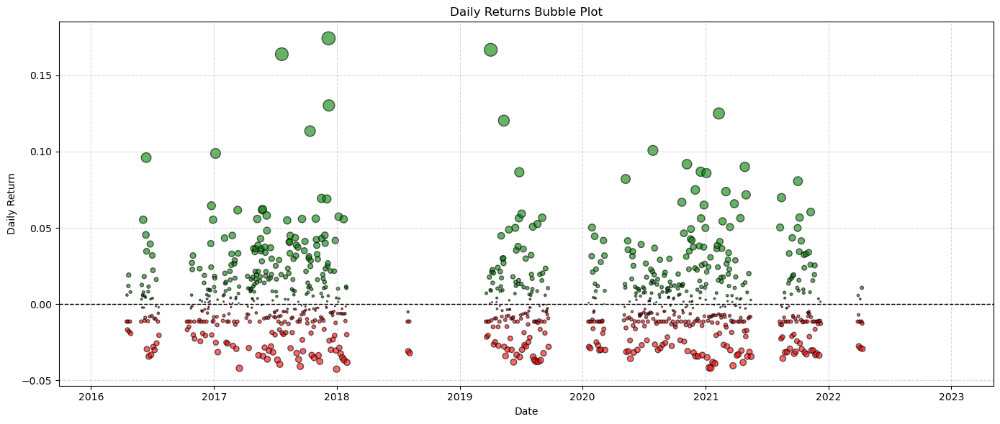

In [474]:
plot_daily_returns_bubble(df_final_with_smoothing_and_stretching_and_dead_zone, return_col='portfolio_daily_pct_returns')

In [390]:
## This contains only a percentile rank, weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_orig, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.5674310944650756,
 'annualized_sharpe_ratio': 1.3805261326158609,
 'calmar_ratio': 1.7890538774491442,
 'annualized_std_dev': 0.661433328662589,
 'max_drawdown': -0.3171682539120208,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.20308788598574823,
 't_statistic': 4.022841356127564,
 'p_value': 5.9189135414415424e-05,
 'trade_count': 477.0}

In [404]:
## This contains a percentile rank stretching the activation signal to 0.9 for 95th percentile, weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_after_stretching_act, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.5674310944650751,
 'annualized_sharpe_ratio': 1.3805261326158613,
 'calmar_ratio': 1.7890538774491411,
 'annualized_std_dev': 0.661433328662589,
 'max_drawdown': -0.31716825391202114,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.20308788598574823,
 't_statistic': 4.0228413561275636,
 'p_value': 5.9189135414415634e-05,
 'trade_count': 477.0}

In [418]:
## This contains a percentile rank with no stretching of the activation signal but with exponential smoothing, weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_with_smoothing_no_stretching_act, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.6132442325590381,
 'annualized_sharpe_ratio': 1.4715965514521887,
 'calmar_ratio': 1.9579628921180157,
 'annualized_std_dev': 0.6684669647922363,
 'max_drawdown': -0.3132052374576234,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.20229612034837688,
 't_statistic': 4.263509287626182,
 'p_value': 2.086339284346662e-05,
 'trade_count': 465.0}

In [566]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 3), weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_with_smoothing_and_stretching_act, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.6132442325590381,
 'annualized_sharpe_ratio': 1.471596551452189,
 'calmar_ratio': 1.9579628921180163,
 'annualized_std_dev': 0.6684669647922363,
 'max_drawdown': -0.3132052374576233,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.20229612034837688,
 't_statistic': 4.263509287626183,
 'p_value': 2.0863392843466507e-05,
 'trade_count': 465.0}

In [446]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 4), weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_with_smoothing_4_and_stretching_act, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.6133488649434835,
 'annualized_sharpe_ratio': 1.4720928665867383,
 'calmar_ratio': 1.958296961833114,
 'annualized_std_dev': 0.6683504127090496,
 'max_drawdown': -0.3132052374576237,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.20229612034837688,
 't_statistic': 4.264917146442228,
 'p_value': 2.0733211694551404e-05,
 'trade_count': 465.0}

In [460]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 5), weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_with_smoothing_5_and_stretching_act, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.5719708671349955,
 'annualized_sharpe_ratio': 1.40205922229199,
 'calmar_ratio': 1.7778730671113023,
 'annualized_std_dev': 0.6640292085655071,
 'max_drawdown': -0.3217163686856097,
 'max_drawdown_duration': Timedelta('608 days 00:00:00'),
 'hit_rate': 0.1995249406175772,
 't_statistic': 4.084110714271631,
 'p_value': 4.562315048734632e-05,
 'trade_count': 460.0}

In [476]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 3) with a dead zone under 0.03, weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_with_smoothing_and_stretching_and_dead_zone, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.5939009966325379,
 'annualized_sharpe_ratio': 1.4549311091510564,
 'calmar_ratio': 1.8675512443207734,
 'annualized_std_dev': 0.6744104498547698,
 'max_drawdown': -0.3180105490752085,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.1880443388756928,
 't_statistic': 4.226764765944024,
 'p_value': 2.4549797166487628e-05,
 'trade_count': 443.0}

In [151]:
## Simple Moving Average with Z-Scores, Mavg Weight = 1.0, Donchian Weight = 0.0
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.49314378767040035,
 'annualized_sharpe_ratio': 1.2274309867328286,
 'calmar_ratio': 0.9240316044228083,
 'annualized_std_dev': 0.6425011085998292,
 'max_drawdown': -0.5336871437188992,
 'max_drawdown_duration': Timedelta('1082 days 00:00:00'),
 'hit_rate': 0.21892319873317498,
 't_statistic': 3.6176664318397282,
 'p_value': 0.0003031020909855101,
 'trade_count': 494.0}

In [234]:
## Exponential Moving Average using Z-Scores, Mavg Weight = 1.0, Donchian Weight = 0.0
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.50675236509181,
 'annualized_sharpe_ratio': 1.259450502418439,
 'calmar_ratio': 1.0557532073889346,
 'annualized_std_dev': 0.6327734188447074,
 'max_drawdown': -0.4799913100383551,
 'max_drawdown_duration': Timedelta('875 days 00:00:00'),
 'hit_rate': 0.2288202692003167,
 't_statistic': 3.703837944965046,
 'p_value': 0.00021691503711493692,
 'trade_count': 499.0}

In [301]:
## Exponential Moving Average using Ranks instead of Z-Scores, Mavg Weight = 1.0, Donchian Weight = 0.0
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.45819000120553266,
 'annualized_sharpe_ratio': 1.0013229925955929,
 'calmar_ratio': 0.6970184341861668,
 'annualized_std_dev': 0.6104639724096105,
 'max_drawdown': -0.6573570779953785,
 'max_drawdown_duration': Timedelta('914 days 00:00:00'),
 'hit_rate': 0.35352335708630245,
 't_statistic': 2.947228820609607,
 'p_value': 0.0032357374375734382,
 'trade_count': 833.0}

In [312]:
## Re-centered Ranks instead of Z-Scores, Mavg Weight = 1.0, Donchian Weight = 0.0
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.6333863460452231,
 'annualized_sharpe_ratio': 1.5277224989479614,
 'calmar_ratio': 2.0959621545897975,
 'annualized_std_dev': 0.6771096106701612,
 'max_drawdown': -0.30219359860969613,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.19398258115597783,
 't_statistic': 4.417127065226718,
 'p_value': 1.042364153289148e-05,
 'trade_count': 442.0}

In [338]:
## Re-centered Ranks and Exponentially Weighted instead of Z-Scores, Mavg Weight = 1.0, Donchian Weight = 0.0
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.6202402026754339,
 'annualized_sharpe_ratio': 1.5037960473662397,
 'calmar_ratio': 1.9207181403716558,
 'annualized_std_dev': 0.6764614812462245,
 'max_drawdown': -0.32292098962288057,
 'max_drawdown_duration': Timedelta('608 days 00:00:00'),
 'hit_rate': 0.19239904988123516,
 't_statistic': 4.354579799720958,
 'p_value': 1.3863796903249916e-05,
 'trade_count': 441.0}

In [159]:
## Simple Moving Average using Z-Scores, Mavg Weight = 0.8, Donchian Weight = 0.2
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                            annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.4537872061738262,
 'annualized_sharpe_ratio': 1.108329754133296,
 'calmar_ratio': 0.7109085309077903,
 'annualized_std_dev': 0.6619586014722887,
 'max_drawdown': -0.638320102298344,
 'max_drawdown_duration': Timedelta('1088 days 00:00:00'),
 'hit_rate': 0.22604908946951702,
 't_statistic': 3.2860090196290117,
 'p_value': 0.0010300811594215877,
 'trade_count': 515.0}

In [241]:
## Exponential Moving Average using Z-Scores, Mavg Weight = 0.8, Donchian Weight = 0.2
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.40498557865518703,
 'annualized_sharpe_ratio': 1.0121012556511484,
 'calmar_ratio': 0.6482429212309161,
 'annualized_std_dev': 0.6504522738273822,
 'max_drawdown': -0.6247435419521129,
 'max_drawdown_duration': Timedelta('962 days 00:00:00'),
 'hit_rate': 0.2379255740300871,
 't_statistic': 3.0340440917085907,
 'p_value': 0.0024375799901121663,
 'trade_count': 519.0}

In [293]:
## Exponential Moving Average using Ranks instead of Z-Scores, Mavg Weight = 0.8, Donchian Weight = 0.2
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.4581900012055329,
 'annualized_sharpe_ratio': 1.0013229925955935,
 'calmar_ratio': 0.697018434186167,
 'annualized_std_dev': 0.6104639724096104,
 'max_drawdown': -0.6573570779953786,
 'max_drawdown_duration': Timedelta('914 days 00:00:00'),
 'hit_rate': 0.35352335708630245,
 't_statistic': 2.9472288206096082,
 'p_value': 0.003235737437573426,
 'trade_count': 833.0}

In [319]:
## Re-centered Ranks instead of Z-Scores, Mavg Weight = 0.8, Donchian Weight = 0.2
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.5246162335385198,
 'annualized_sharpe_ratio': 1.2782557776942949,
 'calmar_ratio': 1.471870871191269,
 'annualized_std_dev': 0.6733665740460943,
 'max_drawdown': -0.35642816486606466,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.20783847980997625,
 't_statistic': 3.746479235186305,
 'p_value': 0.00018334927556638893,
 'trade_count': 480.0}

In [369]:
## Re-centered Ranks and Exponentially Weighted instead of Z-Scores, Mavg Weight = 0.8, Donchian Weight = 0.2
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.6076662304491507,
 'annualized_sharpe_ratio': 1.4580039284294908,
 'calmar_ratio': 1.9401534769397573,
 'annualized_std_dev': 0.6702536480163245,
 'max_drawdown': -0.3132052374576236,
 'max_drawdown_duration': Timedelta('519 days 00:00:00'),
 'hit_rate': 0.2034837688044339,
 't_statistic': 4.22670716126072,
 'p_value': 2.4556035716053938e-05,
 'trade_count': 465.0}

In [167]:
## Simple Moving Average using Z-Scores, Mavg Weight = 0.6, Donchian Weight = 0.4
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                            annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.35880746887670334,
 'annualized_sharpe_ratio': 0.9115978842756113,
 'calmar_ratio': 0.6146678089248652,
 'annualized_std_dev': 0.6492021816486027,
 'max_drawdown': -0.5837420858338178,
 'max_drawdown_duration': Timedelta('1104 days 00:00:00'),
 'hit_rate': 0.2276326207442597,
 't_statistic': 2.7671606778253124,
 'p_value': 0.005695900748210239,
 'trade_count': 522.0}

In [249]:
## Exponential Moving Average using Z-Scores, Mavg Weight = 0.6, Donchian Weight = 0.4
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.292006790687924,
 'annualized_sharpe_ratio': 0.7624044869083965,
 'calmar_ratio': 0.4005733245857944,
 'annualized_std_dev': 0.643607170991014,
 'max_drawdown': -0.7289721326048566,
 'max_drawdown_duration': Timedelta('834 days 00:00:00'),
 'hit_rate': 0.23040380047505937,
 't_statistic': 2.3710503014670317,
 'p_value': 0.017812273548500877,
 'trade_count': 548.0}

In [286]:
## Exponential Moving Average using Ranks instead of Z-Scores, Mavg Weight = 0.6, Donchian Weight = 0.4
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.45819000120553355,
 'annualized_sharpe_ratio': 1.0013229925955944,
 'calmar_ratio': 0.6970184341861683,
 'annualized_std_dev': 0.6104639724096103,
 'max_drawdown': -0.6573570779953785,
 'max_drawdown_duration': Timedelta('914 days 00:00:00'),
 'hit_rate': 0.35352335708630245,
 't_statistic': 2.9472288206096104,
 'p_value': 0.003235737437573406,
 'trade_count': 833.0}

In [327]:
## Re-centered Ranks instead of Z-Scores, Mavg Weight = 0.6, Donchian Weight = 0.4
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.341933248417454,
 'annualized_sharpe_ratio': 0.8791114781565519,
 'calmar_ratio': 0.6952342231148134,
 'annualized_std_dev': 0.6685512275374396,
 'max_drawdown': -0.4918245348819457,
 'max_drawdown_duration': Timedelta('1118 days 00:00:00'),
 'hit_rate': 0.2042755344418052,
 't_statistic': 2.684614905006293,
 'p_value': 0.007308799606409823,
 'trade_count': 526.0}

In [351]:
## Re-centered Ranks and Exponentially Weighted instead of Z-Scores, Mavg Weight = 0.6, Donchian Weight = 0.4
perf.calculate_risk_and_performance_metrics(df_final, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.47899392395941076,
 'annualized_sharpe_ratio': 1.176908441257063,
 'calmar_ratio': 1.0144943038078895,
 'annualized_std_dev': 0.6847071525083708,
 'max_drawdown': -0.4721504321527623,
 'max_drawdown_duration': Timedelta('1078 days 00:00:00'),
 'hit_rate': 0.19873317498020585,
 't_statistic': 3.4752275475897405,
 'p_value': 0.00051902781020736,
 'trade_count': 486.0}

In [483]:
ticker = ticker_list[0]
final_signal_col = f'{ticker}_35_6_60_mavg_crossover_20_donchian_signal'
target_notional_col = f'{ticker}_target_notional'
target_size_col = f'{ticker}_target_size'
cash_shrink_factor_col = f'{ticker}_cash_shrink_factor'
new_position_notional_col = f'{ticker}_new_position_notional'
new_position_size_col = f'{ticker}_new_position_size'
open_position_notional_col = f'{ticker}_open_position_notional'
open_position_size_col = f'{ticker}_open_position_size'
actual_position_notional_col = f'{ticker}_actual_position_notional'
actual_position_size_col = f'{ticker}_actual_position_size'
new_position_entry_exit_price_col = f'{ticker}_new_position_entry_exit_price'
stop_loss_col = f'{ticker}_stop_loss'
available_cash_col = 'available_cash'
short_sale_proceeds_col = f'{ticker}_short_sale_proceeds'
open_price_col = f'{ticker}_open'
t_1_close_price_col = f'{ticker}_t_1_close'
event_col = f'{ticker}_event'
upper_donchian_channel = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price_t_2'
lower_donchian_channel = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price_t_2'
stopout_flag_col = f'{ticker}_stopout_flag'
cooldown_counter_col = f'{ticker}_cooldown_counter'
daily_pct_returns_col = f'portfolio_daily_pct_returns'

cols = [final_signal_col, target_notional_col, target_size_col, cash_shrink_factor_col, event_col, open_position_size_col, open_position_notional_col, new_position_size_col, new_position_notional_col,
        actual_position_size_col, actual_position_notional_col, new_position_entry_exit_price_col,
        t_1_close_price_col, open_price_col, stop_loss_col, available_cash_col, short_sale_proceeds_col, stopout_flag_col, cooldown_counter_col, daily_pct_returns_col, 'total_portfolio_value', 'count_of_positions']
# df_final[df_final[final_signal_col].notnull()][cols].head(200)#[df_size.index >= pd.Timestamp('2017-09-15').date()][cols].head(200)

In [285]:
df_size.head(200)

,BTC-USD_20_avg_true_range_price,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,equity_curve,equity_curve_cum_max,drawdown,drawdown_pct,End,Start,equity_curve_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,18.219570,357.53,449.19,0.000000,0.000000,0.000000,1.076237,371.33,0,0.000000,0.000000,0.000000,367.89,0.000000,0.000000,0.0,0.000000,367.95,-0.027770,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,0.000000,1.000000,1.000000e+00,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2016-02-01,1,104 days,False
2016-02-02,17.697706,357.53,434.01,0.000000,0.000000,0.000000,1.072386,372.93,No Position,371.330000,0.000000,0.000000,371.33,0.000000,0.000000,0.0,0.000000,371.33,0.009186,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,13500.000000,0.000000,1.000000e+12,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2016-02-02,1,104 days,False
2016-02-03,16.320782,357.53,432.77,0.000000,0.000000,0.000000,1.073254,368.87,No Position,372.930000,0.000000,0.000000,372.93,0.000000,0.000000,0.0,0.000000,372.93,0.004309,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,13500.000000,0.000000,1.000000e+12,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2016-02-03,1,104 days,False
2016-02-04,15.469279,357.53,430.03,0.000000,0.000000,0.000000,1.073469,387.99,No Position,368.870000,0.000000,0.000000,368.87,0.000000,0.000000,0.0,0.000000,368.87,-0.010887,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,13500.000000,0.000000,1.000000e+12,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2016-02-04,1,104 days,False
2016-02-05,16.080776,357.53,418.54,0.000000,0.000000,0.000000,0.814133,384.50,No Position,387.990000,0.000000,0.000000,387.99,0.000000,0.000000,0.0,0.000000,387.99,0.051834,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,13500.000000,0.000000,1.000000e+12,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2016-02-05,1,104 days,False
2016-02-06,15.155940,367.95,418.54,0.000000,0.000000,0.000000,0.726428,375.44,No Position,384.440000,0.000000,0.000000,384.44,0.000000,0.000000,0.0,0.000000,384.50,-0.008995,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,13500.000000,0.000000,1.000000e+12,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,2016-02-06,1,104 days,False
2016-02-07,15.092517,367.95,418.54,0.000000,0.000000,0.000000,0.724576,377.49,No Position,375.440000,0.000000,0.000000,375.44,0.000000,0.000000,0.0,0.000000,375.44,-0.023563,0.000000,0.000000,0.000000,0.000000,0.000000,15000.000000,0.0,0.000000,0.000000,15000.000000,13500.000000,0.000000,1.000000e+12,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.0

## Testing Different ATR Multipliers for Stop Loss

In [585]:
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2022-12-31').date()
ticker_list = ['BTC-USD']#,'ETH-USD','SOL-USD']#,'DOGE-USD','LTC-USD','CRO-USD','ADA-USD','AVAX-USD','XRP-USD','AAVE-USD']
fast_mavg = 35
slow_mavg = 60
mavg_stepsize = 6
rolling_donchian_window = 20
long_only = True
use_coinbase_data = True
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 0.5
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

final_weighted_additive_signal_threshold = 0.1
final_weighted_multiplicative_signal_threshold = 0.0
mavg_z_score_threshold = 0.0
donchian_threshold = 0.5
ma_crossover_signal_weight = 0.8
donchian_signal_weight = 0.2
ribbon_width_signal_weight = 0.0

In [498]:
perf_cols = ['atr_multiplier', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
                'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_atr_performance = pd.DataFrame(columns=perf_cols)

for i in np.arange(0.5, 3.1, 0.5):
    print(i)
    atr_multiplier = i
    
    ## This contains only a percentile rank, weights of 0.8 mavg and 0.2 donchian
    df = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                     mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, long_only=long_only,
                                                                     initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                     rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                     transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                     rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                     annualized_target_volatility=annualized_target_volatility,
                                                                     annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                 strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                 passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    row = {
        # 'ticker': ticker,
        'atr_multiplier': atr_multiplier,
        'annualized_return': performance_metrics['annualized_return'],
        'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
        'calmar_ratio': performance_metrics['calmar_ratio'],
        'annualized_std_dev': performance_metrics['annualized_std_dev'],
        'max_drawdown': performance_metrics['max_drawdown'],
        'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
        'hit_rate': performance_metrics['hit_rate'],
        't_statistic': performance_metrics['t_statistic'],
        'p_value': performance_metrics['p_value'],
        'trade_count': performance_metrics['trade_count']
    }
    df_atr_performance = pd.concat([df_atr_performance, pd.DataFrame([row])], ignore_index=True)

df_atr_performance

0.5
1.0
1.5
2.0
2.5
3.0


,atr_multiplier,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count
0,0.5,0.613244,1.471597,1.957963,0.668467,-0.313205,519 days,0.202296,4.263509,0.000021,465.0
1,1.0,0.700880,1.452709,1.923463,0.790814,-0.364384,510 days,0.254949,4.158209,0.000033,436.0
2,1.5,0.662749,1.325258,1.596620,0.831968,-0.415095,510 days,0.278306,3.799701,0.000148,422.0
3,2.0,0.723014,1.380668,1.830991,0.842248,-0.394876,510 days,0.287807,3.935412,0.000085,423.0
4,2.5,0.721254,1.364005,1.826533,0.849202,-0.394876,510 days,0.289390,3.887066,0.000104,427.0
5,3.0,0.724623,1.365768,1.835067,0.852319,-0.394876,510 days,0.291766,3.890790,0.000103,429.0


In [505]:
## This contains only a percentile rank, weights of 0.8 mavg and 0.2 donchian
atr_multiplier = 2
df_final_atr_2 = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                            mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, long_only=long_only,
                                                                            initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                            rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                            transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                            rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                            annualized_target_volatility=annualized_target_volatility,
                                                                            annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

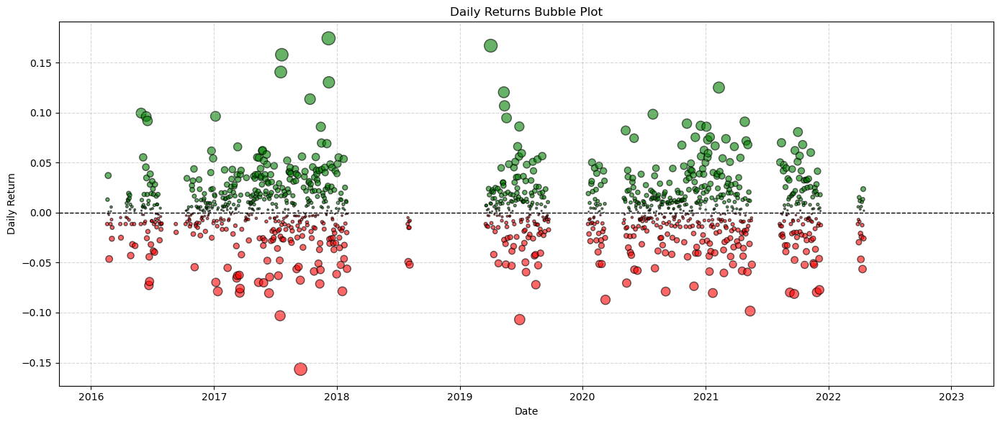

In [509]:
plot_daily_returns_bubble(df_final_atr_2, return_col='portfolio_daily_pct_returns')

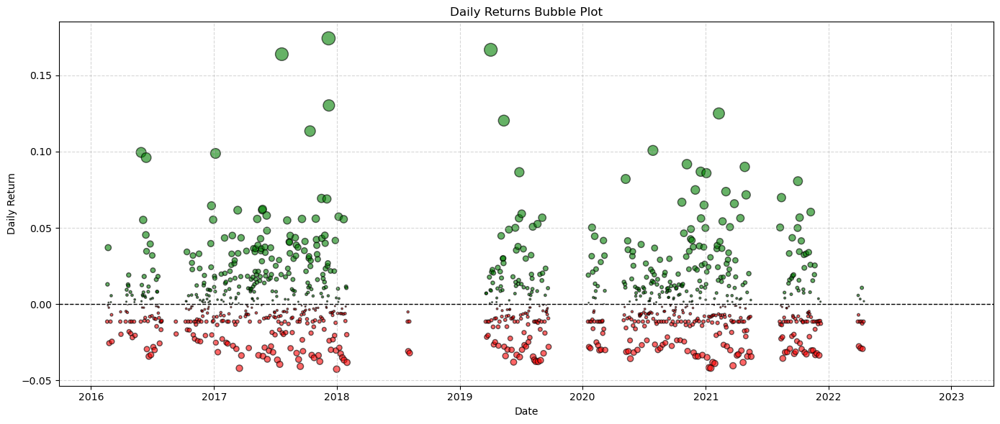

In [511]:
plot_daily_returns_bubble(df_final_with_smoothing_and_stretching_act, return_col='portfolio_daily_pct_returns')

In [521]:
## Simple Moving Average using Z-Scores, Mavg Weight = 0.6, Donchian Weight = 0.4
perf.calculate_risk_and_performance_metrics(df_final_atr_2, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                            annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.7230140311091127,
 'annualized_sharpe_ratio': 1.3806675417487349,
 'calmar_ratio': 1.830991289035035,
 'annualized_std_dev': 0.8422482168650917,
 'max_drawdown': -0.39487573503976303,
 'max_drawdown_duration': Timedelta('510 days 00:00:00'),
 'hit_rate': 0.28780680918448137,
 't_statistic': 3.935411578481463,
 'p_value': 8.529696488330034e-05,
 'trade_count': 423.0}

## Plotting Portfolio Volatility and Signal Strength

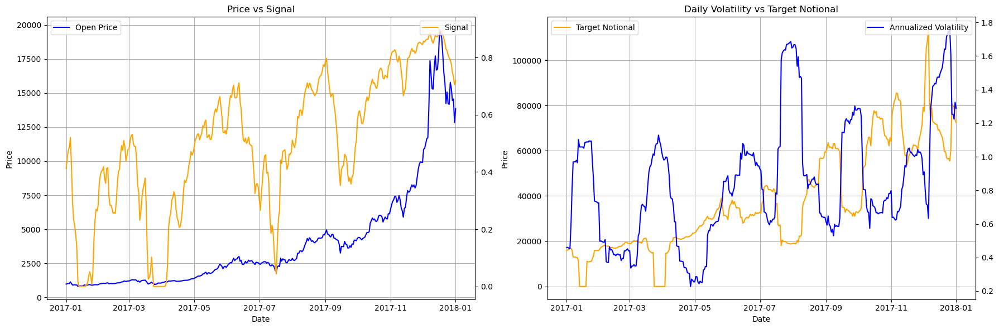

In [60]:
ticker = ticker_list[0]
fig = plt.figure(figsize=(18,6))
layout = (1,2)
final_signal_col = f'{ticker}_35_6_60_mavg_crossover_20_donchian_signal'
target_notional_col = f'{ticker}_target_notional'
actual_position_notional_col = f'{ticker}_actual_position_notional'

trend_ax = plt.subplot2grid(layout, (0,0), colspan=1)
target_notional_ax = plt.subplot2grid(layout, (0,1), colspan=1)
trend_ax2 = trend_ax.twinx()
date_cond = (df_final_with_smoothing_and_stretching_act.index >= pd.Timestamp('2017-01-01').date()) & (df_final_with_smoothing_and_stretching_act.index <= pd.Timestamp('2018-01-01').date())
_ = trend_ax.plot(df_final_with_smoothing_and_stretching_act[date_cond].index, df_final_with_smoothing_and_stretching_act[date_cond][f'{ticker}_open'], label='Open Price', color='blue')
_ = trend_ax2.plot(df_final_with_smoothing_and_stretching_act[date_cond].index, df_final_with_smoothing_and_stretching_act[date_cond][final_signal_col], label=f'Signal', color='orange')

target_notional_ax2 = target_notional_ax.twinx()
_ = target_notional_ax.plot(df_final_with_smoothing_and_stretching_act[date_cond].index, df_final_with_smoothing_and_stretching_act[date_cond][target_notional_col], label=f'Target Notional', color='orange')
_ = target_notional_ax2.plot(df_final_with_smoothing_and_stretching_act[date_cond].index, df_final_with_smoothing_and_stretching_act[date_cond][f'{ticker}_annualized_volatility_20'], label='Annualized Volatility', color='blue')

_ = trend_ax.set_title(f'Price vs Signal')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend(loc='upper left')
_ = trend_ax2.legend(loc='upper right')
_ = trend_ax.grid()

_ = target_notional_ax.set_title(f'Daily Volatility vs Target Notional')
_ = target_notional_ax.set_ylabel('Price')
_ = target_notional_ax.set_xlabel('Date')
_ = target_notional_ax.legend(loc='upper left')
_ = target_notional_ax2.legend(loc='upper right')
_ = target_notional_ax.grid()

plt.tight_layout()

In [62]:
df_final_with_smoothing_and_stretching_act[[target_notional_col, f'{ticker}_annualized_volatility_20']].corr()

,BTC-USD_target_notional,BTC-USD_annualized_volatility_20
BTC-USD_target_notional,1.000000,0.001449
BTC-USD_annualized_volatility_20,0.001449,1.000000


## Testing different weights for the Moving Average Ribbons and Donchian Channels

In [542]:
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2022-12-31').date()
ticker_list = ['BTC-USD']#,'ETH-USD','SOL-USD']#,'DOGE-USD','LTC-USD','CRO-USD','ADA-USD','AVAX-USD','XRP-USD','AAVE-USD']
fast_mavg = 35
slow_mavg = 60
mavg_stepsize = 6
rolling_donchian_window = 20
long_only = True
use_coinbase_data = True
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
rolling_atr_window = 20
atr_multiplier = 0.5
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
notional_threshold_pct = 0.05
cooldown_counter_threshold = 3
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

final_weighted_additive_signal_threshold = 0.1
final_weighted_multiplicative_signal_threshold = 0.0
mavg_z_score_threshold = 0.0
donchian_threshold = 0.5
# ma_crossover_signal_weight = 0.8
# donchian_signal_weight = 0.2
ribbon_width_signal_weight = 0.0
macro_signal_200d_weight = 0.0
macro_signal_100d_weight = 0.0

In [568]:
perf_cols = ['ma_crossover_signal_weight', 'donchian_signal_weight','fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio',
             'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_ma_crossover_donchian_channel_weight = pd.DataFrame(columns=perf_cols)

for i in np.arange(0, 1.1, 0.1):
    for j in np.arange(0, 1.1, 0.1):
        if (i+j == 1):
            print(i,j)
            ma_crossover_signal_weight = i
            donchian_signal_weight = j
            ## This contains a percentile rank with stretching the signal and exponential smoothing (span = 3), weights of 0.8 mavg and 0.2 donchian
            df = apply_target_volatility_position_sizing_continuous_strategy(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                             mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                             donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                             initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                             rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                             transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                             rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                             annualized_target_volatility=annualized_target_volatility,
                                                                             annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)
            performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                        strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                        passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
            row = {'ma_crossover_signal_weight': ma_crossover_signal_weight,
                   'donchian_signal_weight': donchian_signal_weight,
                   'ticker': ticker,
                   'fast_mavg': fast_mavg,
                   'slow_mavg': slow_mavg,
                   'stepsize': mavg_stepsize,
                   'annualized_return': performance_metrics['annualized_return'],
                   'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                   'calmar_ratio': performance_metrics['calmar_ratio'],
                   'annualized_std_dev': performance_metrics['annualized_std_dev'],
                   'max_drawdown': performance_metrics['max_drawdown'],
                   'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                   'hit_rate': performance_metrics['hit_rate'],
                   't_statistic': performance_metrics['t_statistic'],
                   'p_value': performance_metrics['p_value'],
                   'trade_count': performance_metrics['trade_count']
                  }
            df_ma_crossover_donchian_channel_weight = pd.concat([df_ma_crossover_donchian_channel_weight, pd.DataFrame([row])], ignore_index=True)

0.0 1.0
0.1 0.9
0.2 0.8
0.30000000000000004 0.7000000000000001
0.4 0.6000000000000001
0.5 0.5
0.6000000000000001 0.4
0.7000000000000001 0.30000000000000004
0.8 0.2
0.9 0.1
1.0 0.0


In [569]:
df_ma_crossover_donchian_channel_weight

,ma_crossover_signal_weight,donchian_signal_weight,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.0,1.0,35,60,6,0.419947,1.104900,0.754516,0.637688,-0.556578,504 days,0.194378,3.310861,0.000943,465.0,BTC-USD
1,0.1,0.9,35,60,6,0.399346,1.056046,0.790439,0.632888,-0.505221,504 days,0.195962,3.180823,0.001486,474.0,BTC-USD
2,0.2,0.8,35,60,6,0.401861,1.058447,0.767793,0.633338,-0.523398,657 days,0.195566,3.185398,0.001463,479.0,BTC-USD
3,0.3,0.7,35,60,6,0.432550,1.116170,0.790789,0.633010,-0.546985,525 days,0.200317,3.332313,0.000874,490.0,BTC-USD
4,0.4,0.6,35,60,6,0.421509,1.093569,0.804772,0.632829,-0.523762,517 days,0.198337,3.273502,0.001077,499.0,BTC-USD
5,0.5,0.5,35,60,6,0.500161,1.239136,1.286003,0.656158,-0.388927,637 days,0.198337,3.647751,0.000270,494.0,BTC-USD
6,0.6,0.4,35,60,6,0.558761,1.353902,1.560670,0.668761,-0.358026,519 days,0.198337,3.949235,0.000081,484.0,BTC-USD
7,0.7,0.3,35,60,6,0.511533,1.271061,1.143353,0.658540,-0.447397,1070 days,0.202692,3.735396,0.000192,478.0,BTC-USD
8,0.8,0.2,35,60,6,0.613244,1.471597,1.957963,0.668467,-0.313205,519 days,0.202296,4.263509,0.000021,465.0,BTC-USD
9,0.9,0.1,35,60,6,0.617727,1.491850,1.942475,0.670555,-0.318011,519 days,0.196754,4.320747,0.000016,454.0,BTC-USD


## Implementing Dynamic Weights for the Moving Average Ribbon and Donchian Channels

In [123]:
## Generate Trend Signal for all tickers
df_trend = get_trend_donchian_signal_for_portfolio_macro(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                         slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, donchian_threshold=donchian_threshold, 
                                                         final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold,
                                                         final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold,
                                                         donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, 
                                                         rolling_donchian_window=rolling_donchian_window, long_only=long_only, use_coinbase_data=use_coinbase_data)

In [124]:
df_trend[f'{ticker}_open_t_1_pct_returns'] = df_trend[f'{ticker}_open'].pct_change()#.shift(1)

In [812]:
lookback_window = 90
rebalance_freq = 7

mavg_rank_col = f'{ticker}_mavg_ribbon_rank'
donchian_rank_col = f'{ticker}_donchian_continuous_signal_rank'
pct_returns_col = f'{ticker}_open_t_1_pct_returns'
mavg_weight_col = f'{ticker}_mavg_ribbon_weight'
donchian_weight_col = f'{ticker}_donchian_weight'
regression_cols = [mavg_rank_col, donchian_rank_col, pct_returns_col]
df_rolling_regression = df_trend[regression_cols].dropna()
df_rolling_regression[mavg_weight_col] = np.nan
df_rolling_regression[donchian_weight_col] = np.nan

In [808]:
df_rolling_regression.tail()

,BTC-USD_mavg_ribbon_rank,BTC-USD_donchian_continuous_signal_rank,BTC-USD_open_t_1_pct_returns,BTC-USD_mavg_ribbon_weight,BTC-USD_donchian_weight
date,,,,,
2022-12-27,-0.299563,-0.174930,-0.000478,-0.143020,0.194898
2022-12-28,-0.297505,-0.224098,0.005198,-0.140063,0.200765
2022-12-29,-0.295494,-0.298957,-0.012907,-0.140063,0.200765
2022-12-30,-0.293114,-0.306813,-0.009501,-0.140063,0.200765
2022-12-31,-0.291531,-0.319613,0.005302,-0.140063,0.200765


In [794]:
df_trend[regression_cols].dropna().tail()

,BTC-USD_mavg_ribbon_rank,BTC-USD_donchian_continuous_signal_rank,BTC-USD_open_t_1_pct_returns
date,,,
2022-12-27,-0.299563,-0.174930,-0.000478
2022-12-28,-0.297505,-0.224098,0.005198
2022-12-29,-0.295494,-0.298957,-0.012907
2022-12-30,-0.293114,-0.306813,-0.009501
2022-12-31,-0.291531,-0.319613,0.005302


In [854]:
def get_rolling_dynamic_weights(df, ticker, lookback_window=90, rebalance_freq=7):
    
    mavg_rank_col = f'{ticker}_mavg_ribbon_rank'
    donchian_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    pct_returns_col = f'{ticker}_open_t_1_pct_returns'
    mavg_weight_col = f'{ticker}_mavg_ribbon_weight'
    donchian_weight_col = f'{ticker}_donchian_weight'
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    regression_cols = [mavg_rank_col, donchian_rank_col, pct_returns_col]
    df_result = df[regression_cols].dropna()
    df_result[mavg_weight_col] = np.nan
    df_result[donchian_weight_col] = np.nan
    date_list = df_result.index.tolist()

    for i in range(lookback_window, len(date_list), rebalance_freq):
        current_date = date_list[i-lookback_window: i]
        return_date = date_list[i-1]
        
        mavg_rank = df_result.loc[current_date][mavg_rank_col]
        donchian_rank = df_result.loc[current_date][donchian_rank_col]
        pct_returns = df_result.loc[current_date, pct_returns_col]
        
        df_result.loc[return_date, mavg_weight_col] = pct_returns.corr(mavg_rank)
        df_result.loc[return_date, donchian_weight_col] = pct_returns.corr(donchian_rank)
        print(i, current_date[0], current_date[-1], return_date)
    
    df_result[[mavg_weight_col, donchian_weight_col]] = (
        df_result[[mavg_weight_col, donchian_weight_col]].ffill())
    df_result[final_weighted_additive_signal_col] = (df_result[mavg_weight_col] * df_result[mavg_rank_col] +
                                                     df_result[donchian_weight_col] * df_result[donchian_rank_col])

    return df_result

In [119]:
def dynamic_ic_weights(df, ticker, fast_mavg, mavg_stepsize, slow_mavg, rolling_donchian_window, lookback_window=90, rebalance_freq=7, min_ic=0.05, long_only=True, smooth_alpha=0.2):
    """
    Rolling IC-based weights with EWMA smoothing and guard-rails.
    """
    open_price_col = f'{ticker}_open'
    mavg_rank_col = f'{ticker}_mavg_ribbon_rank'
    donchian_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    pct_returns_col = f'{ticker}_open_t_1_pct_returns'
    mavg_weight_col = f'{ticker}_mavg_ribbon_weight'
    donchian_weight_col = f'{ticker}_donchian_weight'
    final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
    final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'

    ## Get the percentage returns
    df[pct_returns_col] = df[open_price_col].pct_change()#.shift(1)
    r_fwd = df[pct_returns_col]

    ## Calculate the Rolling Information Coefficients (IC)
    min_periods = lookback_window//2
    ic_ma  = r_fwd.rolling(lookback_window, min_periods=min_periods).corr(df[mavg_rank_col])
    ic_don = r_fwd.rolling(lookback_window, min_periods=min_periods).corr(df[donchian_rank_col])

    ## Floor the ICs to a minimum floor
    ic_ma = ic_ma.where(np.abs(ic_ma) >= min_ic, 0)
    ic_don = ic_ma.where(np.abs(ic_don) >= min_ic, 0)
    # w_ma  = ic_ma.abs().clip(lower=min_ic)
    # w_don = ic_don.abs().clip(lower=min_ic)
    
    ## Unify the signs by picking the sign from the stronger IC
    # signs = np.sign(ic_ma).where(w_ma>=w_don, np.sign(ic_don))

    ## Long Only Check
    if long_only:
        ic_ma = ic_ma.clip(lower=0)
        ic_don = ic_don.clip(lower=0)
        # w_ma  = w_ma.clip(lower=0)
        # w_don = w_don.clip(lower=0)
        # norm  = (w_ma + w_don).replace(0, np.nan)
        # w_ma, w_don = (w_ma/norm).fillna(0), (w_don/norm).fillna(0)
        
    ## L1-normalize so |w_ma|+|w_don|==1
    w_sum = (ic_ma.abs() + ic_don.abs()).replace(0, np.nan)
    w_ma  = (ic_ma / w_sum).fillna(0)
    w_don = (ic_don / w_sum).fillna(0)

    # Exponentially Smooth Weights
    w_ma  = w_ma.ewm(alpha=smooth_alpha).mean()
    w_don = w_don.ewm(alpha=smooth_alpha).mean()

    ## Rebalance Weights at the Rebalance Frequency
    rebalabce_mask = (np.arange(len(df)) % rebalance_freq == 0)
    w_ma  = w_ma .where(rebalabce_mask).ffill()
    w_don = w_don.where(rebalabce_mask).ffill()

    ## Create Final Additive Signal
    df[final_weighted_additive_signal_col] = (w_ma * df[mavg_rank_col] +
                                              w_don * df[donchian_rank_col])

    ## Create Activation Signal
    # k = np.arctanh(0.9) / np.abs(df[final_weighted_additive_signal_col]).rolling(180).quantile(0.95)
    roll_q = df[final_weighted_additive_signal_col].abs().rolling(180).quantile(0.95)
    k = np.arctanh(0.9) / roll_q.shift(5)
    df[final_signal_col] = np.tanh(df[final_weighted_additive_signal_col] * k).clip(lower=0 if long_only else None)

    return df

In [127]:
df_dynamic_ic_weights = dynamic_ic_weights(df_trend, ticker, fast_mavg, mavg_stepsize, slow_mavg, rolling_donchian_window)

KeyError: 'BTC-USD_mavg_ribbon_rank'

In [1002]:
df_dynamic_ic_weights.head()

,BTC-USD_close,BTC-USD_open,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_donchian_continuous_signal,BTC-USD_donchian_continuous_signal_rank,BTC-USD_mavg_ribbon_slope,BTC-USD_mavg_ribbon_rank,BTC-USD_final_weighted_additive_signal,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_open_pct_returns,BTC-USD_open_t_1_pct_returns,BTC-USD_activation
date,,,,,,,,,,,,,
2016-01-11,449.19,449.99,NaN,NaN,NaN,NaN,0.020986,-0.064586,NaN,NaN,NaN,NaN,NaN
2016-01-12,434.01,449.26,NaN,NaN,NaN,NaN,0.014258,-0.064978,NaN,NaN,NaN,NaN,NaN
2016-01-13,432.77,434.01,NaN,NaN,NaN,NaN,0.008104,-0.065371,NaN,NaN,-0.001622,-0.001622,NaN
2016-01-14,430.03,432.70,NaN,NaN,NaN,NaN,0.001598,-0.066353,NaN,NaN,-0.033945,-0.033945,NaN
2016-01-15,357.53,430.04,NaN,NaN,NaN,NaN,-0.041454,-0.070377,NaN,NaN,-0.003018,-0.003018,NaN


<Axes: xlabel='date'>

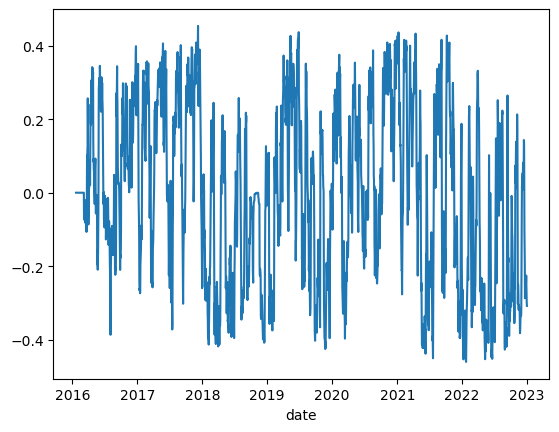

In [1006]:
df_dynamic_ic_weights['BTC-USD_final_weighted_additive_signal'].plot()

<Axes: xlabel='date'>

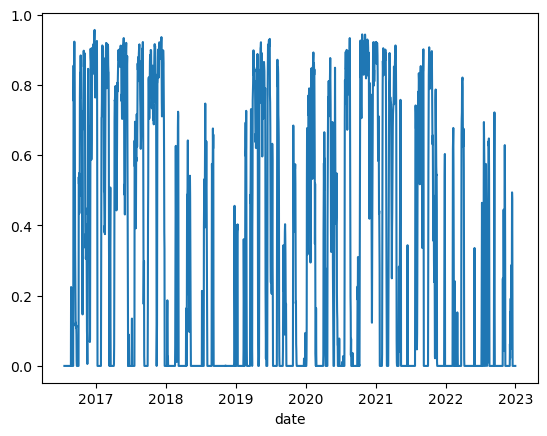

In [1004]:
df_dynamic_ic_weights['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

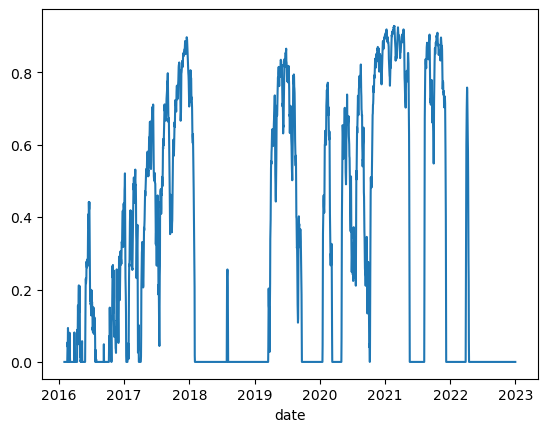

In [1008]:
df_final_with_smoothing_and_stretching_act['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

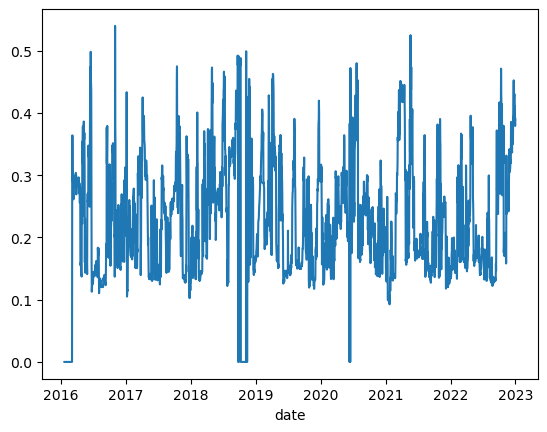

In [954]:
w_ma.plot()

<Axes: xlabel='date'>

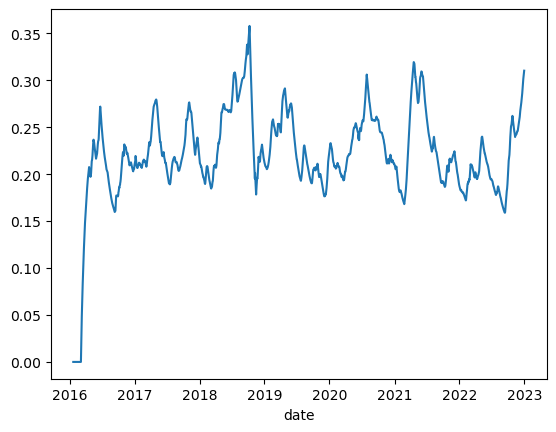

In [962]:
w_ma.plot()

<Axes: xlabel='date'>

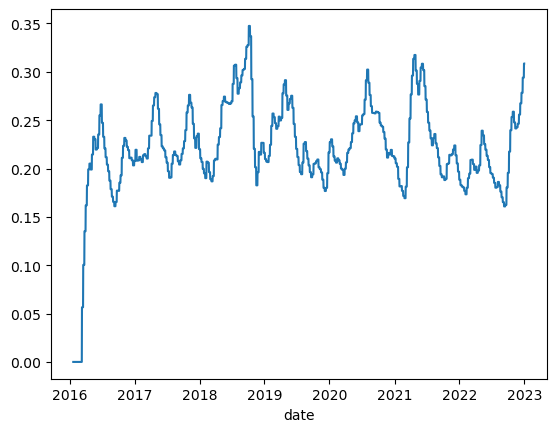

In [970]:
w_ma.plot()

<Axes: xlabel='date'>

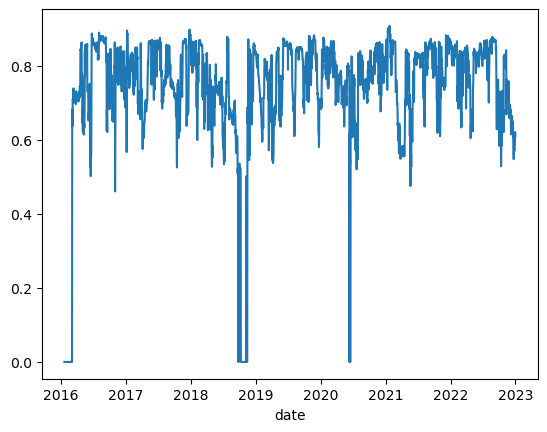

In [956]:
w_don.plot()

<Axes: xlabel='date'>

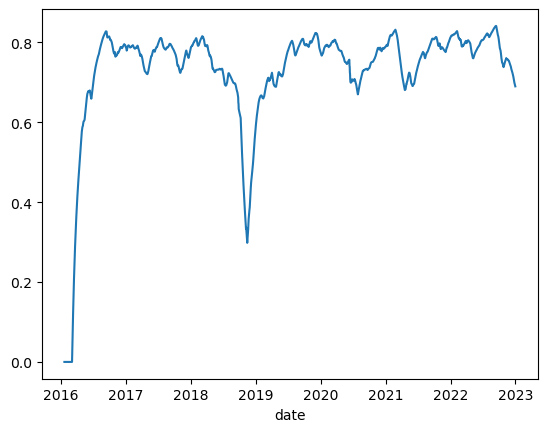

In [964]:
w_don.plot()

<Axes: xlabel='date'>

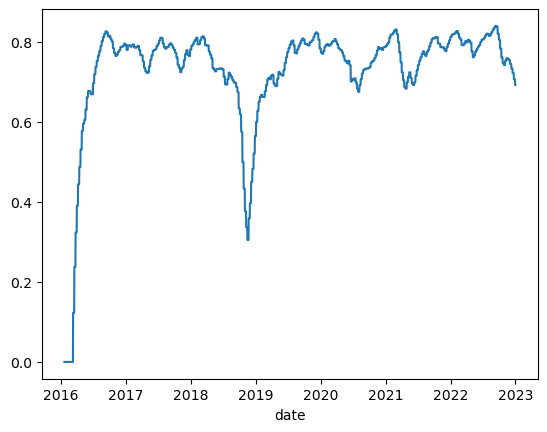

In [972]:
w_don.plot()

<Axes: xlabel='date'>

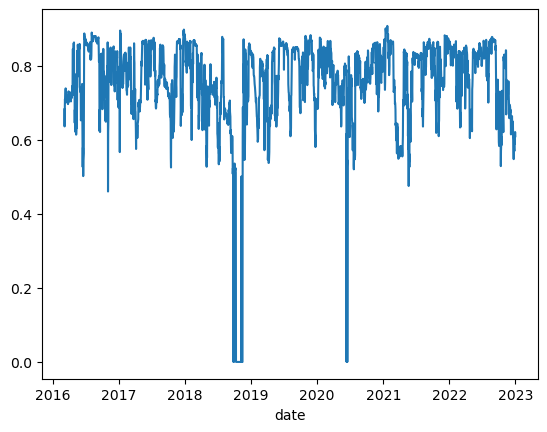

In [936]:
w_don.plot()

<Axes: xlabel='date'>

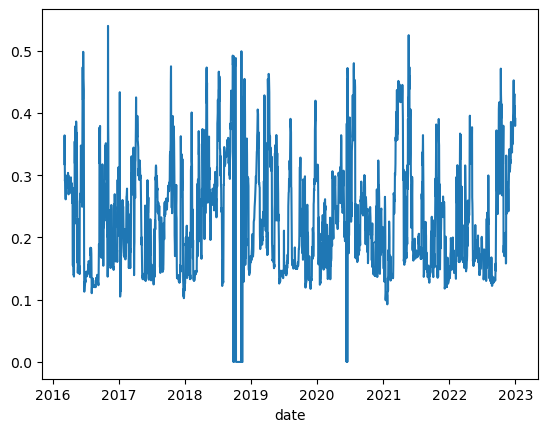

In [938]:
w_ma.plot()

<Axes: xlabel='date'>

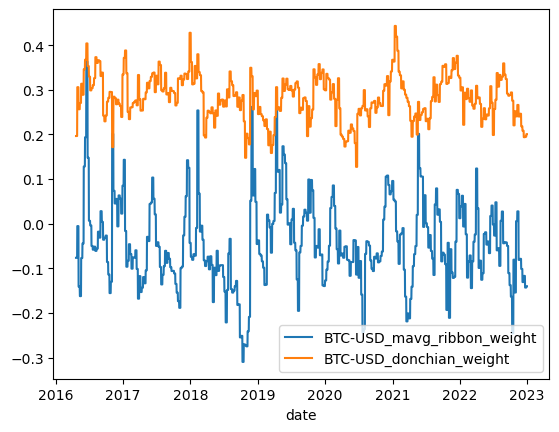

In [834]:
df_dynamic_weights[[mavg_weight_col, donchian_weight_col]].plot()

<Axes: xlabel='date'>

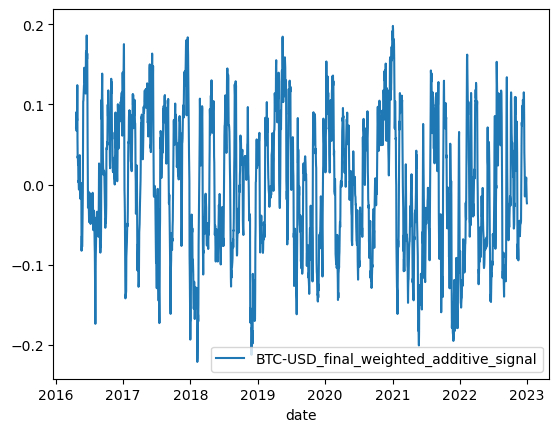

In [860]:
df_dynamic_weights[[f'{ticker}_final_weighted_additive_signal']].plot()

In [864]:
final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
final_signal_unscaled_95th_percentile = np.abs(df_dynamic_weights[f'{ticker}_final_weighted_additive_signal']).quantile(0.95)
k = np.arctanh(0.9) / final_signal_unscaled_95th_percentile

# Dead Band under abs(0.03)
# dead_band_cond = (np.abs(df_trend[final_weighted_additive_signal_col]) < 0.03)
# df_trend.loc[dead_band_cond, final_weighted_additive_signal_col] = 0
df_dynamic_weights[f'{ticker}_activation'] = np.tanh(df_dynamic_weights[f'{ticker}_final_weighted_additive_signal'] * k)
df_dynamic_weights[final_signal_col] = np.where(long_only, np.maximum(0, df_dynamic_weights[f'{ticker}_activation']), df_dynamic_weights[f'{ticker}_activation'])

<Axes: xlabel='date'>

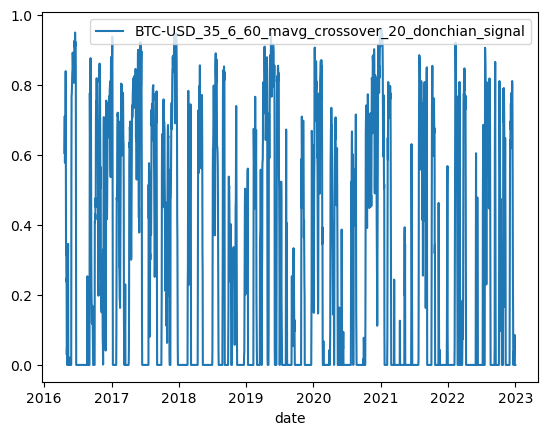

In [866]:
df_dynamic_weights[[final_signal_col]].plot()

<Axes: xlabel='date'>

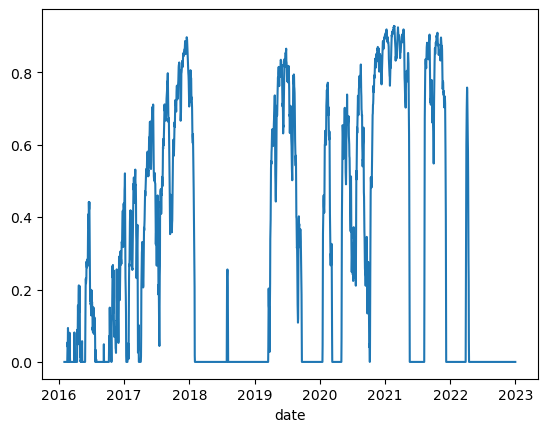

In [868]:
df_final_with_smoothing_and_stretching_act[final_signal_col].plot()

In [97]:
def pct_rank(x, window=250):
    return x.rank(pct=True)

## Original Signal
def generate_trend_signal_with_donchian_channel_continuous_with_dynamic_weights(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold,
                                                                                final_weighted_multiplicative_signal_threshold, donchian_signal_weight, ma_crossover_signal_weight,
                                                                                moving_avg_type='exponential', price_or_returns_calc='price',
                                                                                rolling_donchian_window=20, long_only=False, use_coinbase_data=True):

    # Pull Close Prices from Coinbase
    df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                        end_date=end_date, save_to_file=False)
    df = (df[['close','open']].rename(columns={'close': f'{ticker}_close', 'open': f'{ticker}_open'}))
    df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    
    # Create Column Names
    donchian_binary_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_binary_signal'
    donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
    donchian_continuous_signal_z_score_col = f'{ticker}_donchian_continuous_signal_z_score'
    donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
    trend_binary_signal_col = f'{ticker}_trend_signal'
    trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
    trend_continuous_signal_z_score_col = f'{ticker}_mavg_ribbon_z_score'
    trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
    # trend_donchian_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
    final_binary_signal_col = f'{ticker}_final_binary_signal'
    final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'#f'{ticker}_final_signal'
    strategy_returns_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'
    strategy_trades_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'

    # Generate Trend Signal
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize,
                                      slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={
                    f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                    f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))

    # Calculate Ribbon Slope and Z-Score
    mavg_cols = [f'{ticker}_{int(mavg)}_mavg' for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize)]
    df_trend[trend_continuous_signal_col] = df_trend[mavg_cols].apply(
        calc_ribbon_slope, 
        axis=1, 
        args=(ticker, fast_mavg, slow_mavg, mavg_stepsize)
    )

    ## Calculate Trend Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_trend[trend_continuous_signal_rank_col] = pct_rank(df_trend[trend_continuous_signal_col]) - 0.5

    # Generate Donchian Channels
    df_donchian = calculate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker,
                                              price_or_returns_calc=price_or_returns_calc,
                                              rolling_donchian_window=rolling_donchian_window,
                                              use_coinbase_data=use_coinbase_data)

    # Donchian Buy signal: Price crosses above upper band
    # Donchian Sell signal: Price crosses below lower band
    df_donchian[f't_1_close'] = df_donchian[f'close'].shift(1)
    t_1_close_col = f't_1_close'
    donchian_upper_band_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'
    donchian_lower_band_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'
    donchian_middle_band_col = f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'
    df_donchian[f'{donchian_upper_band_col}_t_2'] = df_donchian[donchian_upper_band_col].shift(1)
    df_donchian[f'{donchian_lower_band_col}_t_2'] = df_donchian[donchian_lower_band_col].shift(1)
    df_donchian[f'{donchian_middle_band_col}_t_2'] = df_donchian[donchian_middle_band_col].shift(1)
    df_donchian[donchian_binary_signal_col] = np.where(
        (df_donchian[t_1_close_col] > df_donchian[f'{donchian_upper_band_col}_t_2']), 1,
        np.where((df_donchian[t_1_close_col] < df_donchian[f'{donchian_lower_band_col}_t_2']), -1, 0))
    df_donchian[donchian_continuous_signal_col] = ((df_donchian[t_1_close_col] - df_donchian[f'{donchian_middle_band_col}_t_2']) /
                                                   (df_donchian[f'{donchian_upper_band_col}_t_2'] - df_donchian[f'{donchian_lower_band_col}_t_2']))

    ## Calculate Donchian Channel Rank
    ## Adjust the percentage ranks by 0.5 as without, the ranks go from 0 to 1. Recentering the function by giving it a steeper 
    ## slope near the origin takes into account even little information
    df_donchian[donchian_continuous_signal_rank_col] = pct_rank(df_donchian[donchian_continuous_signal_col]) - 0.5

    # Merging the Trend and Donchian Dataframes
    donchian_cols = [f'{donchian_upper_band_col}_t_2', f'{donchian_lower_band_col}_t_2', f'{donchian_middle_band_col}_t_2',
                     donchian_binary_signal_col, donchian_continuous_signal_col,
                     donchian_continuous_signal_rank_col]
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')

    # # Trend and Donchian Channel Signal
    # final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'

    # ## Weighted Sum of Rank Columns
    # ## Calculate the exponential weighted average of the ranked signals to remove short-term flip flops (whiplash)
    # df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]] = (
    #     df_trend[[trend_continuous_signal_rank_col, donchian_continuous_signal_rank_col]].ewm(span=3, adjust=False).mean())
    # df_trend[final_weighted_additive_signal_col] = (ma_crossover_signal_weight * df_trend[trend_continuous_signal_rank_col] +
    #                                                 donchian_signal_weight * df_trend[donchian_continuous_signal_rank_col])

    # # Activation Signal
    # final_signal_unscaled_95th_percentile = np.abs(df_trend[final_weighted_additive_signal_col]).quantile(0.95)
    # k = np.arctanh(0.9) / final_signal_unscaled_95th_percentile

    # # Dead Band under abs(0.03)
    # # dead_band_cond = (np.abs(df_trend[final_weighted_additive_signal_col]) < 0.03)
    # # df_trend.loc[dead_band_cond, final_weighted_additive_signal_col] = 0
    # df_trend[f'{ticker}_activation'] = np.tanh(df_trend[final_weighted_additive_signal_col] * k)
    # df_trend[final_signal_col] = np.where(long_only, np.maximum(0, df_trend[f'{ticker}_activation']), df_trend[f'{ticker}_activation'])

    ## Dynamic IC Weights
    df_trend = dynamic_ic_weights(df_trend, ticker, fast_mavg, mavg_stepsize, slow_mavg, rolling_donchian_window)
    
    return df_trend


def get_trend_donchian_signal_for_portfolio_macro_with_dynamic_weights(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold,
                                                                       final_weighted_multiplicative_signal_threshold,
                                                                       rolling_donchian_window, donchian_signal_weight, ma_crossover_signal_weight,
                                                                       long_only=False, price_or_returns_calc='price', use_coinbase_data=True):

    ## Generate trend signal for all tickers
    trend_list = []
    date_list = cn.coinbase_start_date_by_ticker_dict
    for ticker in ticker_list:

        # Create Column Names
        donchian_binary_signal_col = f'{ticker}_{rolling_donchian_window}_donchian_binary_signal'
        donchian_continuous_signal_col = f'{ticker}_donchian_continuous_signal'
        # donchian_continuous_signal_z_score_col = f'{ticker}_donchian_continuous_signal_z_score'
        donchian_continuous_signal_rank_col = f'{ticker}_donchian_continuous_signal_rank'
        trend_binary_signal_col = f'{ticker}_trend_signal'
        trend_continuous_signal_col = f'{ticker}_mavg_ribbon_slope'
        # trend_continuous_signal_z_score_col = f'{ticker}_mavg_ribbon_z_score'
        trend_continuous_signal_rank_col = f'{ticker}_mavg_ribbon_rank'
        final_binary_signal_col = f'{ticker}_final_binary_signal'
        final_signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        close_price_col = f'{ticker}_close'
        open_price_col = f'{ticker}_open'
        # signal_col = f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'
        final_weighted_additive_signal_col = f'{ticker}_final_weighted_additive_signal'
        lower_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}_t_2'
        upper_donchian_col = f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}_t_2'
        if pd.to_datetime(date_list[ticker]).date() > start_date:
            df_trend = generate_trend_signal_with_donchian_channel_continuous_with_dynamic_weights(
                start_date=pd.to_datetime(date_list[ticker]).date(), end_date=end_date, ticker=ticker,
                fast_mavg=fast_mavg, slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, 
                donchian_threshold=donchian_threshold, final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold, 
                final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold, rolling_donchian_window=rolling_donchian_window,
                donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight,
                price_or_returns_calc=price_or_returns_calc,
                long_only=long_only, use_coinbase_data=use_coinbase_data)
        else:
            df_trend = generate_trend_signal_with_donchian_channel_continuous_with_dynamic_weights(
                start_date=start_date, end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, donchian_threshold=donchian_threshold, 
                final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold,
                final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold,
                rolling_donchian_window=rolling_donchian_window, donchian_signal_weight=donchian_signal_weight,
                ma_crossover_signal_weight=ma_crossover_signal_weight,  
                price_or_returns_calc=price_or_returns_calc, long_only=long_only, use_coinbase_data=use_coinbase_data)
        trend_cols = [close_price_col, open_price_col, lower_donchian_col, upper_donchian_col, donchian_continuous_signal_col,
                      donchian_continuous_signal_rank_col, trend_continuous_signal_col, trend_continuous_signal_rank_col,
                      final_weighted_additive_signal_col, final_signal_col]
        df_trend = df_trend[trend_cols]
        trend_list.append(df_trend)

    df_trend = pd.concat(trend_list, axis=1)

    return df_trend

In [99]:
def apply_target_volatility_position_sizing_continuous_strategy_with_dynamic_weights(start_date, end_date, ticker_list, fast_mavg, slow_mavg,
                                                                                     mavg_stepsize, ma_crossover_signal_weight, rolling_donchian_window, donchian_signal_weight, long_only=False,
                                                                                     initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                                                     rolling_atr_window=20, atr_multiplier=0.5,
                                                                                     transaction_cost_est=0.001, passive_trade_rate=0.05,
                                                                                     use_coinbase_data=True, rolling_sharpe_window=50,
                                                                                     cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                                                     annual_trading_days=365, use_specific_start_date=False,
                                                                                     signal_start_date=None):

    ## Generate Trend Signal for all tickers
    df_trend = get_trend_donchian_signal_for_portfolio_macro_with_dynamic_weights(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                                                  slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, donchian_threshold=donchian_threshold, 
                                                                                  final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold,
                                                                                  final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold,
                                                                                  donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, 
                                                                                  rolling_donchian_window=rolling_donchian_window, long_only=long_only, use_coinbase_data=use_coinbase_data)
    
    ## Get Volatility Adjusted Trend Signal
    df_signal = get_volatility_adjusted_trend_signal_continuous(df_trend, ticker_list, volatility_window, fast_mavg, mavg_stepsize,
                                                                slow_mavg, rolling_donchian_window, annual_trading_days)

    ## Get Average True Range for Stop Loss Calculation
    df_atr = get_average_true_range_portfolio(start_date=start_date, end_date=end_date, ticker_list=ticker_list, rolling_atr_window=rolling_atr_window,
                                              price_or_returns_calc='price', use_coinbase_data=True)
    df_signal = pd.merge(df_signal, df_atr, left_index=True, right_index=True, how='left')

    ## Get Target Volatility Position Sizing and Run Cash Management
    df = get_target_volatility_daily_portfolio_positions(df_signal, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                                          rolling_donchian_window, initial_capital, rolling_cov_window,
                                                          rolling_atr_window, atr_multiplier, cash_buffer_percentage, annualized_target_volatility,
                                                          transaction_cost_est, passive_trade_rate, notional_threshold_pct, cooldown_counter_threshold)

    ## Calculate Portfolio Performance
    df = size.calculate_portfolio_returns(df, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                               rolling_sharpe_window)

    return df

In [129]:
## This contains a percentile rank with stretching the signal and exponential smoothing (span = 3), weights of 0.8 mavg and 0.2 donchian
df_final_with_dynamic_weights = apply_target_volatility_position_sizing_continuous_strategy_with_dynamic_weights(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                                                                                 mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window,
                                                                                                                 donchian_signal_weight=donchian_signal_weight, ma_crossover_signal_weight=ma_crossover_signal_weight, long_only=long_only,
                                                                                                                 initial_capital=initial_capital, rolling_cov_window=rolling_cov_window, volatility_window=volatility_window,
                                                                                                                 rolling_atr_window=rolling_atr_window, atr_multiplier=atr_multiplier,
                                                                                                                 transaction_cost_est=transaction_cost_est, passive_trade_rate=passive_trade_rate, use_coinbase_data=use_coinbase_data,
                                                                                                                 rolling_sharpe_window=rolling_sharpe_window, cash_buffer_percentage=cash_buffer_percentage, 
                                                                                                                 annualized_target_volatility=annualized_target_volatility,
                                                                                                                 annual_trading_days=annual_trading_days, use_specific_start_date=use_specific_start_date, signal_start_date=signal_start_date)

In [130]:
df_final_with_dynamic_weights.head()

,BTC-USD_20_avg_true_range_price,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_cash_shrink_factor,BTC-USD_close,BTC-USD_cooldown_counter,BTC-USD_event,BTC-USD_final_weighted_additive_signal,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_stopout_flag,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,18.219570,357.53,449.19,NaN,0.0,0.0,1.076237,1.0,371.33,0.0,NaN,-0.0,0.00,0.0,0.0,367.89,0.0,0.0,0.0,0.0,False,367.95,-0.027770,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.000000e+00,1.0,0.0,0.0,NaN
2016-02-02,17.697706,357.53,434.01,NaN,0.0,0.0,1.072386,1.0,372.93,0.0,No Position,-0.0,371.33,0.0,0.0,371.33,0.0,0.0,0.0,0.0,False,371.33,0.009186,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN
2016-02-03,16.320782,357.53,432.77,NaN,0.0,0.0,1.073254,1.0,368.87,0.0,No Position,-0.0,372.93,0.0,0.0,372.93,0.0,0.0,0.0,0.0,False,372.93,0.004309,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN
2016-02-04,15.469279,357.53,430.03,NaN,0.0,0.0,1.073469,1.0,387.99,0.0,No Position,-0.0,368.87,0.0,0.0,368.87,0.0,0.0,0.0,0.0,False,368.87,-0.010887,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN
2016-02-05,16.080776,357.53,418.54,NaN,0.0,0.0,0.814133,1.0,384.50,0.0,No Position,-0.0,387.99,0.0,0.0,387.99,0.0,0.0,0.0,0.0,False,387.99,0.051834,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN


In [83]:
df_final_with_smoothing_and_stretching_act.head()

,BTC-USD_20_avg_true_range_price,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_cash_shrink_factor,BTC-USD_close,BTC-USD_cooldown_counter,BTC-USD_event,BTC-USD_final_weighted_additive_signal,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_stopout_flag,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,18.219570,357.53,449.19,0.0,0.0,0.0,1.076237,1.0,371.33,0.0,NaN,-0.128382,0.00,0.0,0.0,367.89,0.0,0.0,0.0,0.0,False,367.95,-0.027770,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.000000e+00,1.0,0.0,0.0,NaN
2016-02-02,17.697706,357.53,434.01,0.0,0.0,0.0,1.072386,1.0,372.93,0.0,No Position,-0.128623,371.33,0.0,0.0,371.33,0.0,0.0,0.0,0.0,False,371.33,0.009186,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN
2016-02-03,16.320782,357.53,432.77,0.0,0.0,0.0,1.073254,1.0,368.87,0.0,No Position,-0.128225,372.93,0.0,0.0,372.93,0.0,0.0,0.0,0.0,False,372.93,0.004309,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN
2016-02-04,15.469279,357.53,430.03,0.0,0.0,0.0,1.073469,1.0,387.99,0.0,No Position,-0.130672,368.87,0.0,0.0,368.87,0.0,0.0,0.0,0.0,False,368.87,-0.010887,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN
2016-02-05,16.080776,357.53,418.54,0.0,0.0,0.0,0.814133,1.0,384.50,0.0,No Position,-0.106227,387.99,0.0,0.0,387.99,0.0,0.0,0.0,0.0,False,387.99,0.051834,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.000000e+12,0.0,0.0,0.0,NaN


<Axes: xlabel='date'>

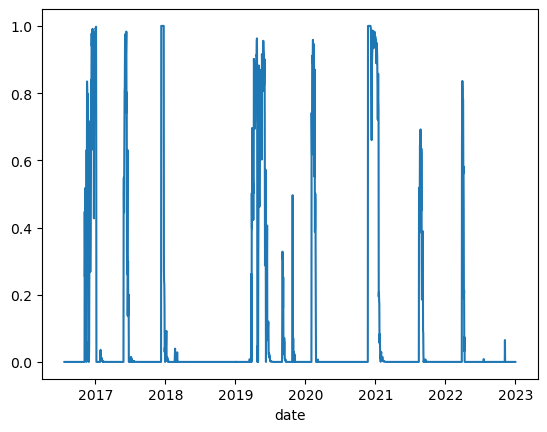

In [131]:
df_final_with_dynamic_weights['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

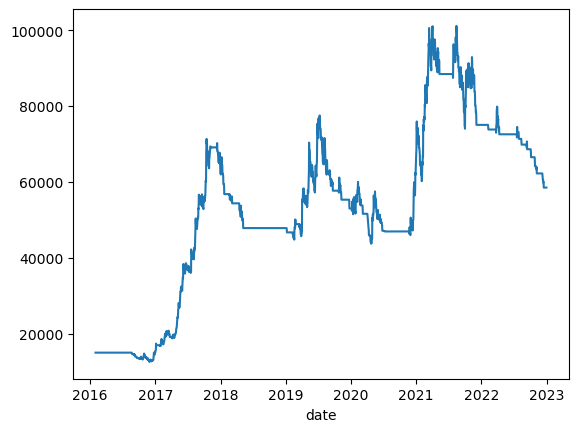

In [135]:
df_final_with_dynamic_weights['total_portfolio_value'].plot()

<Axes: xlabel='date'>

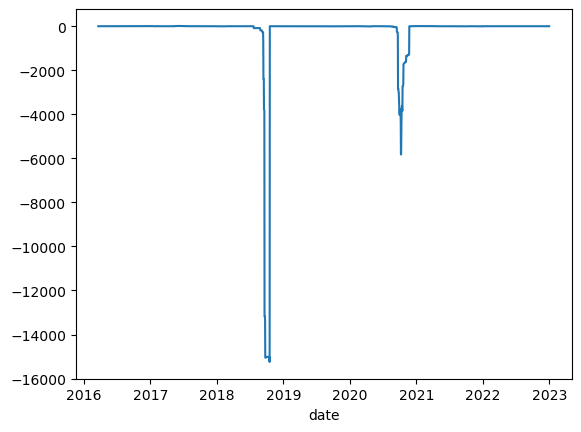

In [137]:
df_final_with_dynamic_weights['portfolio_rolling_sharpe_50'].plot()

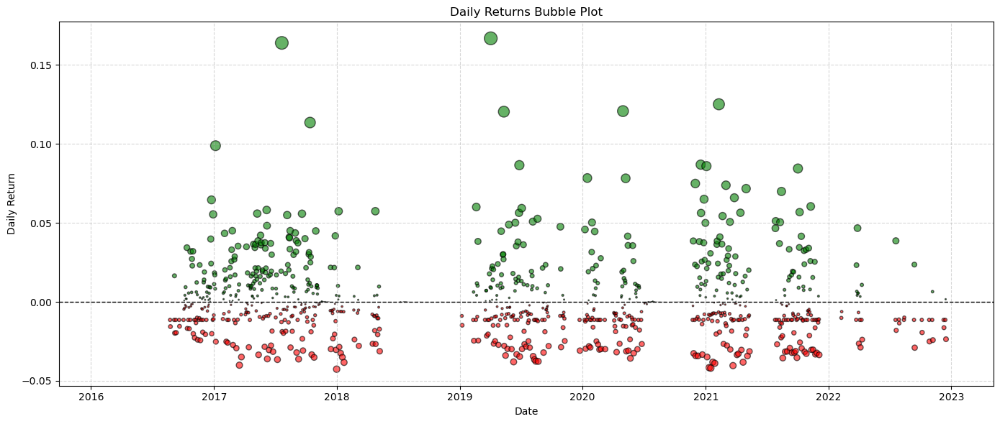

In [139]:
plot_daily_returns_bubble(df_final_with_dynamic_weights, return_col='portfolio_daily_pct_returns')

In [141]:
## This contains only a percentile rank, weights of 0.8 mavg and 0.2 donchian
perf.calculate_risk_and_performance_metrics(df_final_with_dynamic_weights, strategy_daily_return_col='portfolio_daily_pct_returns',strategy_trade_count_col='count_of_positions',
                                           annual_trading_days=365, include_transaction_costs_and_fees=False)

{'annualized_return': 0.21738088022308566,
 'annualized_sharpe_ratio': 0.6514068193836372,
 'calmar_ratio': 0.4982768362568995,
 'annualized_std_dev': 0.5151443188803919,
 'max_drawdown': -0.43626527344933475,
 'max_drawdown_duration': Timedelta('619 days 00:00:00'),
 'hit_rate': 0.18131433095803642,
 't_statistic': 2.1566146588558235,
 'p_value': 0.031129830489272495,
 'trade_count': 594.0}

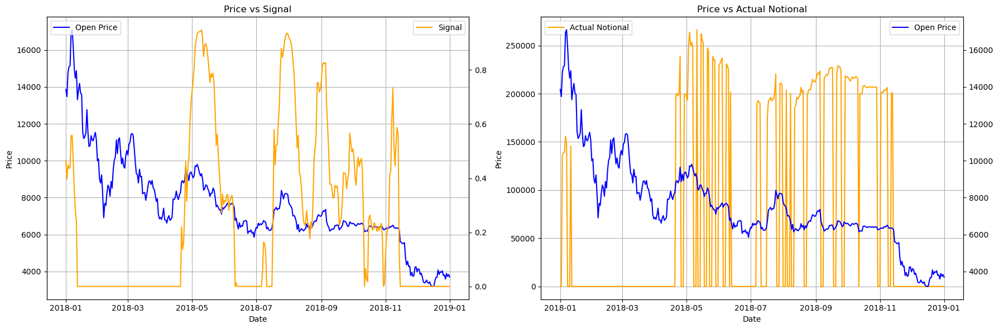

In [145]:
ticker = ticker_list[0]
fig = plt.figure(figsize=(18,6))
layout = (1,2)
final_signal_col = f'{ticker}_35_6_60_mavg_crossover_20_donchian_signal'
target_notional_col = f'{ticker}_target_notional'
actual_position_notional_col = f'{ticker}_actual_position_notional'

trend_ax = plt.subplot2grid(layout, (0,0), colspan=1)
target_notional_ax = plt.subplot2grid(layout, (0,1), colspan=1)
trend_ax2 = trend_ax.twinx()
date_cond = (df_size.index >= pd.Timestamp('2018-01-01').date()) & (df_size.index <= pd.Timestamp('2019-01-01').date())
_ = trend_ax.plot(df_size[date_cond].index, df_size[date_cond][f'{ticker}_open'], label='Open Price', color='blue')
_ = trend_ax2.plot(df_size[date_cond].index, df_size[date_cond][final_signal_col], label=f'Signal', color='orange')

target_notional_ax2 = target_notional_ax.twinx()
_ = target_notional_ax.plot(df_size[date_cond].index, df_size[date_cond][actual_position_notional_col], label=f'Actual Notional', color='orange')
_ = target_notional_ax2.plot(df_size[date_cond].index, df_size[date_cond][f'{ticker}_open'], label='Open Price', color='blue')

_ = trend_ax.set_title(f'Price vs Signal')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend(loc='upper left')
_ = trend_ax2.legend(loc='upper right')
_ = trend_ax.grid()

_ = target_notional_ax.set_title(f'Price vs Actual Notional')
_ = target_notional_ax.set_ylabel('Price')
_ = target_notional_ax.set_xlabel('Date')
_ = target_notional_ax.legend(loc='upper left')
_ = target_notional_ax2.legend(loc='upper right')
_ = target_notional_ax.grid()

plt.tight_layout()

<Axes: xlabel='date'>

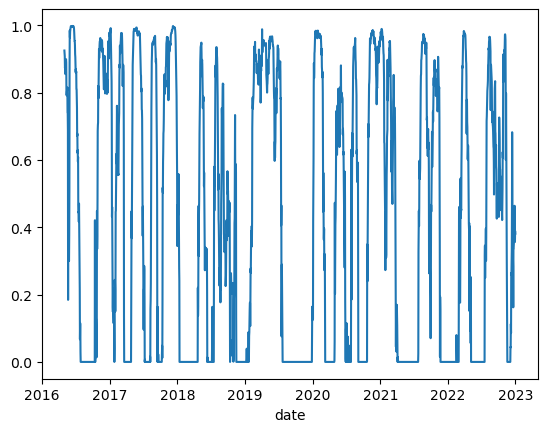

In [149]:
df_size['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

In [151]:
df_size.groupby(['BTC-USD_event']).size()

BTC-USD_event
Add Long Position       39
Close Long Position    177
New Long Position      178
No Position            992
Open Long Position     809
Stop-Loss Cooldown     302
Trim Long Position      28
dtype: int64

In [435]:
df_size[df_size.index >= pd.Timestamp('2016-04-30').date()][cols].head(200)

,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_event,BTC-USD_open_position_size,BTC-USD_open_position_notional,BTC-USD_new_position_size,BTC-USD_new_position_notional,BTC-USD_actual_position_size,BTC-USD_actual_position_notional,BTC-USD_new_position_entry_exit_price,BTC-USD_t_1_close,BTC-USD_open,BTC-USD_stop_loss,available_cash,BTC-USD_short_sale_proceeds,total_portfolio_value,count_of_positions
date,,,,,,,,,,,,,,,,,,
2016-04-30,0.924872,13500.000000,29.423303,New Long Position,0.000000,0.000000,29.050894,13328.550000,29.050894,13328.550000,458.800000,458.82,458.80,447.302209,1500.000000,0.0,14828.550000,1.0
2016-05-01,0.913437,13345.695000,29.394509,Open Long Position,29.050894,13189.686728,0.000000,0.000000,29.050894,13189.686728,454.020000,454.02,454.02,442.741046,1500.000000,0.0,14689.686728,0.0
2016-05-02,0.908136,13220.718056,28.930627,Open Long Position,29.050894,13275.677374,0.000000,0.000000,29.050894,13275.677374,456.980000,456.98,456.98,446.249518,1500.000000,0.0,14775.677374,0.0
2016-05-03,0.873123,13298.109636,29.788338,Open Long Position,29.050894,12972.095535,0.000000,0.000000,29.050894,12972.095535,446.530000,446.42,446.53,435.144326,1500.000000,0.0,14472.095535,0.0
2016-05-04,0.878103,13024.885982,28.802738,Open Long Position,29.050894,13137.104611,0.000000,0.000000,29.050894,13137.104611,452.210000,452.21,452.21,440.986771,1500.000000,0.0,14637.104611,0.0
2016-05-05,0.855045,13173.394150,29.360333,Open Long Position,29.050894,13031.940376,0.000000,0.000000,29.050894,13031.940376,448.590000,448.68,448.59,437.819459,1500.000000,0.0,14531.940376,0.0
2016-05-06,0.855037,13078.746338,29.065173,Open Long Position,29.050894,13072.611627,0.000000,0.000000,29.050894,13072.611627,449.990000,449.98,449.99,439.810940,1500.000000,0.0,14572.611627,0.0
2016-05-07,0.896643,13115.350464,28.369169,Open Long Position,29.050894,13430.518637,0.000000,0.000000,29.050894,13430.518637,462.310000,462.31,462.31,451.682279,1500.000000,0.0,14930.518637,0.0
2016-05-08,0.895947,13437.466773,29.091093,Open Long Position,29.050894,13418.898279,0.000000,0.000000,29.050894,13418.898279,461.910000,461.91,461.91,451.870633,1500.000000,0.0,14918.898279,0.0


In [441]:
1 - 13312.725833/13483.972281

0.012700000002321299

In [437]:
14812.725833-1500

13312.725833

In [397]:
df_size[df_size.index >= pd.Timestamp('2016-06-21').date()].head(200)

,BTC-USD_20_avg_true_range_price,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,equity_curve,equity_curve_cum_max,drawdown,drawdown_pct,End,Start,equity_curve_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-06-21,43.389653,531.34,769.76,0.989494,0.000000,0.000000,0.839879,667.66,Close Long Position,728.133542,-21205.868930,-29.123599,706.47,0.000000,0.000000,0.0,0.000000,703.12,-0.085384,18088.029026,25.725380,0.833454,1.178139,0.051792,24074.295303,1.0,0.000000,18088.029026,24074.295303,21702.502683,0.707432,8.487961e-01,0.707432,-0.001642,0.604953,0.000000,0.604953,1.604953,1.607925,-0.002972,-0.001848,2016-06-21,15,7 days,False
2016-06-22,47.796353,534.84,769.76,0.979536,16920.592000,25.334779,0.884968,604.50,New Long Position,667.880000,16920.592000,25.334779,667.88,0.000000,0.000000,0.0,620.083647,667.66,-0.050432,17138.247746,25.669125,0.790989,1.106860,0.051271,6936.047557,1.0,16920.592000,17138.247746,23856.639556,21666.865773,0.714624,9.034565e-01,0.714624,-0.009041,0.590443,0.000000,0.590443,1.590443,1.607925,-0.017482,-0.010873,2016-06-22,15,7 days,False
2016-06-23,53.899557,537.87,769.76,0.961291,0.000000,0.000000,0.995804,631.10,Close Long Position,620.083647,-16920.592000,-27.287596,606.13,0.000000,0.000000,0.0,0.000000,604.50,-0.094599,15093.019532,24.967774,0.702950,0.965342,0.050316,23833.429386,1.0,0.000000,15093.019532,23833.429386,21470.975601,0.728187,1.035902e+00,0.728187,-0.000973,0.588895,7.115152,0.588895,1.588895,1.607925,-0.019030,-0.011835,2016-06-23,15,7 days,False
2016-06-24,57.695790,571.25,769.76,0.953149,15134.203855,23.980675,0.979528,669.98,New Long Position,631.100000,15134.203855,23.980675,631.10,0.000000,0.000000,0.0,573.404210,631.10,0.044003,15328.880639,24.289147,0.714630,0.973070,0.049890,8504.548747,1.0,15134.203855,15328.880639,23638.752602,21450.086448,0.734408,1.027676e+00,0.734408,-0.008168,0.575917,7.097645,0.575917,1.575917,1.607925,-0.032008,-0.019907,2016-06-24,15,7 days,False
2016-06-25,58.771429,575.17,769.76,0.953369,16066.572490,23.980675,1.007753,673.71,Open Long Position,669.980000,0.000000,0.000000,669.98,16066.572490,23.980675,0.0,611.208571,669.98,0.061607,14777.836737,22.057131,0.694614,0.946035,0.049902,8504.548747,0.0,16066.572490,14777.836737,24571.121238,21274.877342,0.734238,1.057044e+00,0.734238,0.039442,0.638075,7.536147,0.638075,1.638075,1.638075,0.000000,0.000000,2016-06-25,16,0 days,True
2016-06-26,57.840817,575.17,769.76,0.940971,16156.020407,23.980675,1.006707,638.56,Open Long Position,673.710000,0.000000,0.000000,673.71,16156.020407,23.980675,0.0,615.869183,673.71,0.005567,15376.668701,22.823869,0.695336,0.934701,0.049253,8504.548747,0.0,16156.020407,15376.668701,24660.569154,22114.009114,0.743913,1.069861e+00,0.743913,0.003640,0.644038,7.256425,0.644038,1.644038,1.644038,0.000000,0.000000,2016-06-26,17,5 days,True
2016-06-27,57.111215,577.46,769.76,0.914078,14131.480044,22.130231,1.038569,657.87,Trim Long Position,638.560000,-1181.619645,-1.850444,638.56,15313.099688,23.980675,0.0,581.448785,638.56

In [365]:
df_size[df_size['BTC-USD_actual_position_notional'] > df_size['BTC-USD_target_notional']][cols].head()

,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_event,BTC-USD_open_position_size,BTC-USD_open_position_notional,BTC-USD_new_position_size,BTC-USD_new_position_notional,BTC-USD_actual_position_size,BTC-USD_actual_position_notional,BTC-USD_t_1_close,BTC-USD_open,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_stop_loss,available_cash,BTC-USD_short_sale_proceeds,total_portfolio_value,count_of_positions
date,,,,,,,,,,,,,,,,,,,
2016-05-02,0.908136,13220.718056,28.930627,Open Long Position,29.050894,13275.677374,0.0,0.0,29.050894,13275.677374,456.98,456.98,470.59,423.94,446.249518,1500.0,0.0,14775.677374,0.0
2016-05-04,0.878103,13024.885982,28.802738,Open Long Position,29.050894,13137.104611,0.0,0.0,29.050894,13137.104611,452.21,452.21,470.59,425.58,440.986771,1500.0,0.0,14637.104611,0.0
2016-05-07,0.896643,13115.350464,28.369169,Open Long Position,29.050894,13430.518637,0.0,0.0,29.050894,13430.518637,462.31,462.31,470.59,430.97,451.682279,1500.0,0.0,14930.518637,0.0
2016-05-09,0.899040,13427.008451,29.013178,Open Long Position,29.050894,13438.943396,0.0,0.0,29.050894,13438.943396,462.79,462.60,470.59,430.97,452.802478,1500.0,0.0,14938.943396,0.0
2016-05-10,0.888766,13445.049056,28.966410,Open Long Position,29.050894,13483.972281,0.0,0.0,29.050894,13483.972281,464.16,464.15,470.59,437.06,454.667480,1500.0,0.0,14983.972281,0.0


In [297]:
df_size[df_size[f'{ticker}_event'] == 'Close Short Position']

,BTC-USD_20_avg_true_range_price,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_new_position_entry_exit_price,BTC-USD_new_position_notional,BTC-USD_new_position_size,BTC-USD_open,BTC-USD_open_position_notional,BTC-USD_open_position_size,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,cash_scaling_factor,final_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,equity_curve,equity_curve_cum_max,drawdown,drawdown_pct,End,Start,equity_curve_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [75]:
df_size.groupby([f'{ticker}_event']).size()

BTC-USD_event
Add Long Position      606
Close Long Position    105
New Long Position      106
No Position            996
Trim Long Position     712
dtype: int64

<Axes: xlabel='date'>

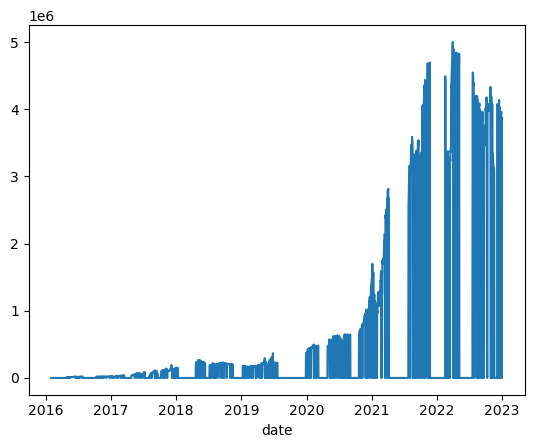

In [153]:
date_cond = (df_size.index >= pd.Timestamp('2017-01-01').date()) & (df_size.index <= pd.Timestamp('2018-01-01').date())
df_size[f'{ticker}_actual_position_notional'].plot()

<Axes: xlabel='date'>

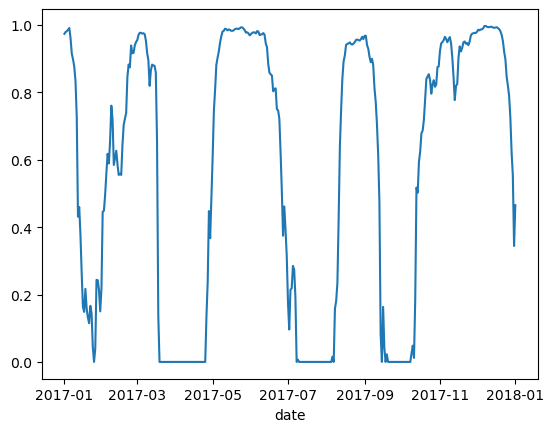

In [155]:
df_size[date_cond]['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].plot()

<Axes: xlabel='date'>

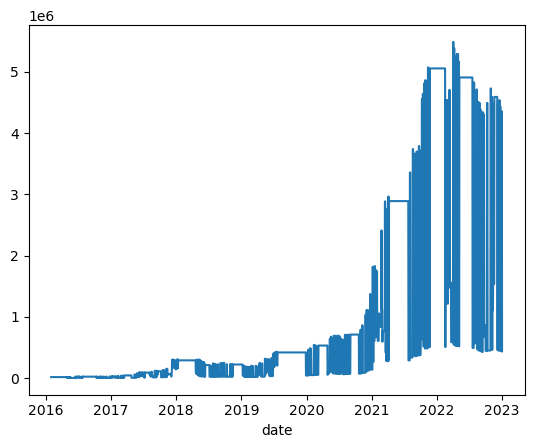

In [157]:
df_size['available_cash'].plot()

<Axes: xlabel='date'>

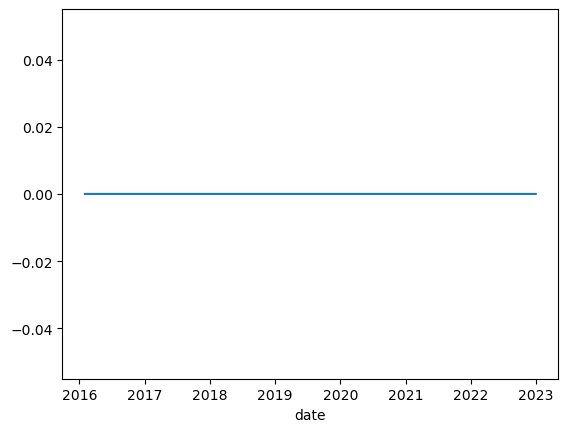

In [159]:
df_size[f'{ticker}_short_sale_proceeds'].plot()

In [451]:
df_size[cols].tail()

,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_event,BTC-USD_open_position_size,BTC-USD_open_position_notional,BTC-USD_new_position_size,BTC-USD_new_position_notional,BTC-USD_actual_position_size,BTC-USD_actual_position_notional,BTC-USD_new_position_entry_exit_price,BTC-USD_t_1_close,BTC-USD_open,BTC-USD_stop_loss,available_cash,BTC-USD_short_sale_proceeds,total_portfolio_value,count_of_positions
date,,,,,,,,,,,,,,,,,,
2022-12-27,0.463742,5.950481e+06,351.725674,Open Long Position,353.226407,5.975411e+06,0.0,0.0,353.226407,5.975411e+06,16916.66,16917.96,16916.66,16558.064821,667131.099686,0.0,6.642542e+06,0.0
2022-12-28,0.397180,5.978288e+06,358.008539,Open Long Position,353.226407,5.898284e+06,0.0,0.0,353.226407,5.898284e+06,16698.31,16698.73,16698.31,16337.578171,667131.099686,0.0,6.565415e+06,0.0
2022-12-29,0.356132,5.908874e+06,357.254843,Open Long Position,353.226407,5.842245e+06,0.0,0.0,353.226407,5.842245e+06,16539.66,16539.66,16539.66,16183.059774,667131.099686,0.0,6.509376e+06,0.0
2022-12-30,0.389072,5.858438e+06,352.333430,Open Long Position,353.226407,5.873223e+06,0.0,0.0,353.226407,5.873223e+06,16627.36,16627.54,16627.36,16288.025510,667131.099686,0.0,6.540354e+06,0.0
2022-12-31,0.380897,5.886318e+06,354.595356,Open Long Position,353.226407,5.863551e+06,0.0,0.0,353.226407,5.863551e+06,16599.98,16600.10,16599.98,16262.122128,667131.099686,0.0,6.530682e+06,0.0


<Axes: xlabel='date'>

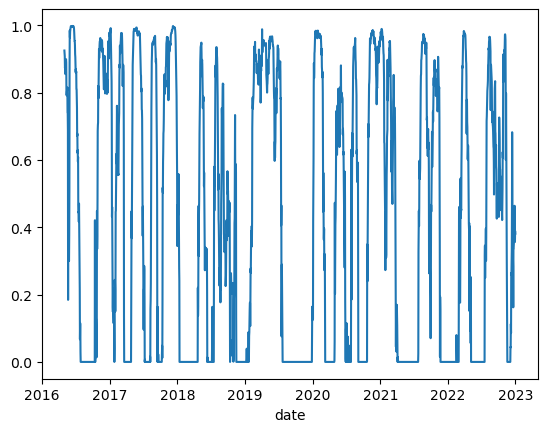

In [91]:
ticker = ticker_list[0]
df_size[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'].plot()

<Axes: xlabel='date'>

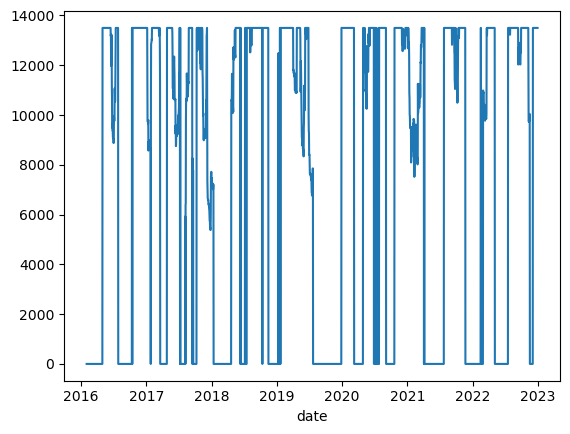

In [93]:
ticker = ticker_list[0]
df_size[f'{ticker}_target_notional'].plot()

In [61]:
df_position = df_size.copy()

In [63]:
df_position.head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,cash_scaling_factor,final_scaling_factor
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,357.53,449.19,NaN,0.0,0.0,0.0,0.0,1.076237,371.33,NaN,367.89,0.0,0.0,367.95,-0.027770,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.0,NaN,NaN
2016-02-02,357.53,434.01,NaN,0.0,0.0,0.0,0.0,1.072386,372.93,NaN,371.33,0.0,0.0,371.33,0.009186,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,1.000000e+12,0.0
2016-02-03,357.53,432.77,NaN,0.0,0.0,0.0,0.0,1.073254,368.87,NaN,372.93,0.0,0.0,372.93,0.004309,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,1.000000e+12,0.0
2016-02-04,357.53,430.03,NaN,0.0,0.0,0.0,0.0,1.073469,387.99,NaN,368.87,0.0,0.0,368.87,-0.010887,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,1.000000e+12,0.0
2016-02-05,357.53,418.54,NaN,0.0,0.0,0.0,0.0,0.814133,384.50,NaN,387.99,0.0,0.0,387.99,0.051834,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,1.000000e+12,0.0


In [67]:
df_position[df_position['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].notnull()].head(200)

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,cash_scaling_factor,final_scaling_factor
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-04-30,419.46,470.59,0.924872,0.0,0.0,13330.700109,29.055580,0.307661,454.02,NaN,458.80,0.0,0.0,458.82,0.015808,13500.000000,29.423303,1.000000,3.006135,0.048410,1500.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.756861,1.0,3.326530e-01,0.332653
2016-05-01,423.40,470.59,0.913437,0.0,0.0,13500.000000,29.734373,0.313383,456.98,NaN,454.02,0.0,0.0,454.02,-0.010462,13500.000000,29.734373,1.000000,2.914759,0.047811,14828.550000,0.0,0.0,13500.000000,15000.0,13500.0,0.766336,1.0,3.430816e-01,0.343082
2016-05-02,423.94,470.59,0.908136,0.0,0.0,13500.000000,29.734373,0.313428,446.42,NaN,456.98,0.0,0.0,456.98,0.006520,13500.000000,29.541774,1.000000,2.897431,0.047534,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.770810,1.0,3.451334e-01,0.345133
2016-05-03,425.58,470.59,0.873123,0.0,0.0,13500.000000,29.734373,0.332747,452.21,NaN,446.53,0.0,0.0,446.42,-0.023108,13500.000000,30.240581,1.000000,2.623986,0.045701,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.801720,1.0,3.810996e-01,0.381100
2016-05-04,425.58,470.59,0.878103,0.0,0.0,13500.000000,29.734373,0.333958,448.68,NaN,452.21,0.0,0.0,452.21,0.012970,13500.000000,29.853387,1.000000,2.629385,0.045962,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.797173,1.0,3.803170e-01,0.380317
2016-05-05,426.32,470.59,0.855045,0.0,0.0,13500.000000,29.734373,0.337226,449.98,NaN,448.59,0.0,0.0,448.68,-0.007806,13500.000000,30.088259,1.000000,2.535524,0.044755,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.818670,1.0,3.943957e-01,0.394396
2016-05-06,430.93,470.59,0.855037,0.0,0.0,13500.000000,29.734373,0.335262,462.31,NaN,449.99,0.0,0.0,449.98,0.002897,13500.000000,30.001333,1.000000,2.550357,0.044755,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.818678,1.0,3.921020e-01,0.392102
2016-05-07,430.97,470.59,0.896643,0.0,0.0,13500.000000,29.734373,0.351877,461.91,NaN,462.31,0.0,0.0,462.31,0.027401,13500.000000,29.201185,1.000000,2.548171,0.046932,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.780690,1.0,3.924383e-01,0.392438
2016-05-08,430.97,470.59,0.895947,0.0,0.0,13500.000000,29.734373,0.350171,462.79,NaN,461.91,0.0,0.0,461.91,-0.000865,13500.000000,29.226473,1.000000,2.558598,0.046896,15000.000000,0.0,0.0,13500.000000,15000.0,13500.0,0.781296,1.0,3.908390e-01,0.390839


In [69]:
df_position[df_position['BTC-USD_35_6_60_mavg_crossover_20_donchian_signal'].notnull()].head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_position_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,cash_scaling_factor,final_scaling_factor
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-04-30,419.46,470.59,0.924872,0.0,0.0,13330.700109,29.055580,0.307661,454.02,NaN,458.80,0.0,0.0,458.82,0.015808,13500.0,29.423303,1.0,3.006135,0.048410,1500.00,0.0,0.0,13500.0,15000.0,13500.0,0.756861,1.0,0.332653,0.332653
2016-05-01,423.40,470.59,0.913437,0.0,0.0,13500.000000,29.734373,0.313383,456.98,NaN,454.02,0.0,0.0,454.02,-0.010462,13500.0,29.734373,1.0,2.914759,0.047811,14828.55,0.0,0.0,13500.0,15000.0,13500.0,0.766336,1.0,0.343082,0.343082
2016-05-02,423.94,470.59,0.908136,0.0,0.0,13500.000000,29.734373,0.313428,446.42,NaN,456.98,0.0,0.0,456.98,0.006520,13500.0,29.541774,1.0,2.897431,0.047534,15000.00,0.0,0.0,13500.0,15000.0,13500.0,0.770810,1.0,0.345133,0.345133
2016-05-03,425.58,470.59,0.873123,0.0,0.0,13500.000000,29.734373,0.332747,452.21,NaN,446.53,0.0,0.0,446.42,-0.023108,13500.0,30.240581,1.0,2.623986,0.045701,15000.00,0.0,0.0,13500.0,15000.0,13500.0,0.801720,1.0,0.381100,0.381100
2016-05-04,425.58,470.59,0.878103,0.0,0.0,13500.000000,29.734373,0.333958,448.68,NaN,452.21,0.0,0.0,452.21,0.012970,13500.0,29.853387,1.0,2.629385,0.045962,15000.00,0.0,0.0,13500.0,15000.0,13500.0,0.797173,1.0,0.380317,0.380317


<Axes: xlabel='date'>

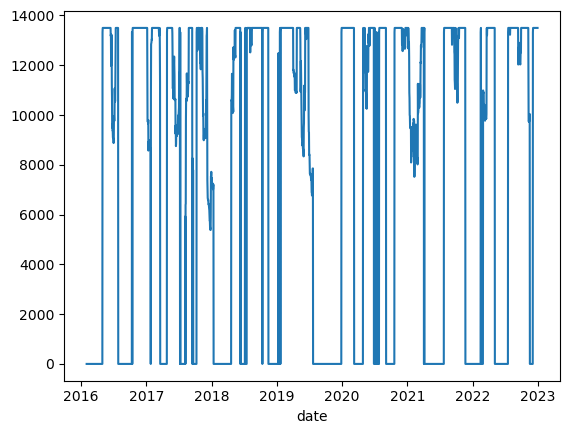

In [71]:
df_position['BTC-USD_actual_position_notional'].plot()

<Axes: xlabel='date'>

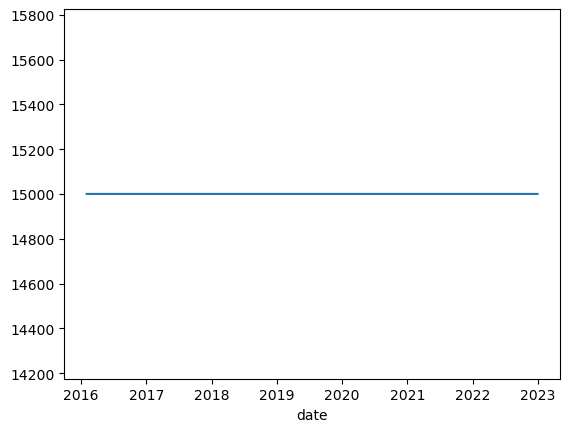

In [73]:
df_position['total_portfolio_value'].plot()

In [45]:
def apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                           final_weighted_additive_signal_threshold, 
                                                           final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                           donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                           macro_signal_200d_weight, macro_signal_100d_weight, long_only=False,
                                                           initial_capital=15000, rolling_cov_window=20, volatility_window=20,
                                                           transaction_cost_est=0.001, passive_trade_rate=0.05,
                                                           use_coinbase_data=True, rolling_sharpe_window=50,
                                                           cash_buffer_percentage=0.10, annualized_target_volatility=0.20,
                                                           annual_trading_days=365, use_specific_start_date=False,
                                                           signal_start_date=None):
    ## Generate Trend Signal for all tickers
    df_trend = get_trend_donchian_signal_for_portfolio_macro(start_date=start_date, end_date=end_date, ticker_list=ticker_list, fast_mavg=fast_mavg,
                                                             slow_mavg=slow_mavg, mavg_stepsize=mavg_stepsize, mavg_z_score_threshold=mavg_z_score_threshold, donchian_threshold=donchian_threshold, 
                                                             final_weighted_additive_signal_threshold=final_weighted_additive_signal_threshold,
                                                             final_weighted_multiplicative_signal_threshold=final_weighted_multiplicative_signal_threshold,
                                                             donchian_signal_weight=donchian_signal_weight,
                                                             ma_crossover_signal_weight=ma_crossover_signal_weight, ribbon_width_signal_weight=ribbon_width_signal_weight,
                                                             macro_signal_200d_weight=macro_signal_200d_weight, macro_signal_100d_weight=macro_signal_100d_weight, 
                                                             rolling_donchian_window=rolling_donchian_window, long_only=long_only, use_coinbase_data=use_coinbase_data)

    ## Get Volatility Adjusted Trend Signal
    df_signal = size.get_volatility_adjusted_trend_signal(df_trend, ticker_list, volatility_window, fast_mavg, mavg_stepsize,
                                                                slow_mavg, rolling_donchian_window, annual_trading_days)

    ## Get Daily Positions
    df = size.get_target_volatility_daily_portfolio_positions(df_signal, ticker_list, fast_mavg, slow_mavg, mavg_stepsize,
                                                              rolling_donchian_window, initial_capital, rolling_cov_window,
                                                              cash_buffer_percentage, annualized_target_volatility,
                                                              transaction_cost_est, passive_trade_rate, annual_trading_days,
                                                              use_specific_start_date, signal_start_date)

    ## Calculate Portfolio Performance
    df = size.calculate_portfolio_returns(df, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                          rolling_sharpe_window)

    return df

In [63]:
df_orig[(df_orig.index >= pd.Timestamp('2018-04-01').date())].head(20)

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,equity_curve,equity_curve_cum_max,drawdown,drawdown_pct,End,Start,equity_curve_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-04-01,6848.01,9533.88,0,0.00,6928.50,0.000000,0.000000,0.827390,6816.01,Closing Short Position,6928.50,0.0,0.000000,6848.01,6928.50,0.011754,0.000000,0.000000,0.000000,0.000000,0.000000,31483.273843,0.0,0.000000,0.000000,31483.273843,28315.397786,0.000000,1.0,6.903902e-04,1.098885,0.000000,1.098885,2.098885,2.157656,-0.058771,-0.027239,2018-04-01,22,166 days,True
2018-04-02,6848.01,9145.41,-1,6816.01,0.00,-23954.399526,-3.514431,0.817493,7045.01,New Short Position,6816.01,-1.0,23954.399526,6848.01,6816.01,-0.016236,24262.533704,3.559639,0.856276,-1.223251,0.042790,31483.273843,1.0,-23954.399526,24262.533704,31483.273843,28334.946458,0.856276,1.0,-1.110223e-16,1.098885,0.000000,1.098885,2.098885,2.157656,-0.058771,-0.027239,2018-04-02,22,166 days,False
2018-04-03,6816.01,9145.41,0,0.00,6848.01,0.000000,0.000000,0.839621,7424.90,Closing Short Position,7045.01,0.0,0.000000,6816.01,7045.01,0.033597,0.000000,0.000000,0.000000,0.000000,0.000000,31676.461177,0.0,0.000000,0.000000,31676.461177,28334.946458,0.000000,1.0,6.136189e-03,1.111764,0.000000,1.111764,2.111764,2.157656,-0.045892,-0.021269,2018-04-03,22,166 days,True
2018-04-04,6816.01,8927.10,0,0.00,0.00,0.000000,0.000000,0.779279,6791.68,No Event,7424.91,0.0,0.000000,0.00,7424.90,0.053923,0.000000,0.000000,0.000000,0.000000,0.000000,31676.461177,0.0,0.000000,0.000000,31676.461177,28508.815059,0.000000,1.0,0.000000e+00,1.111764,0.000000,1.111764,2.111764,2.157656,-0.045892,-0.021269,2018-04-04,22,166 days,False
2018-04-05,6816.01,8927.10,-1,6791.68,0.00,-23165.883958,-3.410921,0.850506,6785.85,New Short Position,6791.68,-1.0,23165.883958,6816.01,6791.68,-0.085283,23463.875172,3.454797,0.823039,-1.175770,0.044518,31676.461177,1.0,-23165.883958,23463.875172,31676.461177,28508.815059,0.823039,1.0,0.000000e+00,1.111764,1.227088,1.111764,2.111764,2.157656,-0.045892,-0.021269,2018-04-05,22,166 days,False
2018-04-06,6791.68,8927.10,-1,6791.68,0.00,-23146.032397,-3.410921,0.849943,6619.01,Open Short Position,6785.86,-1.0,23165.883958,6791.68,6785.85,-0.000858,23479.427836,3.460057,0.823585,-1.176550,0.044488,31676.461177,1.0,-23146.032397,23479.427836,31696.312737,28508.815059,0.823585,1.0,6.266975e-04,1.113088,1.262364,1.113088,2.113088,2.157656,-0.044569,-0.020656,2018-04-06,22,166 days,True
2018-04-07,6785.85,8927.10,-1,6791.68,0.00,-22576.920228,-3.410921,0.832672,6894.01,Open Short Position,6619.01,-1.0,23165.883958,6785.85,6619.01,-0.024586,23981.433455,3.623115,0.840667,-1.200953,0.043584,31676.461177,1.0,-22576.920228,23981.433455,32265.424906,28526.681463,0.840667,1.0,1.795515e-02,1.151028,2.135898,1.151028,2.151028,2.157656,-0.006628,-0.003072,2018-04-07,22,166 days,True
2018-04-08,6619.01,8927.10,0,0.00,6785.85,0.000000,0.000000,0.831513,7020.01,Closing Short Position,6894.01,0.0,0.000000,6619.01,6894.01,0.041547,0.000000,0.000000,0.000000,0.000000,0.000000,31990.301025,0.0,0.000000,0.000000,31990.301025,29

In [49]:
ticker = ticker_list[0]
df_orig = size.apply_target_volatility_position_sizing_strategy(start_date, end_date, ticker_list, fast_mavg, slow_mavg,
                                                           mavg_stepsize, rolling_donchian_window, long_only, initial_capital,
                                                           rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                           use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                           annual_trading_days, use_specific_start_date, signal_start_date)
df_trend_orig = tf.generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize,
                                                          moving_avg_type='exponential', price_or_returns_calc='price',
                                                          rolling_donchian_window=20, long_only=True, use_coinbase_data=True)
performance_metrics_orig = calculate_risk_and_performance_metrics(df_orig, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                            strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                            passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

In [28]:
performance_metrics_orig

{'annualized_return': 0.12703023956985038,
 'annualized_sharpe_ratio': 0.4084680692092364,
 'calmar_ratio': 0.3707096352696735,
 'annualized_std_dev': 0.5606612943858467,
 'max_drawdown': -0.34266775795412485,
 'max_drawdown_duration': Timedelta('560 days 00:00:00'),
 'hit_rate': 0.07218880148079593,
 't_statistic': 1.4805555254769234,
 'p_value': 0.13887089581670364,
 'trade_count': 268.0}

In [130]:
performance_metrics_orig

{'annualized_return': 0.13309597445783572,
 'annualized_sharpe_ratio': 0.42951468414495453,
 'calmar_ratio': 0.36644831514239307,
 'annualized_std_dev': 0.5897644972320746,
 'max_drawdown': -0.3632053115215383,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.06690419635787807,
 't_statistic': 1.6552631779589846,
 'p_value': 0.09799539573653647,
 'trade_count': 292.0}

In [72]:
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2022-12-31').date()
ticker_list = ['BTC-USD']#,'ETH-USD','SOL-USD']#,'DOGE-USD','LTC-USD','CRO-USD','ADA-USD','AVAX-USD','XRP-USD','AAVE-USD']
fast_mavg = 35
slow_mavg = 60
mavg_stepsize = 6
rolling_donchian_window = 20
long_only = True
use_coinbase_data = True
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001#0.0025
passive_trade_rate = 0.05
rolling_sharpe_window = 50
price_or_returns_calc = 'price'
moving_avg_type = 'exponential'
use_coinbase_data = True

In [74]:
final_weighted_additive_signal_threshold = 0.1
final_weighted_multiplicative_signal_threshold = 0.0
mavg_z_score_threshold = 0.0
donchian_threshold = 0.5
ma_crossover_signal_weight = 0.8
donchian_signal_weight = 0.2
ribbon_width_signal_weight = 0.0
macro_signal_200d_weight = 0.0
macro_signal_100d_weight = 0.0

In [81]:
ticker = ticker_list[0]
df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                            final_weighted_additive_signal_threshold, 
                                                            final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                            donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                            macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                            volatility_window, transaction_cost_est, passive_trade_rate,
                                                            use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                            annual_trading_days, use_specific_start_date, signal_start_date)
df_trend = generate_trend_signal_with_donchian_channel_continuous(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, donchian_signal_weight, mavg_z_score_threshold, donchian_threshold, 
                                                             final_weighted_multiplicative_signal_threshold, final_weighted_additive_signal_threshold, ma_crossover_signal_weight, 
                                                             ribbon_width_signal_weight, macro_signal_200d_weight, macro_signal_100d_weight, moving_avg_type,
                                                             price_or_returns_calc, rolling_donchian_window, long_only, use_coinbase_data)
performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                            strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                            passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

In [504]:
## Ticker = ['BTC-USD'], Threshold = 0.8,0.2, Final Weighted Additive Threshold = 0.1
performance_metrics

{'annualized_return': 0.17947682045440372,
 'annualized_sharpe_ratio': 0.6034032863865056,
 'calmar_ratio': 0.6161066214223837,
 'annualized_std_dev': 0.6179567051922542,
 'max_drawdown': -0.291308053206849,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.05859065716547902,
 't_statistic': 2.12693539866838,
 'p_value': 0.03352214832882977,
 'trade_count': 247.0}

In [459]:
## Ticker = ['BTC-USD'], Threshold = 0.8,0.2, Final Weighted Additive Threshold = 0.1
performance_metrics

{'annualized_return': 0.16727608425816642,
 'annualized_sharpe_ratio': 0.555511938230972,
 'calmar_ratio': 0.4865819841298439,
 'annualized_std_dev': 0.603151970245037,
 'max_drawdown': -0.3437778004816738,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.06334125098970704,
 't_statistic': 1.9940266381216312,
 'p_value': 0.046256520977817246,
 'trade_count': 269.0}

In [380]:
## Ticker = ['BTC-USD'], Threshold = 0.8,0.2, Final Weighted Additive Threshold = 0.1
performance_metrics

{'annualized_return': 0.17947682045440372,
 'annualized_sharpe_ratio': 0.6034032863865056,
 'calmar_ratio': 0.6161066214223837,
 'annualized_std_dev': 0.6179567051922542,
 'max_drawdown': -0.291308053206849,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.05859065716547902,
 't_statistic': 2.12693539866838,
 'p_value': 0.03352214832882977,
 'trade_count': 247.0}

In [296]:
## Ticker = ['BTC-USD','ETH-USD'], Threshold = 0.8,0.2, Final Weighted Additive Threshold = 0.1
performance_metrics

{'annualized_return': 0.509323117116941,
 'annualized_sharpe_ratio': 1.264923828035407,
 'calmar_ratio': 1.8312943660568302,
 'annualized_std_dev': 0.7394547509832334,
 'max_drawdown': -0.2781219265221806,
 'max_drawdown_duration': Timedelta('606 days 00:00:00'),
 'hit_rate': 0.08213984835720303,
 't_statistic': 3.606287617127577,
 'p_value': 0.00031701762750782506,
 'trade_count': 424.0}

In [306]:
## Ticker = ['BTC-USD','ETH-USD','SOL-USD'], Threshold = 0.8,0.2, Final Weighted Additive Threshold = 0.1
performance_metrics

{'annualized_return': -0.1296081617888114,
 'annualized_sharpe_ratio': -1.1860447210319576,
 'calmar_ratio': -0.7075882971905892,
 'annualized_std_dev': 0.5254387010721245,
 'max_drawdown': -0.1831688883258924,
 'max_drawdown_duration': Timedelta('531 days 00:00:00'),
 'hit_rate': 0.022556390977443608,
 't_statistic': -1.036478462799527,
 'p_value': 0.30045074836467267,
 'trade_count': 45.0}

In [176]:
## Ticker = ['BTC-USD']
performance_metrics

{'annualized_return': 0.06850462349020092,
 'annualized_sharpe_ratio': 0.18560639963199824,
 'calmar_ratio': 0.19095084715924288,
 'annualized_std_dev': 0.6448151036616062,
 'max_drawdown': -0.3587552739845752,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.043547110055423596,
 't_statistic': 1.0649031015231458,
 'p_value': 0.28702160141936206,
 'trade_count': 201.0}

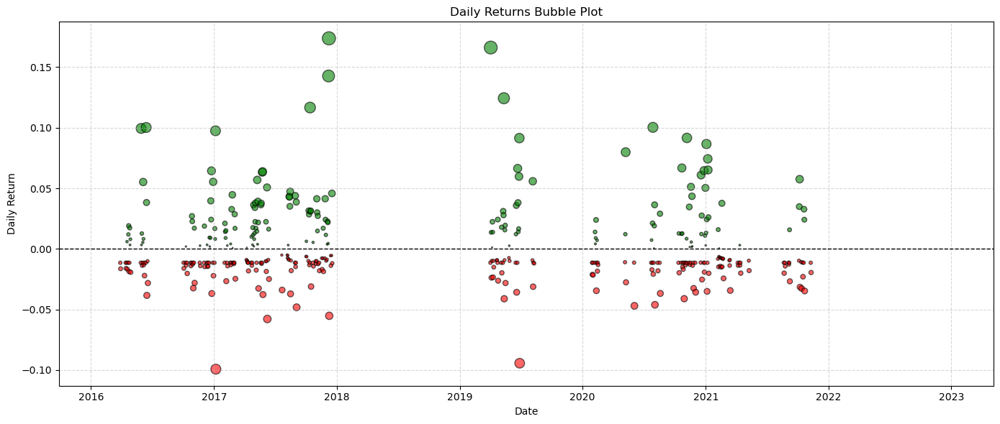

In [127]:
plot_daily_returns_bubble(df_orig, return_col='portfolio_daily_pct_returns')

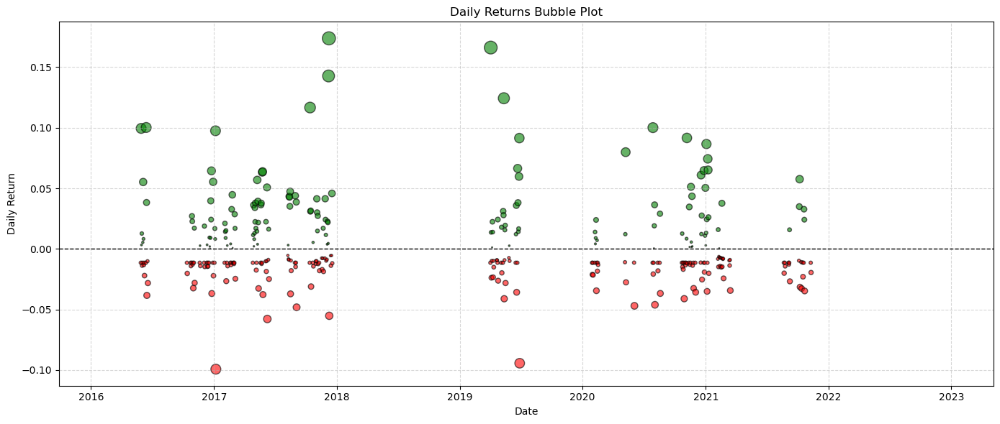

In [285]:
plot_daily_returns_bubble(df, return_col='portfolio_daily_pct_returns')

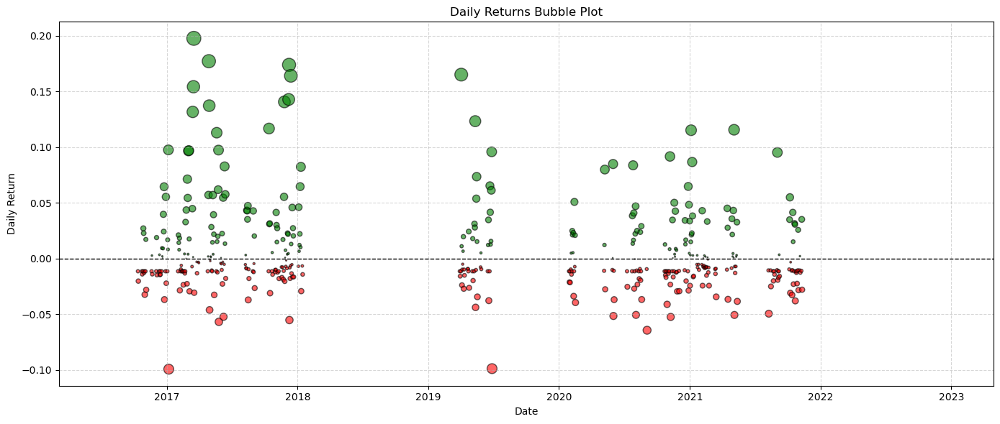

In [299]:
plot_daily_returns_bubble(df, return_col='portfolio_daily_pct_returns')

In [371]:
# Rank the returns and divide into quantiles using pd.cut
df['rank'] = df['portfolio_daily_pct_returns'].rank(method='first')
df['quantile'] = pd.cut(df['rank'], bins=5, labels=False)

In [375]:
df.groupby(['quantile']).agg({'portfolio_daily_pct_returns': ['median','mean']})

portfolio_daily_pct_returns          
                              median      mean
quantile                                      
0                                0.0 -0.006745
1                                0.0  0.000000
2                                0.0  0.000000
3                                0.0  0.000000
4                                0.0  0.009394

In [357]:
df.groupby(['daily_returns_quintile']).size()

daily_returns_quintile
(-0.1003, 0.0]    2378
(0.0, 0.174]       148
dtype: int64

In [359]:
def analyze_quantile_performance(df, return_col='portfolio_daily_pct_returns', quantiles=5):
    # Drop NaNs and copy to avoid modifying original
    df = df.dropna(subset=[return_col]).copy()

    # Rank the returns and divide into quantiles using pd.cut
    df['rank'] = df[return_col].rank(method='first')
    df['quantile'] = pd.cut(df['rank'], bins=quantiles, labels=False)

    # Group by quantile and calculate cumulative returns
    cumrets_by_quantile = (
        df.groupby('quantile')[return_col]
        .apply(lambda x: (1 + x).cumprod() - 1)
        .unstack()
        .T
    )

    # Plot cumulative returns for each quantile
    cumrets_by_quantile.plot(figsize=(12, 6), cmap='viridis')
    plt.title(f'Cumulative Returns by Quantile (n={quantiles})')
    plt.xlabel('Date')
    plt.ylabel('Cumulative Return')
    plt.legend(title='Quantile')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return cumrets_by_quantile

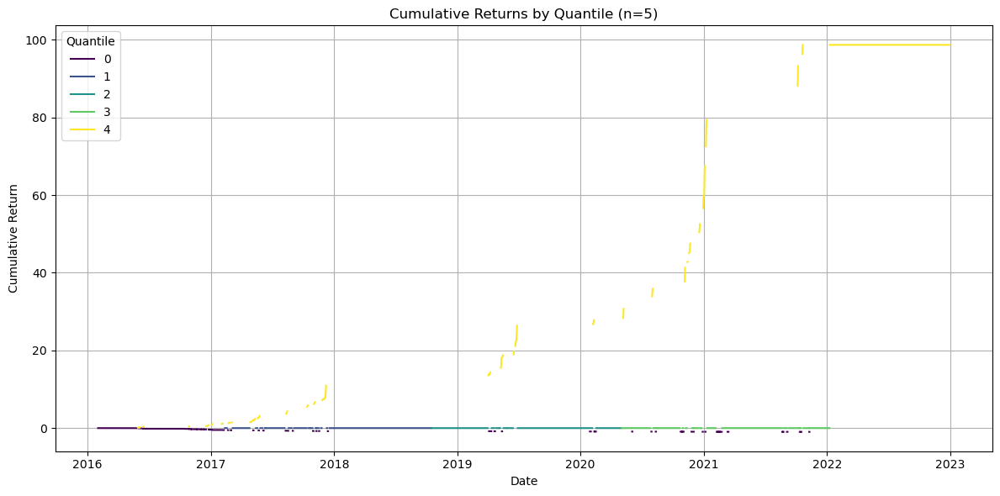

In [363]:
cum_returns = analyze_quantile_performance(df, return_col='portfolio_daily_pct_returns', quantiles=5)

In [365]:
cum_returns

quantile,0,1,2,3,4
date,,,,,
2016-02-01,0.000000,NaN,NaN,NaN,NaN
2016-02-02,0.000000,NaN,NaN,NaN,NaN
2016-02-03,0.000000,NaN,NaN,NaN,NaN
2016-02-04,0.000000,NaN,NaN,NaN,NaN
2016-02-05,0.000000,NaN,NaN,NaN,NaN
2016-02-06,0.000000,NaN,NaN,NaN,NaN
2016-02-07,0.000000,NaN,NaN,NaN,NaN
2016-02-08,0.000000,NaN,NaN,NaN,NaN
2016-02-09,0.000000,NaN,NaN,NaN,NaN


In [337]:
df.head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,equity_curve,equity_curve_cum_max,drawdown,drawdown_pct,End,Start,equity_curve_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,357.53,449.19,0,0.0,0.0,0.0,0.0,1.076237,371.33,0,367.89,0.0,0.0,0.0,367.95,-0.027770,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2016-02-01,1,117 days,False
2016-02-02,357.53,434.01,0,0.0,0.0,0.0,0.0,1.072386,372.93,No Event,371.33,0.0,0.0,0.0,371.33,0.009186,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2016-02-02,1,117 days,False
2016-02-03,357.53,432.77,0,0.0,0.0,0.0,0.0,1.073254,368.87,No Event,372.93,0.0,0.0,0.0,372.93,0.004309,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2016-02-03,1,117 days,False
2016-02-04,357.53,430.03,0,0.0,0.0,0.0,0.0,1.073469,387.99,No Event,368.87,0.0,0.0,0.0,368.87,-0.010887,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2016-02-04,1,117 days,False
2016-02-05,357.53,418.54,0,0.0,0.0,0.0,0.0,0.814133,384.50,No Event,387.99,0.0,0.0,0.0,387.99,0.051834,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,2016-02-05,1,117 days,False


In [257]:
perf_cols = ['ma_crossover_signal_weight', 'donchian_signal_weight', 'final_weighted_additive_signal_threshold','fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio',
             'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_ma_crossover_donchian_channel_weight = pd.DataFrame(columns=perf_cols)
final_weighted_additive_signal_threshold = 0.1
donchian_signal_weight = 0.4

for i in np.arange(0, 1.1, 0.1):
    for j in np.arange(0, 1.1, 0.1):
        if (i+j == 1):
            print(i,j)
            ma_crossover_signal_weight = i
            donchian_signal_weight = j
            df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                                        final_weighted_additive_signal_threshold, 
                                                                        final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                                        donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                        macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                                        volatility_window, transaction_cost_est, passive_trade_rate,
                                                                        use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                        annual_trading_days, use_specific_start_date, signal_start_date)
            performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                        strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                        passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
            row = {'ma_crossover_signal_weight': ma_crossover_signal_weight,
                   'donchian_signal_weight': donchian_signal_weight,
                   'final_weighted_additive_signal_threshold': final_weighted_additive_signal_threshold,
                   'ticker': ticker,
                   'fast_mavg': fast_mavg,
                   'slow_mavg': slow_mavg,
                   'stepsize': mavg_stepsize,
                   'annualized_return': performance_metrics['annualized_return'],
                   'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
                   'calmar_ratio': performance_metrics['calmar_ratio'],
                   'annualized_std_dev': performance_metrics['annualized_std_dev'],
                   'max_drawdown': performance_metrics['max_drawdown'],
                   'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
                   'hit_rate': performance_metrics['hit_rate'],
                   't_statistic': performance_metrics['t_statistic'],
                   'p_value': performance_metrics['p_value'],
                   'trade_count': performance_metrics['trade_count']
                  }
            df_ma_crossover_donchian_channel_weight = pd.concat([df_ma_crossover_donchian_channel_weight, pd.DataFrame([row])], ignore_index=True)

0.0 1.0
0.1 0.9
0.2 0.8
0.30000000000000004 0.7000000000000001
0.4 0.6000000000000001
0.5 0.5
0.6000000000000001 0.4
0.7000000000000001 0.30000000000000004
0.8 0.2
0.9 0.1
1.0 0.0


In [259]:
df_ma_crossover_donchian_channel_weight

,ma_crossover_signal_weight,donchian_signal_weight,final_weighted_additive_signal_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.0,1.0,0.1,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
1,0.1,0.9,0.1,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
2,0.2,0.8,0.1,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
3,0.3,0.7,0.1,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
4,0.4,0.6,0.1,35,60,6,0.151186,0.495479,0.437941,0.599910,-0.345220,721 days,0.064133,1.831135,0.067198,278.0,BTC-USD
5,0.5,0.5,0.1,35,60,6,0.156424,0.515489,0.455014,0.601858,-0.343778,721 days,0.063341,1.886313,0.059367,272.0,BTC-USD
6,0.6,0.4,0.1,35,60,6,0.162893,0.538880,0.492740,0.603753,-0.330587,721 days,0.062945,1.948450,0.051472,269.0,BTC-USD
7,0.7,0.3,0.1,35,60,6,0.170795,0.568709,0.516643,0.612500,-0.330587,721 days,0.060570,2.029890,0.042472,259.0,BTC-USD
8,0.8,0.2,0.1,35,60,6,0.179477,0.603403,0.616107,0.617957,-0.291308,721 days,0.058591,2.126935,0.033522,247.0,BTC-USD
9,0.9,0.1,0.1,35,60,6,0.166256,0.560621,0.469547,0.613153,-0.354078,721 days,0.057403,2.021870,0.043295,243.0,BTC-USD


In [273]:
perf_cols = ['ma_crossover_signal_weight', 'donchian_signal_weight', 'final_weighted_additive_signal_threshold','fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio',
             'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_final_weighted_additive_signal_threshold = pd.DataFrame(columns=perf_cols)
ma_crossover_signal_weight = 0.84
donchian_signal_weight = 0.2

for i in np.arange(0, 1.1, 0.1):
    print(i)
    final_weighted_additive_signal_threshold = i
    df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                                final_weighted_additive_signal_threshold, final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                                donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                                volatility_window, transaction_cost_est, passive_trade_rate, use_coinbase_data, rolling_sharpe_window,
                                                                cash_buffer_percentage, annualized_target_volatility, annual_trading_days, use_specific_start_date, signal_start_date)
    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    row = {'ma_crossover_signal_weight': ma_crossover_signal_weight,
           'donchian_signal_weight': donchian_signal_weight,
           'final_weighted_additive_signal_threshold': final_weighted_additive_signal_threshold,
           'ticker': ticker,
           'fast_mavg': fast_mavg,
           'slow_mavg': slow_mavg,
           'stepsize': mavg_stepsize,
           'annualized_return': performance_metrics['annualized_return'],
           'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
           'calmar_ratio': performance_metrics['calmar_ratio'],
           'annualized_std_dev': performance_metrics['annualized_std_dev'],
           'max_drawdown': performance_metrics['max_drawdown'],
           'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
           'hit_rate': performance_metrics['hit_rate'],
           't_statistic': performance_metrics['t_statistic'],
           'p_value': performance_metrics['p_value'],
           'trade_count': performance_metrics['trade_count']
          }
    df_final_weighted_additive_signal_threshold = pd.concat([df_final_weighted_additive_signal_threshold, pd.DataFrame([row])], ignore_index=True)

0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0


In [274]:
df_final_weighted_additive_signal_threshold

,ma_crossover_signal_weight,donchian_signal_weight,final_weighted_additive_signal_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.84,0.2,0.0,35,60,6,0.171247,0.573099,0.554171,0.615047,-0.309015,721 days,0.058987,2.045844,0.040875,252.0,BTC-USD
1,0.84,0.2,0.1,35,60,6,0.179477,0.603403,0.616107,0.617957,-0.291308,721 days,0.058591,2.126935,0.033522,247.0,BTC-USD
2,0.84,0.2,0.2,35,60,6,0.160427,0.540801,0.550713,0.609436,-0.291308,721 days,0.057403,1.972303,0.048684,243.0,BTC-USD
3,0.84,0.2,0.3,35,60,6,0.139218,0.465616,0.395703,0.603439,-0.351826,721 days,0.056611,1.783180,0.074677,240.0,BTC-USD
4,0.84,0.2,0.4,35,60,6,0.135725,0.452245,0.392897,0.606777,-0.345447,721 days,0.055028,1.747985,0.080588,237.0,BTC-USD
5,0.84,0.2,0.5,35,60,6,0.137311,0.459791,0.404972,0.612530,-0.339064,721 days,0.053444,1.771382,0.076618,229.0,BTC-USD
6,0.84,0.2,0.6,35,60,6,0.119788,0.392380,0.353290,0.618610,-0.339064,721 days,0.051465,1.595974,0.110620,224.0,BTC-USD
7,0.84,0.2,0.7,35,60,6,0.110052,0.354233,0.317979,0.622618,-0.346097,721 days,0.050277,1.496602,0.134622,221.0,BTC-USD
8,0.84,0.2,0.8,35,60,6,0.089950,0.275196,0.226984,0.620225,-0.396282,1283 days,0.048298,1.302644,0.192815,213.0,BTC-USD
9,0.84,0.2,0.9,35,60,6,0.102829,0.328817,0.285677,0.625190,-0.359947,721 days,0.047506,1.447330,0.147929,208.0,BTC-USD


In [267]:
df_final_weighted_additive_signal_threshold

,ma_crossover_signal_weight,donchian_signal_weight,final_weighted_additive_signal_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.2,0.8,0.0,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
1,0.2,0.8,0.1,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
2,0.2,0.8,0.2,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
3,0.2,0.8,0.3,35,60,6,0.146305,0.477863,0.402815,0.597661,-0.363205,721 days,0.064529,1.784478,0.074466,281.0,BTC-USD
4,0.2,0.8,0.4,35,60,6,0.146396,0.478194,0.403067,0.598527,-0.363205,721 days,0.064529,1.785356,0.074324,280.0,BTC-USD
5,0.2,0.8,0.5,35,60,6,0.146562,0.478801,0.403524,0.599429,-0.363205,721 days,0.064133,1.786976,0.074061,279.0,BTC-USD
6,0.2,0.8,0.6,35,60,6,0.153000,0.503187,0.445054,0.602320,-0.343778,721 days,0.062945,1.853853,0.063877,272.0,BTC-USD
7,0.2,0.8,0.7,35,60,6,0.089816,0.271678,0.275102,0.602987,-0.326484,721 days,0.056611,1.260843,0.207482,257.0,BTC-USD
8,0.2,0.8,0.8,35,60,6,0.061932,0.160410,0.194846,0.625168,-0.317852,721 days,0.049089,0.976014,0.329151,233.0,BTC-USD
9,0.2,0.8,0.9,35,60,6,0.022952,-0.010415,0.052147,0.631275,-0.440136,1329 days,0.043943,0.550289,0.582170,211.0,BTC-USD


In [138]:
perf_cols = ['ma_crossover_signal_weight', 'donchian_signal_weight', 'final_weighted_additive_signal_threshold','fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio',
             'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration', 'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_final_weighted_additive_signal_threshold = pd.DataFrame(columns=perf_cols)
ma_crossover_signal_weight = 0.6
donchian_signal_weight = 0.4

for i in np.arange(0, 1, 0.1):
    print(i)
    final_weighted_additive_signal_threshold = i
    df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                                final_weighted_additive_signal_threshold, final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                                donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                                volatility_window, transaction_cost_est, passive_trade_rate, use_coinbase_data, rolling_sharpe_window,
                                                                cash_buffer_percentage, annualized_target_volatility, annual_trading_days, use_specific_start_date, signal_start_date)
    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    row = {'ma_crossover_signal_weight': ma_crossover_signal_weight,
           'donchian_signal_weight': donchian_signal_weight,
           'final_weighted_additive_signal_threshold': final_weighted_additive_signal_threshold,
           'ticker': ticker,
           'fast_mavg': fast_mavg,
           'slow_mavg': slow_mavg,
           'stepsize': mavg_stepsize,
           'annualized_return': performance_metrics['annualized_return'],
           'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
           'calmar_ratio': performance_metrics['calmar_ratio'],
           'annualized_std_dev': performance_metrics['annualized_std_dev'],
           'max_drawdown': performance_metrics['max_drawdown'],
           'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
           'hit_rate': performance_metrics['hit_rate'],
           't_statistic': performance_metrics['t_statistic'],
           'p_value': performance_metrics['p_value'],
           'trade_count': performance_metrics['trade_count']
          }
    df_final_weighted_additive_signal_threshold = pd.concat([df_final_weighted_additive_signal_threshold, pd.DataFrame([row])], ignore_index=True)

0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9


In [140]:
df_final_weighted_additive_signal_threshold

,ma_crossover_signal_weight,donchian_signal_weight,final_weighted_additive_signal_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.6,0.4,0.0,35,60,6,0.024884,-0.242297,0.010677,0.480604,-2.330707,1544 days,0.013460,0.866620,0.386233,59.0,BTC-USD
1,0.6,0.4,0.1,35,60,6,0.097017,0.376741,0.029867,0.596002,-3.248273,615 days,0.015835,1.899557,0.057605,66.0,BTC-USD
2,0.6,0.4,0.2,35,60,6,0.045794,0.024081,0.015835,0.501600,-2.891992,534 days,0.013460,1.123657,0.261266,61.0,BTC-USD
3,0.6,0.4,0.3,35,60,6,-0.010617,-0.552019,-0.003636,0.336133,-2.920018,1903 days,0.015835,-0.156682,0.875508,72.0,BTC-USD
4,0.6,0.4,0.4,35,60,6,0.097741,0.331831,0.061045,0.436234,-1.601142,1036 days,0.019002,1.599070,0.109930,82.0,BTC-USD
5,0.6,0.4,0.5,35,60,6,0.062631,0.152550,0.066032,0.455430,-0.948503,856 days,0.019794,1.323043,0.185941,77.0,BTC-USD
6,0.6,0.4,0.6,35,60,6,0.018137,-0.245503,0.019122,0.506777,-0.948503,1513 days,0.015044,0.587899,0.556653,69.0,BTC-USD
7,0.6,0.4,0.7,35,60,6,0.031418,-0.099867,0.033124,0.432337,-0.948503,1487 days,0.015439,0.851676,0.394475,67.0,BTC-USD
8,0.6,0.4,0.8,35,60,6,0.007048,-0.423404,0.007431,0.465873,-0.948503,1620 days,0.014648,0.321664,0.747734,64.0,BTC-USD
9,0.6,0.4,0.9,35,60,6,-0.030231,-0.636384,-0.011731,0.523118,-2.577093,1283 days,0.013856,-0.553692,0.579839,68.0,BTC-USD


In [146]:
df_ma_crossover_donchian_channel_weight

,ma_crossover_signal_weight,donchian_signal_weight,final_weighted_additive_signal_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.1,0.9,0.1,35,60,6,-0.008118,-0.354719,-0.003753,0.363974,-2.162990,2019 days,0.030087,0.014210,0.988664,140.0,BTC-USD
1,0.2,0.8,0.1,35,60,6,0.028636,-0.054255,0.005944,0.332088,-4.818010,2227 days,0.030087,0.670641,0.502511,144.0,BTC-USD
2,0.3,0.7,0.1,35,60,6,0.061899,0.147775,0.011968,0.343914,-5.171932,1106 days,0.030087,1.088042,0.276680,140.0,BTC-USD
3,0.4,0.6,0.1,35,60,6,0.091632,0.289112,0.013644,0.394836,-6.715780,773 days,0.022565,1.423478,0.154721,108.0,BTC-USD
4,0.5,0.5,0.1,35,60,6,0.056046,0.105004,0.016824,0.442845,-3.331230,374 days,0.019794,1.335751,0.181751,82.0,BTC-USD
5,0.6,0.4,0.1,35,60,6,0.097017,0.376741,0.029867,0.596002,-3.248273,615 days,0.015835,1.899557,0.057605,66.0,BTC-USD
6,0.7,0.3,0.1,35,60,6,0.028641,-0.165147,0.011855,0.570492,-2.415937,1020 days,0.011481,0.889489,0.373825,50.0,BTC-USD
7,0.8,0.2,0.1,35,60,6,-0.012328,-0.792064,-0.007133,0.486345,-1.728264,1903 days,0.008314,-0.346616,0.728909,39.0,BTC-USD
8,0.9,0.1,0.1,35,60,6,-0.002646,-0.677944,-0.001531,0.384945,-1.728264,1903 days,0.009501,-0.001601,0.998722,40.0,BTC-USD


In [53]:
perf_cols = ['mavg_z_score_threshold', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
            'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_mavg_z_score_performance = pd.DataFrame(columns=perf_cols)

for i in np.arange(-5, 3, 0.5):
    print(i)
    mavg_z_score_threshold = i
    df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                                final_weighted_additive_signal_threshold, final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                                donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                                volatility_window, transaction_cost_est, passive_trade_rate, use_coinbase_data, rolling_sharpe_window,
                                                                cash_buffer_percentage, annualized_target_volatility, annual_trading_days, use_specific_start_date, signal_start_date)
    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    row = {'mavg_z_score_threshold': mavg_z_score_threshold,
           'ticker': ticker,
           'fast_mavg': fast_mavg,
           'slow_mavg': slow_mavg,
           'stepsize': mavg_stepsize,
           'annualized_return': performance_metrics['annualized_return'],
           'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
           'calmar_ratio': performance_metrics['calmar_ratio'],
           'annualized_std_dev': performance_metrics['annualized_std_dev'],
           'max_drawdown': performance_metrics['max_drawdown'],
           'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
           'hit_rate': performance_metrics['hit_rate'],
           't_statistic': performance_metrics['t_statistic'],
           'p_value': performance_metrics['p_value'],
           'trade_count': performance_metrics['trade_count']
          }
    df_mavg_z_score_performance = pd.concat([df_mavg_z_score_performance, pd.DataFrame([row])], ignore_index=True)

-5.0
-4.5
-4.0
-3.5
-3.0
-2.5
-2.0
-1.5
-1.0
-0.5
0.0
0.5
1.0
1.5
2.0
2.5


In [55]:
df_mavg_z_score_performance

,mavg_z_score_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,-5.0,35,60,6,0.008856,-0.492166,0.004953,0.891682,-1.787963,1075 days,0.003167,0.398120,0.690576,16.0,BTC-USD
1,-4.5,35,60,6,0.008856,-0.492166,0.004953,0.891682,-1.787963,1075 days,0.003167,0.398120,0.690576,16.0,BTC-USD
2,-4.0,35,60,6,0.008856,-0.492166,0.004953,0.891682,-1.787963,1075 days,0.003167,0.398120,0.690576,16.0,BTC-USD
3,-3.5,35,60,6,0.008856,-0.492166,0.004953,0.891682,-1.787963,1075 days,0.003167,0.398120,0.690576,16.0,BTC-USD
4,-3.0,35,60,6,0.008856,-0.492166,0.004953,0.891682,-1.787963,1075 days,0.003167,0.398120,0.690576,16.0,BTC-USD
5,-2.5,35,60,6,0.005976,-0.528383,0.003343,0.871175,-1.787963,1075 days,0.003167,0.298705,0.765190,17.0,BTC-USD
6,-2.0,35,60,6,0.008856,-0.492166,0.004953,0.891682,-1.787963,1075 days,0.003167,0.398120,0.690576,16.0,BTC-USD
7,-1.5,35,60,6,0.005555,-0.533138,0.002260,0.846278,-2.458327,1075 days,0.003563,0.284097,0.776360,18.0,BTC-USD
8,-1.0,35,60,6,-0.001166,-0.605998,-0.000493,0.829142,-2.363588,1367 days,0.003563,0.055664,0.955614,19.0,BTC-USD
9,-0.5,35,60,6,0.013688,-0.400813,0.004265,0.820563,-3.209614,1075 days,0.003959,0.543312,0.586963,21.0,BTC-USD


In [81]:
perf_cols = ['donchian_threshold', 'fast_mavg', 'slow_mavg', 'stepsize', 'annualized_return', 'sharpe_ratio', 'calmar_ratio', 'annualized_std_dev', 'max_drawdown', 'max_drawdown_duration',
             'hit_rate', 't_statistic', 'p_value', 'trade_count']
df_donchian_performance = pd.DataFrame(columns=perf_cols)

for i in np.arange(0, 2, 0.1):
    print(i)
    donchian_threshold = i
    df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold,
                                                                final_weighted_additive_signal_threshold, final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                                donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                                volatility_window, transaction_cost_est, passive_trade_rate, use_coinbase_data, rolling_sharpe_window,
                                                                cash_buffer_percentage, annualized_target_volatility, annual_trading_days, use_specific_start_date, signal_start_date)
    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    row = {'donchian_threshold': donchian_threshold,
           'ticker': ticker,
           'fast_mavg': fast_mavg,
           'slow_mavg': slow_mavg,
           'stepsize': mavg_stepsize,
           'annualized_return': performance_metrics['annualized_return'],
           'sharpe_ratio': performance_metrics['annualized_sharpe_ratio'],
           'calmar_ratio': performance_metrics['calmar_ratio'],
           'annualized_std_dev': performance_metrics['annualized_std_dev'],
           'max_drawdown': performance_metrics['max_drawdown'],
           'max_drawdown_duration': performance_metrics['max_drawdown_duration'],
           'hit_rate': performance_metrics['hit_rate'],
           't_statistic': performance_metrics['t_statistic'],
           'p_value': performance_metrics['p_value'],
           'trade_count': performance_metrics['trade_count']
          }
    df_donchian_performance = pd.concat([df_donchian_performance, pd.DataFrame([row])], ignore_index=True)

0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
1.1
1.2000000000000002
1.3
1.4000000000000001
1.5
1.6
1.7000000000000002
1.8
1.9000000000000001


In [83]:
df_donchian_performance

,donchian_threshold,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count,ticker
0,0.0,35,60,6,0.007343,-0.233411,0.001459,0.280110,-5.033991,1628 days,0.032067,0.316496,0.751653,144.0,BTC-USD
1,0.1,35,60,6,-0.063301,-0.806735,-0.011118,0.372007,-5.693288,2356 days,0.035629,-1.143091,0.253109,162.0,BTC-USD
2,0.2,35,60,6,-0.100537,-1.155991,-inf,0.370848,0.000000,2525 days,0.037213,-2.030202,0.042441,171.0,BTC-USD
3,0.3,35,60,6,-0.137710,-1.462166,-inf,0.369480,0.000000,2525 days,0.042359,-2.851993,0.004380,210.0,BTC-USD
4,0.4,35,60,6,0.012211,-0.112727,0.000053,0.474353,-231.798801,706 days,0.065321,0.405890,0.684858,307.0,BTC-USD
5,0.5,35,60,6,0.347640,1.169668,0.170878,0.541815,-2.034440,721 days,0.089074,3.620560,0.000300,405.0,BTC-USD
6,0.6,35,60,6,0.025911,-0.042104,0.008096,0.596312,-3.200690,1088 days,0.033254,0.598156,0.549789,210.0,BTC-USD
7,0.7,35,60,6,-0.070007,-0.903089,-inf,0.528453,0.000000,2525 days,0.017419,-1.356919,0.174928,125.0,BTC-USD
8,0.8,35,60,6,-0.074324,-1.359999,-inf,0.513133,0.000000,2525 days,0.007126,-2.149078,0.031723,65.0,BTC-USD
9,0.9,35,60,6,-0.047137,-1.368429,-inf,0.531485,0.000000,2525 days,0.003959,-1.747569,0.080660,34.0,BTC-USD


<Axes: xlabel='date'>

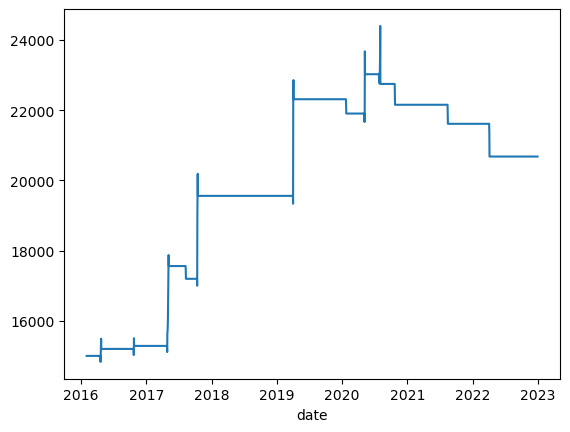

In [497]:
df['total_portfolio_value'].plot()

In [32]:
df_trend.head()

,BTC-USD_close,BTC-USD_open,BTC-USD_pct_returns,BTC-USD_35_mavg,BTC-USD_35_mavg_slope,BTC-USD_40_mavg,BTC-USD_40_mavg_slope,BTC-USD_45_mavg,BTC-USD_45_mavg_slope,BTC-USD_50_mavg,BTC-USD_50_mavg_slope,BTC-USD_55_mavg,BTC-USD_55_mavg_slope,BTC-USD_60_mavg,BTC-USD_60_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_trend_signal,BTC-USD_trend_strategy_returns_35_6_60,BTC-USD_trend_strategy_trades_35_6_60,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,BTC-USD_ribbon_thickness_mod,BTC-USD_ribbon_thickness_mod2,BTC-USD_ribbon_thickness_mod_mean,BTC-USD_ribbon_thickness_mod_std,BTC-USD_ribbon_thickness_mod_zscore,BTC-USD_ribbon_thickness_mod2_mean,BTC-USD_ribbon_thickness_mod2_std,BTC-USD_ribbon_thickness_mod2_zscore,BTC-USD_ribbon_thickness_mod_signal,BTC-USD_ribbon_thickness_mod2_signal,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_middle_band_price_t_2,BTC-USD_20_donchian_signal,BTC-USD_t_1_close,BTC-USD_200d_mavg_macro_simple,BTC-USD_200d_mavg_macro_exp,BTC-USD_100d_mavg_macro_simple,BTC-USD_100d_mavg_macro_exp,BTC-USD_simple_macro_200d_signal,BTC-USD_exp_macro_200d_signal,BTC-USD_simple_macro_100d_signal,BTC-USD_exp_macro_100d_signal,BTC-USD_final_weighted_signal,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_35_6_60_mavg_crossover_20_donchian_strategy_returns,BTC-USD_35_6_60_mavg_crossover_20_donchian_strategy_trades
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11,449.19,449.99,-0.001778,443.474492,0.781449,443.315818,0.765582,443.191869,0.753187,443.092417,0.743242,443.010877,0.735088,442.942824,0.728282,0.506441,1.0,-0.001778,0.0,0.0,-0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0.2,-1,0.001778,NaN
2016-01-12,434.01,449.26,-0.033794,442.415178,0.688889,442.309867,0.678312,442.226203,0.669909,442.158208,0.663081,442.101896,0.657426,442.054515,0.652668,0.531669,1.0,-0.033794,0.0,1.0,-0.033794,1.0,0.001184,0.000300,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,449.19,NaN,449.190000,NaN,449.190000,0,0,0,0,0.2,-1,0.033794,0.0
2016-01-13,432.77,434.01,-0.002857,441.393247,0.714191,441.336363,0.707596,441.289473,0.702204,441.250326,0.697727,441.217231,0.693958,441.188931,0.690746,0.360663,1.0,-0.002857,0.0,1.0,-0.002857,0.0,0.000831,0.000176,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,434.01,NaN,441.562050,NaN,441.524100,0,-1,0,-1,0.0,-1,0.002857,0.0
2016-01-14,430.03,432.70,-0.006331,440.247046,0.610480,440.240943,0.609096,440.232842,0.607683,440.224257,0.606340,440.215848,0.605101,440.207892,0.603974,0.204316,1.0,-0.006331,0.0,1.0,-0.006331,0.0,0.000472,0.000035,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,432.77,NaN,438.602011,NaN,438.547513,0,-1,0,-1,0.0,-1,0.006331,0.0
2016-01-15,357.53,430.04,-0.168593,432.265142,-0.169781,432.595264,-0.137612,432.843845,-0.113415,433.037466,-0.094583,433.192373,-0.079528,433.319027,-0.067227,0.039154,1.0,-0.168593,0.0,1.0,-0.168593,0.0,0.000091,0.000916,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,430.03,NaN,436.426757,NaN,436.353832,0,-1,0,-1,0.0,-1,0.168593,0.0


In [87]:
np.linspace(slow_mavg, fast_mavg, mavg_stepsize)

array([60., 55., 50., 45., 40., 35.])

In [101]:
from scipy.stats import linregress

def calc_ribbon_slope(row, ticker, fast_mavg, slow_mavg, mavg_stepsize):
    x = np.linspace(slow_mavg, fast_mavg, mavg_stepsize)
    y = row.values
    slope, _, _, _, _ = linregress(x, y)
    return slope

mavg_cols = [f'{ticker}_{int(mavg)}_mavg' for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize)]

df_trend[f'{ticker}_mavg_ribbon_slope'] = df_trend[mavg_cols].apply(
    calc_ribbon_slope, 
    axis=1, 
    args=(ticker, fast_mavg, slow_mavg, mavg_stepsize)
)
df_trend[f'{ticker}_mavg_ribbon_z_score'] = (df_trend[f'{ticker}_mavg_ribbon_slope'] - df_trend[f'{ticker}_mavg_ribbon_slope'].rolling(window=100).mean())/df_trend[f'{ticker}_mavg_ribbon_slope'].rolling(window=100).std()

<Axes: xlabel='date'>

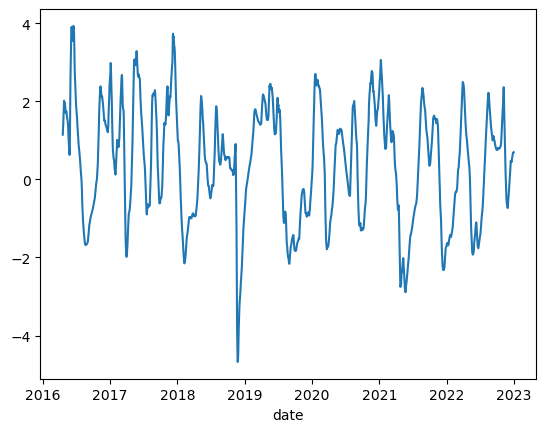

In [103]:
df_trend[f'{ticker}_mavg_ribbon_z_score'].plot()

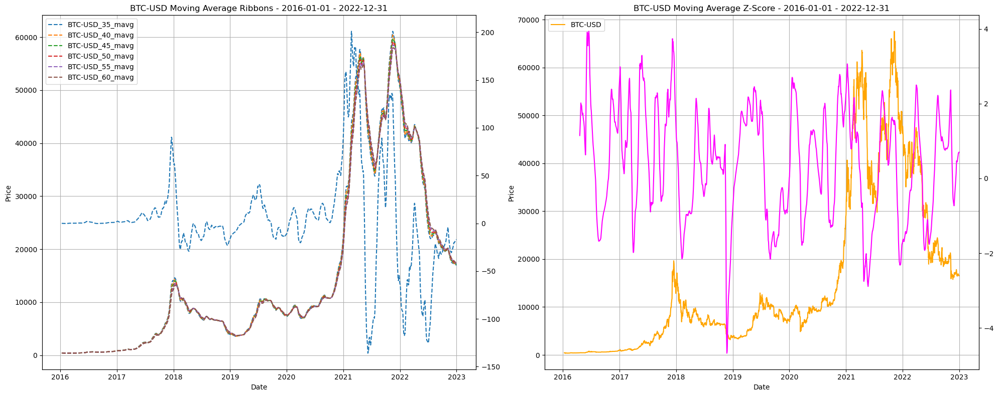

In [117]:
fig = plt.figure(figsize=(20,8))
layout = (1,2)
trend_ax = plt.subplot2grid(layout, (0,0))
trend_slope_ax = plt.subplot2grid(layout, (0,1))

for mavg in mavg_cols:
    _ = trend_ax.plot(df_trend.index, df_trend[mavg], label=mavg, linestyle='--')

trend_ax2 = trend_ax.twinx()
_ = trend_ax2.plot(df_trend.index, df_trend[f'{ticker}_mavg_ribbon_slope'], label='Ribbon Slope', linestyle='--')

trend_slope_ax2 = trend_slope_ax.twinx()
_ = trend_slope_ax.plot(df_trend.index, df_trend[f'{ticker}_close'], label=ticker, linestyle='-', color='orange')
_ = trend_slope_ax2.plot(df_trend.index, df_trend[f'{ticker}_mavg_ribbon_z_score'], label='Ribbon Slope Z-Score', linestyle='-', color='magenta')

_ = trend_ax.set_title(f'{ticker} Moving Average Ribbons - {start_date} - {end_date}')
_ = trend_ax.set_ylabel('Price')
_ = trend_ax.set_xlabel('Date')
_ = trend_ax.legend(loc='upper left')
_ = trend_ax.grid()

_ = trend_slope_ax.set_title(f'{ticker} Moving Average Z-Score - {start_date} - {end_date}')
_ = trend_slope_ax.set_ylabel('Price')
_ = trend_slope_ax.set_xlabel('Date')
_ = trend_slope_ax.legend(loc='upper left')
_ = trend_slope_ax.grid()

plt.tight_layout()

In [511]:
df_trend_portfolio = get_trend_donchian_signal_for_portfolio_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window, donchian_signal_weight,
                                                                   ma_crossover_signal_weight, ribbon_width_signal_weight, macro_signal_200d_weight, macro_signal_100d_weight,
                                                                   price_or_returns_calc=price_or_returns_calc, long_only=long_only, use_coinbase_data=True)

In [512]:
df_trend_portfolio.head()

,BTC-USD_close,BTC-USD_open,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_ribbon_thickness_mod2_signal,BTC-USD_final_weighted_signal,ETH-USD_close,ETH-USD_open,ETH-USD_35_6_60_mavg_crossover_20_donchian_signal,ETH-USD_20_donchian_upper_band_price_t_2,ETH-USD_20_donchian_lower_band_price_t_2,ETH-USD_ribbon_thickness_mod2_signal,ETH-USD_final_weighted_signal
date,,,,,,,,,,,,,,
2016-01-11,449.19,449.99,0,NaN,NaN,0,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-12,434.01,449.26,0,NaN,NaN,0,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-13,432.77,434.01,0,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-14,430.03,432.70,0,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-15,357.53,430.04,0,NaN,NaN,0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: xlabel='date'>

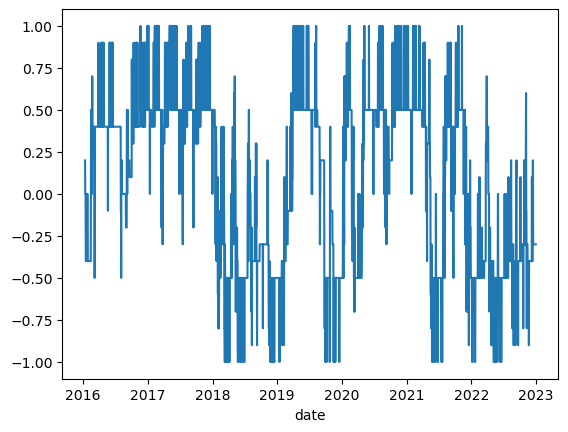

In [513]:
df_trend_portfolio['BTC-USD_final_weighted_signal'].plot()

In [494]:
df.head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,ETH-USD_20_donchian_lower_band_price_t_2,ETH-USD_20_donchian_upper_band_price_t_2,ETH-USD_35_6_60_mavg_crossover_20_donchian_signal,ETH-USD_actual_position_entry_price,ETH-USD_actual_position_exit_price,ETH-USD_actual_position_notional,ETH-USD_actual_size,ETH-USD_annualized_volatility_20,ETH-USD_close,ETH-USD_event,ETH-USD_open,ETH-USD_position_volatility_adjusted_weight,ETH-USD_short_sale_proceeds,ETH-USD_stop_loss,ETH-USD_t_1_close,ETH-USD_t_1_close_pct_returns,ETH-USD_target_notional,ETH-USD_target_size,ETH-USD_target_vol_normalized_weight,ETH-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-07-02,604.5,769.76,0,0.0,0.0,0.0,0.0,1.048549,704.95,0,678.09,0.0,0.0,0.0,678.19,0.006979,0.0,0.0,0.0,0.0,11.64,20.99,0.0,0.0,0.0,0.0,0.0,2.195075,12.09,0,12.28,0.0,0.0,0.0,12.34,-0.012010,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-07-02,1,179 days,False
2016-07-03,604.5,769.76,0,0.0,0.0,0.0,0.0,0.949507,663.55,No Event,705.25,0.0,0.0,0.0,704.95,0.039458,0.0,0.0,0.0,0.0,11.64,20.99,0.0,0.0,0.0,0.0,0.0,2.144808,12.02,No Event,12.16,0.0,0.0,0.0,12.09,-0.020259,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-07-03,1,179 days,False
2016-07-04,604.5,769.76,0,0.0,0.0,0.0,0.0,0.968061,681.98,No Event,664.09,0.0,0.0,0.0,663.55,-0.058728,0.0,0.0,0.0,0.0,11.64,20.99,0.0,0.0,0.0,0.0,0.0,2.029659,11.48,No Event,11.94,0.0,0.0,0.0,12.02,-0.005790,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-07-04,1,179 days,False
2016-07-05,604.5,769.76,0,0.0,0.0,0.0,0.0,0.967378,669.87,No Event,681.98,0.0,0.0,0.0,681.98,0.027775,0.0,0.0,0.0,0.0,11.64,20.99,0.0,0.0,0.0,0.0,0.0,2.012556,10.60,No Event,11.45,0.0,0.0,0.0,11.48,-0.044925,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-07-05,1,179 days,False
2016-07-06,604.5,769.76,0,0.0,0.0,0.0,0.0,0.966506,678.79,No Event,669.75,0.0,0.0,0.0,669.87,-0.017757,0.0,0.0,0.0,0.0,11.48,20.99,0.0,0.0,0.0,0.0,0.0,2.027812,10.61,No Event,10.60,0.0,0.0,0.0,10.60,-0.076655,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-07-06,1,179 days,False


In [396]:
# ticker_list = ['BTC-USD']
performance_metrics

{'annualized_return': -0.02898510981159752,
 'annualized_sharpe_ratio': -0.9432694225759116,
 'calmar_ratio': -0.0018736821550051222,
 'annualized_std_dev': 0.45147223926496366,
 'max_drawdown': -15.469598050112337,
 'max_drawdown_duration': Timedelta('450 days 00:00:00'),
 'hit_rate': 0.00998003992015968,
 't_statistic': -0.3871411848457737,
 'p_value': 0.6988164153984768,
 'trade_count': 14.0}

In [404]:
# ticker_list = ['BTC-USD','ETH-USD']
performance_metrics

{'annualized_return': 0.037476941827179866,
 'annualized_sharpe_ratio': -0.03189775920765597,
 'calmar_ratio': 0.022837259849232797,
 'annualized_std_dev': 0.5295000670089354,
 'max_drawdown': -1.6410437186683269,
 'max_drawdown_duration': Timedelta('436 days 00:00:00'),
 'hit_rate': 0.021956087824351298,
 't_statistic': 0.4087658114064141,
 'p_value': 0.6828865491921722,
 'trade_count': 33.0}

In [412]:
# ticker_list = ['BTC-USD','ETH-USD','SOL-USD']
performance_metrics

{'annualized_return': 0.12043033448268203,
 'annualized_sharpe_ratio': 0.6151175316920633,
 'calmar_ratio': 0.38101101615350386,
 'annualized_std_dev': 0.3943163517987241,
 'max_drawdown': -0.3160809776538387,
 'max_drawdown_duration': Timedelta('436 days 00:00:00'),
 'hit_rate': 0.03592814371257485,
 't_statistic': 1.2121083453671042,
 'p_value': 0.22604336415153553,
 'trade_count': 53.0}

In [421]:
# ticker_list = ['BTC-USD','ETH-USD','SOL-USD','DOGE-USD']
performance_metrics

{'annualized_return': 0.4050957365711392,
 'annualized_sharpe_ratio': 1.0689715015280914,
 'calmar_ratio': 1.2816201075370832,
 'annualized_std_dev': 1.0191899923007064,
 'max_drawdown': -0.3160809776538387,
 'max_drawdown_duration': Timedelta('373 days 00:00:00'),
 'hit_rate': 0.041916167664670656,
 't_statistic': 1.4362969547306796,
 'p_value': 0.1515432230033698,
 'trade_count': 59.0}

In [428]:
# ticker_list = ['BTC-USD','ETH-USD','SOL-USD','DOGE-USD','LTC-USD']
performance_metrics

{'annualized_return': 0.39735015923615835,
 'annualized_sharpe_ratio': 1.0414380725010512,
 'calmar_ratio': 1.2568551505839562,
 'annualized_std_dev': 0.9502211910228792,
 'max_drawdown': -0.31614634275997733,
 'max_drawdown_duration': Timedelta('373 days 00:00:00'),
 'hit_rate': 0.04590818363273453,
 't_statistic': 1.4016377074157043,
 'p_value': 0.16164389611016788,
 'trade_count': 75.0}

In [147]:
perf.calculate_sharpe_ratio(df, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions', include_transaction_costs_and_fees=False,
                           passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)

1.2098798289061523

In [149]:
def calculate_negative_sharpe(df, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions', include_transaction_costs_and_fees=False,
                              passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001):
    sharpe = perf.calculate_sharpe_ratio(df, strategy_daily_return_col='portfolio_daily_pct_returns', strategy_trade_count_col='count_of_positions', include_transaction_costs_and_fees=False,
                                         passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    return -sharpe

In [451]:
def optimize_weights(weights):

    final_weighted_additive_signal_threshold = 0.0
    final_weighted_multiplicative_signal_threshold = 0.0
    mavg_z_score_threshold = 2.5#weights[0]
    donchian_threshold = weights[0]#0.7
    donchian_signal_weight = 0.5
    ma_crossover_signal_weight = 0.3
    ribbon_width_signal_weight = 0.0
    macro_signal_200d_weight = 0.0
    macro_signal_100d_weight = 0.0
    start_date = pd.to_datetime('2016-01-01').date()
    end_date = pd.to_datetime('2022-12-31').date()
    ticker_list = ['BTC-USD']#,'ETH-USD']#,'SOL-USD','DOGE-USD','LTC-USD']
    fast_mavg = 35
    slow_mavg = 60
    mavg_stepsize = 6
    rolling_donchian_window = 20
    long_only = True
    use_coinbase_data = True
    volatility_window = 20
    annual_trading_days = 365
    rolling_cov_window = 20
    annualized_target_volatility = 0.70
    use_specific_start_date = False
    signal_start_date = None
    initial_capital = 15000
    cash_buffer_percentage = 0.10
    transaction_cost_est = 0.001#0.0025
    passive_trade_rate = 0.05
    rolling_sharpe_window = 50
    price_or_returns_calc = 'price'
    ticker = ticker_list[0]
    df = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, mavg_z_score_threshold, donchian_threshold, final_weighted_additive_signal_threshold, 
                                                                final_weighted_multiplicative_signal_threshold, rolling_donchian_window,
                                                                donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                macro_signal_200d_weight, macro_signal_100d_weight, long_only, initial_capital, rolling_cov_window, 
                                                                volatility_window, transaction_cost_est, passive_trade_rate,
                                                                use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                annual_trading_days, use_specific_start_date, signal_start_date)
    performance_metrics = calculate_risk_and_performance_metrics(df, strategy_daily_return_col=f'portfolio_daily_pct_returns',
                                                                strategy_trade_count_col=f'count_of_positions', include_transaction_costs_and_fees=False,
                                                                passive_trade_rate=0.05, annual_trading_days=365, transaction_cost_est=0.001)
    sharpe = -performance_metrics['annualized_sharpe_ratio']

    return sharpe

In [324]:
## Through 2022-12-31
optimize_weights(weights=[0.5, 0.5, 0.5])

-0.12209316789123403

In [255]:
## Through 2022-12-31
optimize_weights(weights=[0.5, 0.2, 0.1, 0.1, 0.1])

-1.4242789663861402

In [259]:
## Through 2023-12-31
optimize_weights(weights=[0.5, 0.2, 0.1, 0.1, 0.1])

-1.1278338655681694

In [263]:
## Through 2024-12-31
optimize_weights(weights=[0.5, 0.2, 0.1, 0.1, 0.1])

-1.0491793988309155

In [453]:
from scipy.optimize import minimize

# Initial weights (start with Donchian dominant)
mavg_z_score_init_weights = np.array([0.0]) 

# Constraints: weights sum to 1
mavg_z_score_constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})

# Bounds for each weight (Donchian dominant, Ribbon Width small)
mavg_z_score_bounds = [(0.0, 5.0)]

In [421]:
mavg_z_score_threshold_result = minimize(optimize_weights, init_weights, method='SLSQP', bounds=bounds, constraints=constraints)

In [423]:
mavg_z_score_threshold_result

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 0.30279055657174625
       x: [ 1.000e+00]
     nit: 2
     jac: [ 0.000e+00]
    nfev: 4
    njev: 2

In [455]:
from scipy.optimize import minimize

# Initial weights (start with Donchian dominant)
donchian_channel_init_weights = np.array([0.0]) 

# Constraints: weights sum to 1
donchian_channel_constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})

# Bounds for each weight (Donchian dominant, Ribbon Width small)
donchian_channel_bounds = [(0.0, 5.0)]

In [457]:
donchian_channel_threshold_result = minimize(optimize_weights, init_weights, method='SLSQP', bounds=bounds, constraints=constraints)

In [458]:
donchian_channel_threshold_result

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 1.0398614458077273
       x: [ 1.000e+00]
     nit: 2
     jac: [ 0.000e+00]
    nfev: 4
    njev: 2

In [269]:
result

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -0.025261471625112032
       x: [ 3.333e-01  3.333e-01  3.333e-01]
     nit: 1
     jac: [ 0.000e+00  0.000e+00  0.000e+00]
    nfev: 5
    njev: 1

In [265]:
weights=[1, 0, 0, 0, 0]
donchian_signal_weight = weights[0]
ma_crossover_signal_weight = weights[1]
ribbon_width_signal_weight = weights[2]
macro_signal_200d_weight = weights[3]
macro_signal_100d_weight = weights[4]

In [267]:
df_donchian_perf = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                                                          donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                          macro_signal_200d_weight, macro_signal_100d_weight, 
                                                                          long_only, initial_capital, rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                          use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                          annual_trading_days, use_specific_start_date, signal_start_date)

In [268]:
weights=[0, 1, 0, 0, 0]
donchian_signal_weight = weights[0]
ma_crossover_signal_weight = weights[1]
ribbon_width_signal_weight = weights[2]
macro_signal_200d_weight = weights[3]
macro_signal_100d_weight = weights[4]

In [271]:
df_mavg_crossover_perf = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                                                          donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                          macro_signal_200d_weight, macro_signal_100d_weight, 
                                                                          long_only, initial_capital, rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                          use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                          annual_trading_days, use_specific_start_date, signal_start_date)

In [272]:
weights=[0, 0, 1, 0, 0]
donchian_signal_weight = weights[0]
ma_crossover_signal_weight = weights[1]
ribbon_width_signal_weight = weights[2]
macro_signal_200d_weight = weights[3]
macro_signal_100d_weight = weights[4]

In [275]:
df_mavg_ribbon_width_perf = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                                                          donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                          macro_signal_200d_weight, macro_signal_100d_weight, 
                                                                          long_only, initial_capital, rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                          use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                          annual_trading_days, use_specific_start_date, signal_start_date)

In [277]:
weights=[0, 0, 0, 1, 0]
donchian_signal_weight = weights[0]
ma_crossover_signal_weight = weights[1]
ribbon_width_signal_weight = weights[2]
macro_signal_200d_weight = weights[3]
macro_signal_100d_weight = weights[4]

In [279]:
df_macro_signal_200d_perf = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                                                          donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                          macro_signal_200d_weight, macro_signal_100d_weight, 
                                                                          long_only, initial_capital, rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                          use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                          annual_trading_days, use_specific_start_date, signal_start_date)

In [280]:
weights=[0, 0, 0, 0, 1]
donchian_signal_weight = weights[0]
ma_crossover_signal_weight = weights[1]
ribbon_width_signal_weight = weights[2]
macro_signal_200d_weight = weights[3]
macro_signal_100d_weight = weights[4]

In [281]:
df_macro_signal_100d_perf = apply_target_volatility_position_sizing_strategy_macro(start_date, end_date, ticker_list, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window,
                                                                          donchian_signal_weight, ma_crossover_signal_weight, ribbon_width_signal_weight,
                                                                          macro_signal_200d_weight, macro_signal_100d_weight, 
                                                                          long_only, initial_capital, rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                          use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                          annual_trading_days, use_specific_start_date, signal_start_date)

In [285]:
df_returns = df_donchian_perf[['portfolio_daily_pct_returns']].rename(columns={'portfolio_daily_pct_returns': 'donchian_daily_returns'})
df_returns = (pd.merge(df_returns, df_mavg_crossover_perf['portfolio_daily_pct_returns'], left_index=True, right_index=True, how='left')
              .rename(columns={'portfolio_daily_pct_returns': 'mavg_crossover_daily_returns'}))
df_returns = (pd.merge(df_returns, df_mavg_ribbon_width_perf['portfolio_daily_pct_returns'], left_index=True, right_index=True, how='left')
              .rename(columns={'portfolio_daily_pct_returns': 'ribbon_width_daily_returns'}))
df_returns = (pd.merge(df_returns, df_macro_signal_200d_perf['portfolio_daily_pct_returns'], left_index=True, right_index=True, how='left')
              .rename(columns={'portfolio_daily_pct_returns': 'macro_signal_200d_daily_returns'}))
df_returns = (pd.merge(df_returns, df_macro_signal_100d_perf['portfolio_daily_pct_returns'], left_index=True, right_index=True, how='left')
              .rename(columns={'portfolio_daily_pct_returns': 'macro_signal_100d_daily_returns'}))

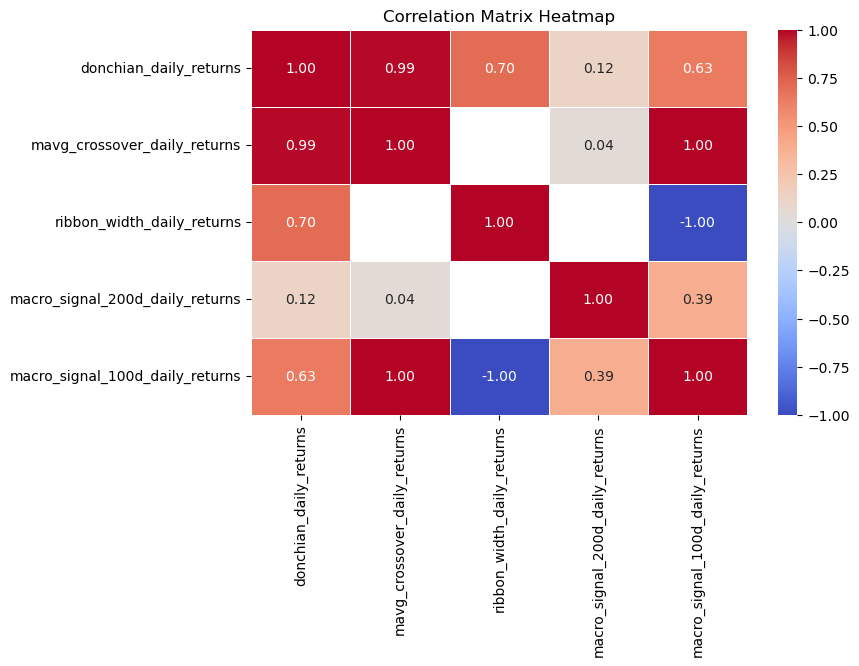

In [293]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr_matrix = df_returns.mask(df_returns == 0).corr()

# Set the figure size
plt.figure(figsize=(8, 5))

# Create the heatmap
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', center=0, linewidths=0.5)

# Set the title
plt.title("Correlation Matrix Heatmap")

# Show the plot
plt.show()

In [113]:
df.head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,357.53,449.19,0,0.0,0.0,0.0,0.0,1.076237,371.33,0,367.89,0.0,0.0,0.0,367.95,-0.027770,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-01,1,331 days,False
2016-02-02,357.53,434.01,0,0.0,0.0,0.0,0.0,1.072386,372.93,No Event,371.33,0.0,0.0,0.0,371.33,0.009186,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-02,1,331 days,False
2016-02-03,357.53,432.77,0,0.0,0.0,0.0,0.0,1.073254,368.87,No Event,372.93,0.0,0.0,0.0,372.93,0.004309,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-03,1,331 days,False
2016-02-04,357.53,430.03,0,0.0,0.0,0.0,0.0,1.073469,387.99,No Event,368.87,0.0,0.0,0.0,368.87,-0.010887,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-04,1,331 days,False
2016-02-05,357.53,418.54,0,0.0,0.0,0.0,0.0,0.814133,384.50,No Event,387.99,0.0,0.0,0.0,387.99,0.051834,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-05,1,331 days,False


In [115]:
df_trend.head()

,BTC-USD_close,BTC-USD_open,BTC-USD_pct_returns,BTC-USD_35_mavg,BTC-USD_35_mavg_slope,BTC-USD_40_mavg,BTC-USD_40_mavg_slope,BTC-USD_45_mavg,BTC-USD_45_mavg_slope,BTC-USD_50_mavg,BTC-USD_50_mavg_slope,BTC-USD_55_mavg,BTC-USD_55_mavg_slope,BTC-USD_60_mavg,BTC-USD_60_mavg_slope,BTC-USD_ribbon_thickness,BTC-USD_trend_signal,BTC-USD_trend_strategy_returns_35_6_60,BTC-USD_trend_strategy_trades_35_6_60,BTC-USD_trend_slope_signal,BTC-USD_trend_slope_strategy_returns,BTC-USD_trend_slope_strategy_trades,BTC-USD_ribbon_thickness_mod,BTC-USD_ribbon_thickness_mod2,BTC-USD_ribbon_thickness_mod_mean,BTC-USD_ribbon_thickness_mod_std,BTC-USD_ribbon_thickness_mod_zscore,BTC-USD_ribbon_thickness_mod2_mean,BTC-USD_ribbon_thickness_mod2_std,BTC-USD_ribbon_thickness_mod2_zscore,BTC-USD_ribbon_thickness_mod_signal,BTC-USD_ribbon_thickness_mod2_signal,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_middle_band_price_t_2,BTC-USD_20_donchian_signal,BTC-USD_t_1_close,BTC-USD_200d_mavg_macro_simple,BTC-USD_200d_mavg_macro_exp,BTC-USD_simple_macro_signal,BTC-USD_exp_macro_signal,final_equal_weighted_signal,final_signal_weighted_signal,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_35_6_60_mavg_crossover_20_donchian_strategy_returns,BTC-USD_35_6_60_mavg_crossover_20_donchian_strategy_trades
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-01-11,449.19,449.99,-0.001778,443.474492,0.781449,443.315818,0.765582,443.191869,0.753187,443.092417,0.743242,443.010877,0.735088,442.942824,0.728282,0.506441,1.0,-0.001778,0.0,0.0,-0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,NaN,NaN,NaN,0,0,0.333333,0.25,-1,0.001778,NaN
2016-01-12,434.01,449.26,-0.033794,442.415178,0.688889,442.309867,0.678312,442.226203,0.669909,442.158208,0.663081,442.101896,0.657426,442.054515,0.652668,0.531669,1.0,-0.033794,0.0,1.0,-0.033794,1.0,0.001184,0.000300,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,449.19,NaN,449.190000,0,0,0.333333,0.25,-1,0.033794,0.0
2016-01-13,432.77,434.01,-0.002857,441.393247,0.714191,441.336363,0.707596,441.289473,0.702204,441.250326,0.697727,441.217231,0.693958,441.188931,0.690746,0.360663,1.0,-0.002857,0.0,1.0,-0.002857,0.0,0.000831,0.000176,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,434.01,NaN,441.524100,0,-1,0.333333,0.25,-1,0.002857,0.0
2016-01-14,430.03,432.70,-0.006331,440.247046,0.610480,440.240943,0.609096,440.232842,0.607683,440.224257,0.606340,440.215848,0.605101,440.207892,0.603974,0.204316,1.0,-0.006331,0.0,1.0,-0.006331,0.0,0.000472,0.000035,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,432.77,NaN,438.547513,0,-1,0.333333,0.25,-1,0.006331,0.0
2016-01-15,357.53,430.04,-0.168593,432.265142,-0.169781,432.595264,-0.137612,432.843845,-0.113415,433.037466,-0.094583,433.192373,-0.079528,433.319027,-0.067227,0.039154,1.0,-0.168593,0.0,1.0,-0.168593,0.0,0.000091,0.000916,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN,NaN,NaN,0,430.03,NaN,436.353832,0,-1,0.333333,0.25,-1,0.168593,0.0


In [247]:
## Donchian Channel Only Performance
performance_metrics

{'annualized_return': 0.34764001836591496,
 'annualized_sharpe_ratio': 1.1696684946303546,
 'calmar_ratio': 0.1708775164952615,
 'annualized_std_dev': 0.23616471346199716,
 'max_drawdown': -2.0344397876098297,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.08907363420427554,
 't_statistic': 3.6205604925209913,
 'p_value': 0.0002997490122264077,
 'trade_count': 405.0}

In [255]:
## Moving Average Crossover Only Performance
performance_metrics

{'annualized_return': 0.004695944487797421,
 'annualized_sharpe_ratio': -0.5546837096444185,
 'calmar_ratio': 0.005918936873631777,
 'annualized_std_dev': 0.07485916676380543,
 'max_drawdown': -0.7933763424167177,
 'max_drawdown_duration': Timedelta('1156 days 00:00:00'),
 'hit_rate': 0.001979414093428345,
 't_statistic': 0.2554909309109224,
 'p_value': 0.7983647567102977,
 'trade_count': 13.0}

In [263]:
## Ribbon Width Only Performance
performance_metrics

{'annualized_return': -0.06571612366765278,
 'annualized_sharpe_ratio': -1.4343342212489252,
 'calmar_ratio': -inf,
 'annualized_std_dev': 0.07916430915383062,
 'max_drawdown': 0.0,
 'max_drawdown_duration': Timedelta('2525 days 00:00:00'),
 'hit_rate': 0.007521773555027712,
 't_statistic': -2.1518489951461692,
 'p_value': 0.0315037944267384,
 'trade_count': 37.0}

In [277]:
## Ribbon Width & Donchian Channel Performance
performance_metrics

{'annualized_return': 0.26176716519770826,
 'annualized_sharpe_ratio': 1.0718272679073257,
 'calmar_ratio': 0.2199869290561772,
 'annualized_std_dev': 0.18684337247180308,
 'max_drawdown': -1.1899214481550484,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.04117181314330958,
 't_statistic': 3.506644388613179,
 'p_value': 0.0004617107665852398,
 'trade_count': 182.0}

In [285]:
## Moving Average Crossover & Donchian Channel Performance
performance_metrics

{'annualized_return': 0.4072296982799757,
 'annualized_sharpe_ratio': 1.4294117923174463,
 'calmar_ratio': 0.36298358128732094,
 'annualized_std_dev': 0.2212017268920184,
 'max_drawdown': -1.121895642871052,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.06690419635787807,
 't_statistic': 4.3406314743516985,
 'p_value': 1.4766825739191315e-05,
 'trade_count': 292.0}

In [296]:
## Moving Average Crossover, Donchian Channel Performance and Ribbon Width Indicator Equal Weighted
performance_metrics

{'annualized_return': 0.29211352334696605,
 'annualized_sharpe_ratio': 1.2098798289061523,
 'calmar_ratio': 0.245489753798356,
 'annualized_std_dev': 0.18488113367526934,
 'max_drawdown': -1.1899214481550484,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.03721298495645289,
 't_statistic': 3.8771097911570824,
 'p_value': 0.00010840096783091848,
 'trade_count': 161.0}

In [108]:
## Moving Average Crossover, Donchian Channel Performance and Ribbon Width Indicator Signal Weighted
performance_metrics

{'annualized_return': 0.29211352334696605,
 'annualized_sharpe_ratio': 1.2098798289061523,
 'calmar_ratio': 0.245489753798356,
 'annualized_std_dev': 0.6563256763385574,
 'max_drawdown': -1.1899214481550484,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.03721298495645289,
 't_statistic': 3.8771097911570824,
 'p_value': 0.00010840096783091848,
 'trade_count': 161.0}

In [229]:
df.head()

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2016-02-01,357.53,449.19,0,0.0,0.0,0.0,0.0,1.076237,371.33,0,367.89,0.0,0.0,0.0,367.95,-0.027770,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-01,1,331 days,False
2016-02-02,357.53,434.01,0,0.0,0.0,0.0,0.0,1.072386,372.93,No Event,371.33,0.0,0.0,0.0,371.33,0.009186,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-02,1,331 days,False
2016-02-03,357.53,432.77,0,0.0,0.0,0.0,0.0,1.073254,368.87,No Event,372.93,0.0,0.0,0.0,372.93,0.004309,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-03,1,331 days,False
2016-02-04,357.53,430.03,0,0.0,0.0,0.0,0.0,1.073469,387.99,No Event,368.87,0.0,0.0,0.0,368.87,-0.010887,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-04,1,331 days,False
2016-02-05,357.53,418.54,0,0.0,0.0,0.0,0.0,0.814133,384.50,No Event,387.99,0.0,0.0,0.0,387.99,0.051834,0.0,0.0,0.0,0.0,0.0,15000.0,0.0,0.0,0.0,15000.0,13500.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2016-02-05,1,331 days,False


In [220]:
## With Ribbon Mod Signal Equal Weighted
performance_metrics

{'annualized_return': 0.08812809363714846,
 'annualized_sharpe_ratio': 0.2870381576186949,
 'calmar_ratio': 0.07955832996489406,
 'annualized_std_dev': 0.1747282647876872,
 'max_drawdown': -1.107716736588562,
 'max_drawdown_duration': Timedelta('799 days 00:00:00'),
 'hit_rate': 0.035629453681710214,
 't_statistic': 1.489738928889646,
 'p_value': 0.13641778761150286,
 'trade_count': 157.0}

In [239]:
## With Ribbon Mod2 Signal
performance_metrics

{'annualized_return': 0.29211352334696605,
 'annualized_sharpe_ratio': 1.2098798289061523,
 'calmar_ratio': 0.245489753798356,
 'annualized_std_dev': 0.18488113367526934,
 'max_drawdown': -1.1899214481550484,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.03721298495645289,
 't_statistic': 3.8771097911570824,
 'p_value': 0.00010840096783091848,
 'trade_count': 161.0}

In [151]:
## With Ribbon Mod2 Signal with a z-score threshold at 0.5 and -0.5
performance_metrics

{'annualized_return': 0.1006204170595204,
 'annualized_sharpe_ratio': 0.49706739930244154,
 'calmar_ratio': 0.3352864349333859,
 'annualized_std_dev': 0.10537094885720731,
 'max_drawdown': -0.300102857067604,
 'max_drawdown_duration': Timedelta('1064 days 00:00:00'),
 'hit_rate': 0.015439429928741092,
 't_statistic': 2.525809675123117,
 'p_value': 0.011603896701851288,
 'trade_count': 61.0}

In [169]:
## With Ribbon Mod Signal with a z-score threshold at 0.5 and -0.5 and no monotonic signal
performance_metrics

{'annualized_return': 0.29211352334696605,
 'annualized_sharpe_ratio': 1.2098798289061523,
 'calmar_ratio': 0.245489753798356,
 'annualized_std_dev': 0.18488113367526934,
 'max_drawdown': -1.1899214481550484,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.03721298495645289,
 't_statistic': 3.8771097911570824,
 'p_value': 0.00010840096783091848,
 'trade_count': 161.0}

In [161]:
## With Ribbon Mod2 Signal with a z-score threshold at 0.5 and -0.5 and no monotonic signal
performance_metrics

{'annualized_return': 0.2429241856003994,
 'annualized_sharpe_ratio': 1.1711974773105711,
 'calmar_ratio': 0.8094697530509549,
 'annualized_std_dev': 0.15361036439495868,
 'max_drawdown': -0.300102857067604,
 'max_drawdown_duration': Timedelta('1054 days 00:00:00'),
 'hit_rate': 0.028503562945368172,
 't_statistic': 3.9166857500952204,
 'p_value': 9.215508331216118e-05,
 'trade_count': 117.0}

In [330]:
## With Macro with 100d Simple Mavg
performance_metrics

{'annualized_return': 0.424938405374653,
 'annualized_sharpe_ratio': 1.4883785052757181,
 'calmar_ratio': 0.3563554767021332,
 'annualized_std_dev': 0.22078679598284492,
 'max_drawdown': -1.192456502443054,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.0665083135391924,
 't_statistic': 4.4968453693300985,
 'p_value': 7.208516122098651e-06,
 'trade_count': 287.0}

In [40]:
## With Macro with 100d Exp Mavg
performance_metrics

{'annualized_return': 0.4072296982799757,
 'annualized_sharpe_ratio': 1.4294117923174463,
 'calmar_ratio': 0.36298358128732094,
 'annualized_std_dev': 0.2212017268920184,
 'max_drawdown': -1.121895642871052,
 'max_drawdown_duration': Timedelta('721 days 00:00:00'),
 'hit_rate': 0.06690419635787807,
 't_statistic': 4.3406314743516985,
 'p_value': 1.4766825739191315e-05,
 'trade_count': 292.0}

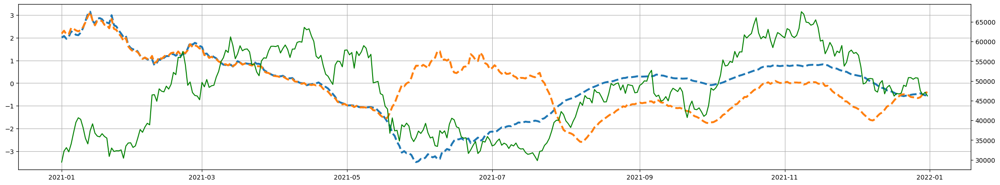

In [118]:
fig = plt.figure(figsize=(22,20))
layout = (5,2)
ribbon_ax = plt.subplot2grid(layout, (0,0), colspan=2)

df_date_cond = (df.index >= pd.Timestamp('2021-01-01').date()) & (df.index <= pd.Timestamp('2021-12-31').date())

ribbon_ax2 = ribbon_ax.twinx()
_ = ribbon_ax.plot(df[df_date_cond].index, df[df_date_cond]['BTC-USD_ribbon_thickness_mod_zscore'], linewidth=3, linestyle='--')
_ = ribbon_ax.plot(df[df_date_cond].index, df[df_date_cond]['BTC-USD_ribbon_thickness_mod2_zscore'], linewidth=3, linestyle='--')
_ = ribbon_ax2.plot(df[df_date_cond].index, df[df_date_cond]['BTC-USD_close'], color='green')

_ = ribbon_ax.grid()
plt.tight_layout()

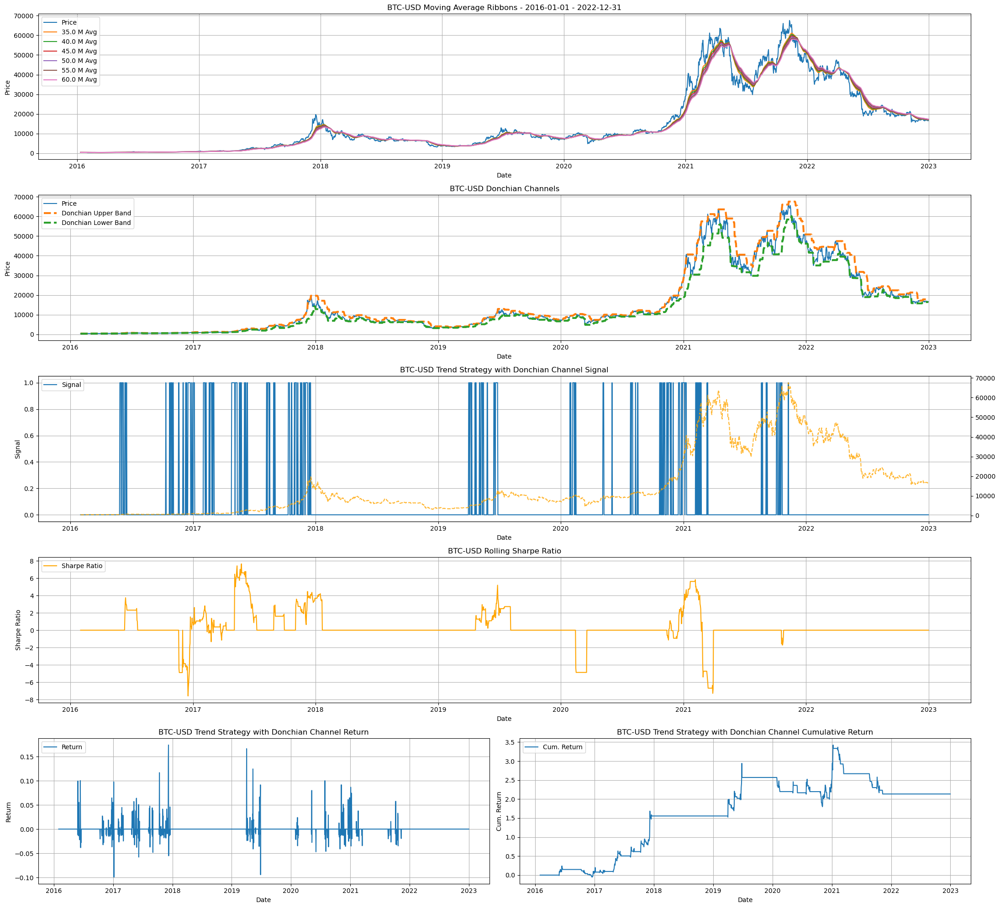

In [287]:
ticker = ticker_list[0]
df_date_cond = (df.index >= pd.Timestamp('2021-01-01').date()) & (df.index <= pd.Timestamp('2021-12-31').date())
df_trend_date_cond = (df_trend.index >= pd.Timestamp('2021-01-01').date()) & (df_trend.index <= pd.Timestamp('2021-12-31').date())
                
plot_trend_following_performance_time_series(df, df_trend, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, 
                                             rolling_sharpe_window)

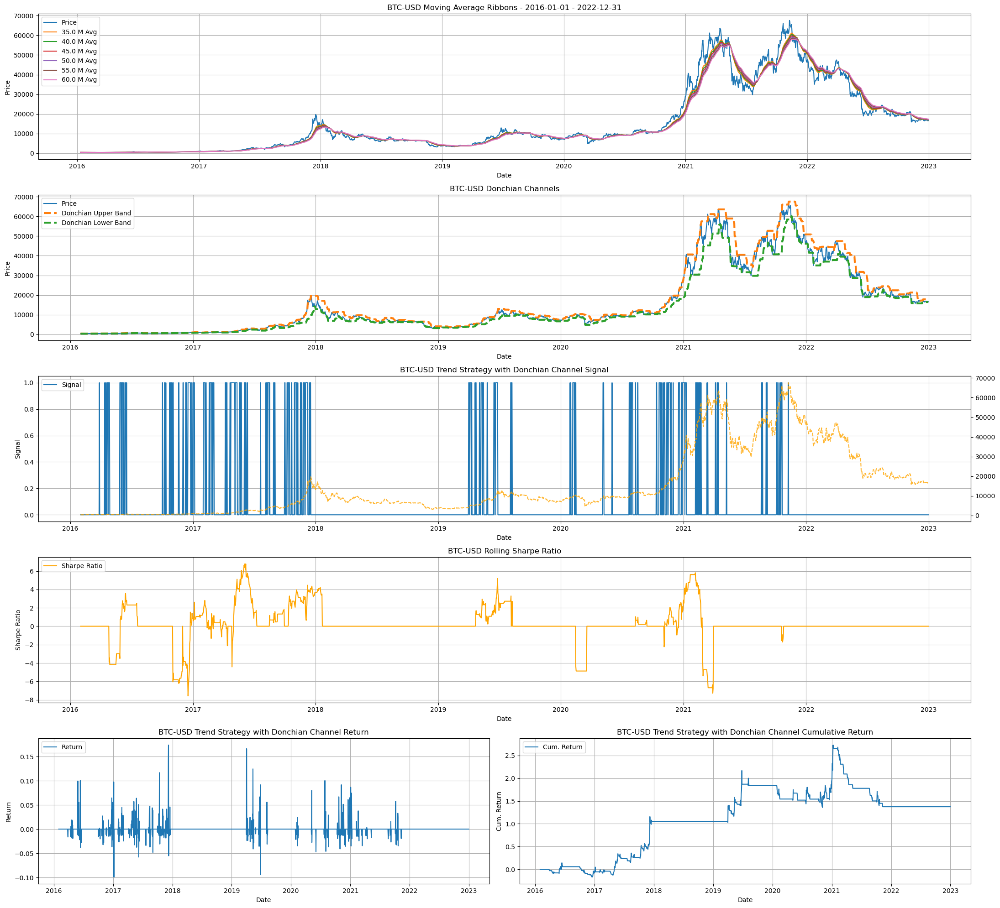

In [288]:
ticker = ticker_list[0]
df_date_cond = (df.index >= pd.Timestamp('2021-01-01').date()) & (df.index <= pd.Timestamp('2021-12-31').date())
df_trend_date_cond = (df_trend.index >= pd.Timestamp('2021-01-01').date()) & (df_trend.index <= pd.Timestamp('2021-12-31').date())
                
plot_trend_following_performance_time_series(df_orig, df_trend_orig, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, 
                                             rolling_sharpe_window)

In [49]:
df_orig['total_portfolio_value'].tail()

date
2022-12-27    159535.853128
2022-12-28    159535.853128
2022-12-29    159535.853128
2022-12-30    159535.853128
2022-12-31    159535.853128
Name: total_portfolio_value, dtype: float64

In [51]:
df['total_portfolio_value'].tail()

date
2022-12-27    171011.271413
2022-12-28    171011.271413
2022-12-29    171011.271413
2022-12-30    171011.271413
2022-12-31    171011.271413
Name: total_portfolio_value, dtype: float64

<Axes: xlabel='date'>

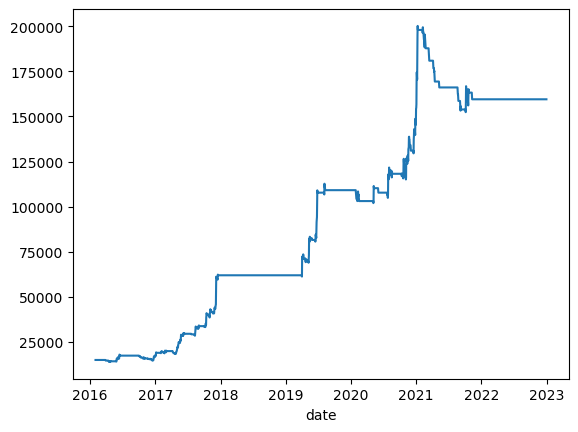

In [47]:
df_orig['total_portfolio_value'].plot()

<Axes: xlabel='date'>

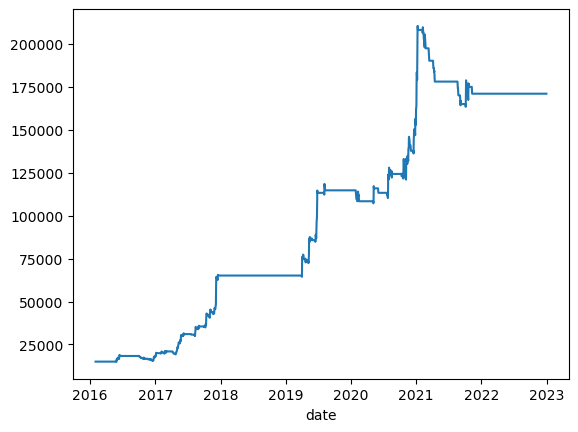

In [45]:
df['total_portfolio_value'].plot()

In [209]:
start_date = pd.to_datetime('2016-01-01').date()
end_date = pd.to_datetime('2022-12-31').date()
ticker_list = ['BTC-USD']
rolling_donchian_window = 20
long_only = True
use_coinbase_data = True
volatility_window = 20
annual_trading_days = 365
rolling_cov_window = 20
annualized_target_volatility = 0.70
use_specific_start_date = False
signal_start_date = None
initial_capital = 15000
cash_buffer_percentage = 0.10
transaction_cost_est = 0.001
passive_trade_rate = 0.05
rolling_sharpe_window = 50
# fast_mavg_list=np.arange(10, 101, 10)
# slow_mavg_list=np.arange(50, 501, 50)
fast_mavg_list = np.arange(5, 51, 5)
slow_mavg_list = np.arange(10, 101, 10)
df_performance_returns = moving_avg_crossover_strategy_performance(start_date, end_date, ticker_list, fast_mavg_list, slow_mavg_list, rolling_donchian_window, long_only, initial_capital,
                                                                   rolling_cov_window, volatility_window, transaction_cost_est, passive_trade_rate,
                                                                   use_coinbase_data, rolling_sharpe_window, cash_buffer_percentage, annualized_target_volatility,
                                                                   annual_trading_days, use_specific_start_date, signal_start_date)

In [84]:
df_performance_returns.shape

(372, 13)

In [255]:
import os

# Ensure the directory exists
if not os.path.exists('trend_following_results'):
    os.makedirs('trend_following_results')

# Save the DataFrame to a pickle file
df_performance_returns.to_pickle('trend_following_results/BTC-USD_Moving_Average_Donchian_Results_Version_2_2016-01-01-2022-12-31.pickle')

In [88]:
df_performance_returns

,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count
0,10,50,2,0.363419,1.287083,0.285899,0.221046,-1.271142,721 days,0.068092,3.966617,0.000075,302.0
1,10,50,4,0.363419,1.287083,0.285899,0.221046,-1.271142,721 days,0.068092,3.966617,0.000075,302.0
2,10,50,6,0.363419,1.287083,0.285899,0.221046,-1.271142,721 days,0.068092,3.966617,0.000075,302.0
3,10,50,8,0.363419,1.287083,0.285899,0.221046,-1.271142,721 days,0.068092,3.966617,0.000075,302.0
4,20,50,2,0.360958,1.281526,0.283964,0.220502,-1.271142,721 days,0.067696,3.953430,0.000079,300.0
5,20,50,4,0.360958,1.281526,0.283964,0.220502,-1.271142,721 days,0.067696,3.953430,0.000079,300.0
6,20,50,6,0.360958,1.281526,0.283964,0.220502,-1.271142,721 days,0.067696,3.953430,0.000079,300.0
7,20,50,8,0.360958,1.281526,0.283964,0.220502,-1.271142,721 days,0.067696,3.953430,0.000079,300.0
8,30,50,2,0.392139,1.378250,0.349533,0.221656,-1.121896,721 days,0.068488,4.204851,0.000027,300.0
9,30,50,4,0.392139,1.378250,0.349533,0.221656,-1.121896,721 days,0.068488,4.204851,0.000027,300.0


In [217]:
df_performance_returns.sort_values('sharpe_ratio', ascending=False)

,fast_mavg,slow_mavg,stepsize,annualized_return,sharpe_ratio,calmar_ratio,annualized_std_dev,max_drawdown,max_drawdown_duration,hit_rate,t_statistic,p_value,trade_count
127,35,60,8,0.407230,1.429412,0.362984,0.221202,-1.121896,721 days,0.066904,4.340631,0.000015,292.0
126,35,60,6,0.407230,1.429412,0.362984,0.221202,-1.121896,721 days,0.066904,4.340631,0.000015,292.0
125,35,60,4,0.407230,1.429412,0.362984,0.221202,-1.121896,721 days,0.066904,4.340631,0.000015,292.0
124,35,60,2,0.407230,1.429412,0.362984,0.221202,-1.121896,721 days,0.066904,4.340631,0.000015,292.0
264,10,100,2,0.385787,1.428746,0.343871,0.208840,-1.121896,721 days,0.064133,4.373230,0.000013,276.0
265,10,100,4,0.385787,1.428746,0.343871,0.208840,-1.121896,721 days,0.064133,4.373230,0.000013,276.0
266,10,100,6,0.385787,1.428746,0.343871,0.208840,-1.121896,721 days,0.064133,4.373230,0.000013,276.0
267,10,100,8,0.385787,1.428746,0.343871,0.208840,-1.121896,721 days,0.064133,4.373230,0.000013,276.0
119,25,60,8,0.406513,1.426464,0.362345,0.221319,-1.121896,721 days,0.067300,4.332570,0.000015,293.0
116,25,60,2,0.406513,1.426464,0.362345,0.221319,-1.121896,721 days,0.067300,4.332570,0.000015,293.0


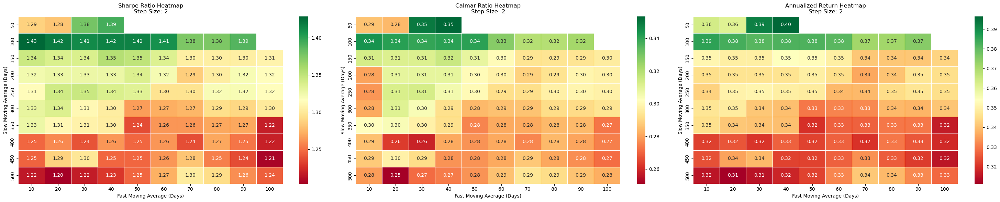

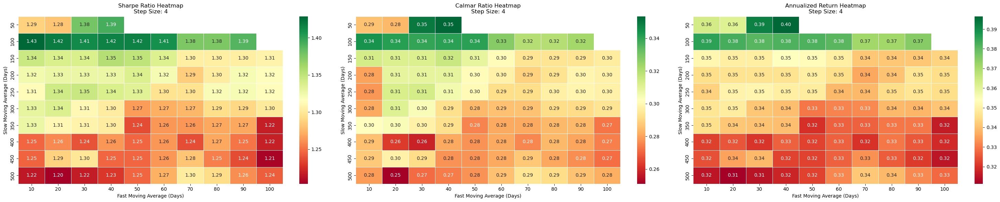

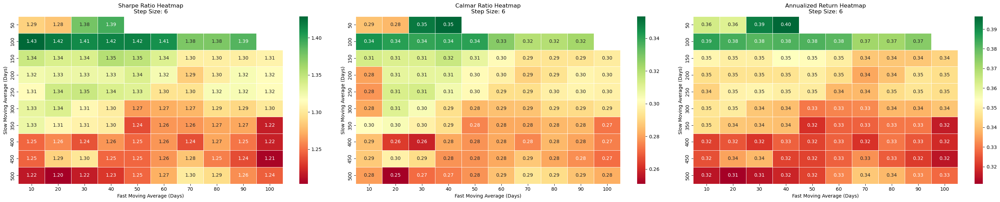

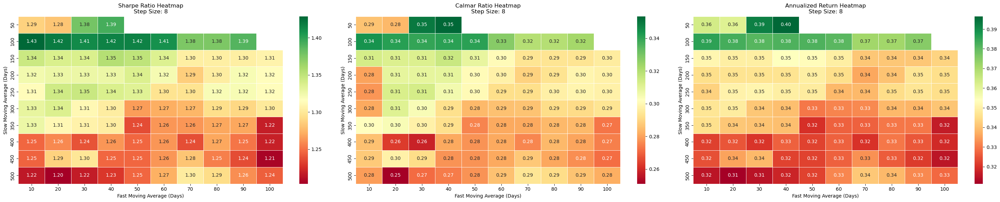

In [142]:
plot_moving_avg_crossover_performance_heatmap(df_performance_returns)

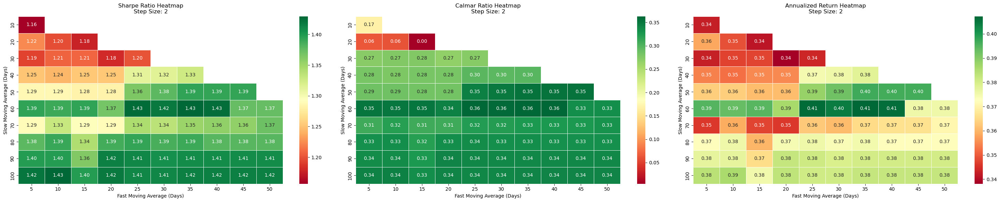

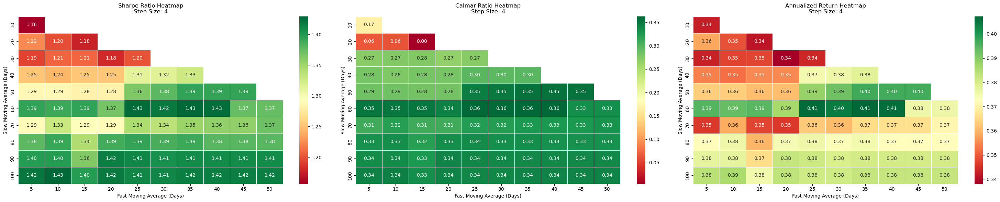

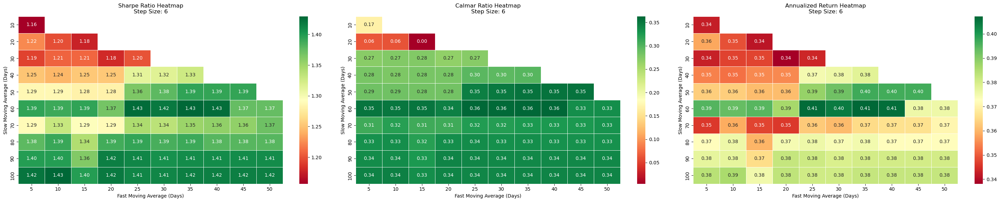

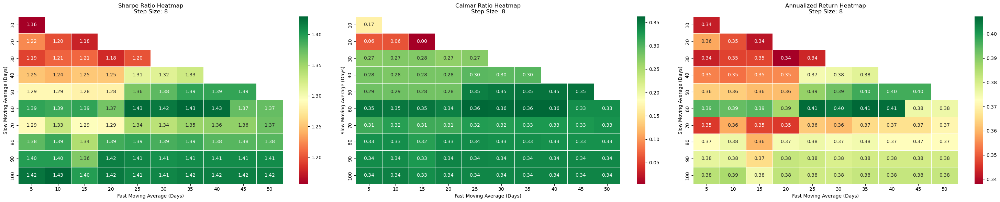

In [211]:
plot_moving_avg_crossover_performance_heatmap(df_performance_returns)

<Axes: xlabel='date'>

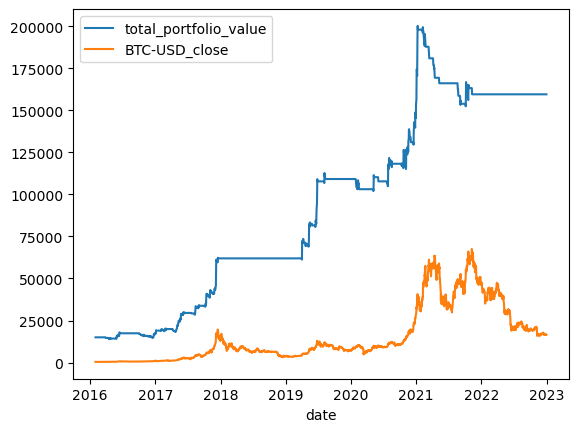

In [261]:
df[['total_portfolio_value','BTC-USD_close']].plot()

<Axes: xlabel='date'>

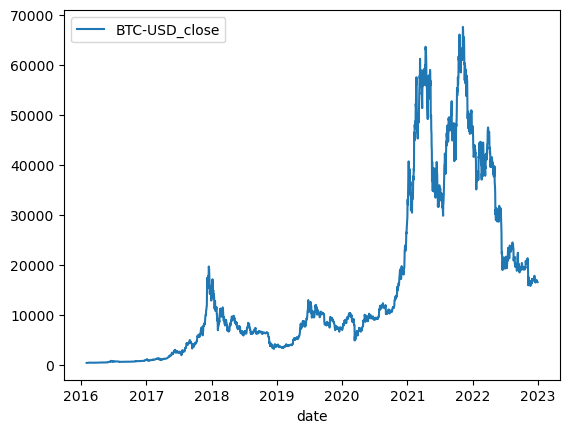

In [281]:
df[['BTC-USD_close']].plot()

In [271]:
df[(df.index > pd.Timestamp('2021-01-01').date()) & (df.index < pd.Timestamp('2021-12-31').date()) & (df['BTC-USD_event'] != 'No Event')]

,BTC-USD_20_donchian_lower_band_price_t_2,BTC-USD_20_donchian_upper_band_price_t_2,BTC-USD_35_6_60_mavg_crossover_20_donchian_signal,BTC-USD_actual_position_entry_price,BTC-USD_actual_position_exit_price,BTC-USD_actual_position_notional,BTC-USD_actual_size,BTC-USD_annualized_volatility_20,BTC-USD_close,BTC-USD_event,BTC-USD_open,BTC-USD_position_volatility_adjusted_weight,BTC-USD_short_sale_proceeds,BTC-USD_stop_loss,BTC-USD_t_1_close,BTC-USD_t_1_close_pct_returns,BTC-USD_target_notional,BTC-USD_target_size,BTC-USD_target_vol_normalized_weight,BTC-USD_vol_adjusted_trend_signal,daily_portfolio_volatility,available_cash,count_of_positions,total_actual_position_notional,total_target_notional,total_portfolio_value,total_portfolio_value_upper_limit,target_vol_scaling_factor,target_notional_scaling_factor,portfolio_daily_pct_returns,portfolio_strategy_cumulative_return,portfolio_rolling_sharpe_50,strategy_cumulative_return,strategy_cumulative_return_cum_max,strategy_cumulative_return_drawdown,strategy_cumulative_return_drawdown_pct,End,Start,strategy_cumulative_return_DDDuration,profitable_trade
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-02,18821.28,28990.08,1,27039.39,0.00,142096.216085,4.831021,0.639606,32225.91,Open Long Position,29413.29,1.0,0.0,0.0,29412.84,0.014583,139277.328744,4.735256,1.094424,1.563462,0.033479,14700.907726,1.0,142096.216085,139277.328744,156797.123811,139277.328744,1.094424,0.913723,0.013212,9.453142,4.204626,9.453142,9.453142,0.000000,0.000000,2021-01-02,81,0 days,True
2021-01-03,19166.65,29412.84,1,27039.39,0.00,155669.403843,4.831021,0.709962,33080.66,Open Long Position,32222.88,1.0,0.0,0.0,32225.91,0.095641,139137.301777,4.317560,0.985968,1.408526,0.037161,14700.907726,1.0,155669.403843,139137.301777,170370.311569,141117.411430,0.985968,1.000000,0.086565,10.358021,5.045110,10.358021,10.358021,0.000000,0.000000,2021-01-03,82,0 days,True
2021-01-04,19272.37,32225.91,1,27039.39,0.00,159823.888498,4.831021,0.703418,32019.99,Open Long Position,33082.84,1.0,0.0,0.0,33080.66,0.026524,152588.228769,4.612611,0.995141,1.421630,0.036819,14700.907726,1.0,159823.888498,152588.228769,174524.796225,153333.280412,0.995141,1.000000,0.024385,10.634986,5.668843,10.634986,10.634986,0.000000,0.000000,2021-01-04,83,2 days,True
2021-01-05,19444.60,33080.66,0,0.00,33080.66,0.000000,0.000000,0.745326,34030.64,Closing Long Position,32020.22,0.0,0.0,0.0,32019.99,-0.032063,0.000000,0.000000,0.000000,0.000000,0.000000,172484.634967,0.0,0.000000,0.000000,172484.634967,157072.316602,0.000000,1.000000,-0.011690,10.498976,5.431691,10.498976,10.634986,-0.136011,-0.012789,2021-01-05,83,2 days,False
2021-01-06,21359.65,33080.66,1,34043.91,0.00,153264.672093,4.501970,0.692308,36859.26,New Long Position,34043.91,1.0,0.0,0.0,34030.64,0.062794,155236.171470,4.561659,1.011111,1.444444,0.036237,17248.463497,1.0,153264.672093,155236.171470,170513.135589,155236.171470,1.011111,0.989011,-0.011430,10.367542,5.431691,10.367542,10.634986,-0.267444,-0.025148,2021-01-06,83,2 days,False
2021-01-07,22729.40,34030.64,1,34043.91,0.00,165939.294208,4.501970,0.712602,39505.56,Open Long Position,36859.26,1.0,0.0,0.0,36859.26,0.083120,150747.954957,4.089826,0.982316,1.403308,0.037299,17248.463497,1.0,165939.294208,150747.954957,183187.757705,153461.822030,0.982316,1.000000,0.074332,11.212517,5.538197,11.212517,11.212517,0.000000,0.000000,2021-01-07,84,0 days,True
2021-01-08,22729.40,36859.26,1,34043.91,0.00,177875.323074,4.501970,0.737821,40665.15,Open Long Position,39510.55,1.0,0.0,0.0,39505.56,0.071795,156417.684132,3.959384,0.948739,1.355342,0.038619,17248.463497,1.0,177875.323074,156417.684132,195123.786571,164868.981934,0.948739,1.000000,0.065157,12.008252,6.142498,12.008252,12.008252,0.000000,0.000000,2021-01-08,85,0 days,True
2021-01-09,22729.40,39505.56,1,34043.91,0.00,182969.752678,4.501970,0.737735,40257.43,Open Long Position,40642.15,1.0,0.0,0.0,40665.15,0.029353,166628.810205,4.097583,0.948850,1.355499,0.038615,17248.463497,1.0,182969.75